<h1 style="color: red; font-family: sans-serif; font-size: 50px; font-weight: bold; font-style: italic; text-align: center;">
    Product Sales Forecasting
</h1>


In the competitive retail industry, the ability to predict future sales accurately is crucial for operational and strategic planning. Product sales forecasting aims to estimate the number of products a store will sell in the future, based on various influencing factors such as store type, location, regional characteristics, promotional activities, and temporal variations (such as holidays and seasons). This project focuses on developing a predictive model that uses historical sales data from different stores to forecast sales for upcoming periods.
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   
Data description
 - ID: Unique identifier for each record in the dataset.
 - Store_id: Unique identifier for each store.
 - Store_Type: Categorization of the store based on its type.
 - Location_Type: Classification of the store's location (e.g., urban, suburban).
 - Region_Code: Code representing the geographical region where the store is located.
 - Date: The specific date on which the data was recorded.
 - Holiday: Indicator of whether the date was a holiday (1: Yes, 0: No).
 - Discount: Indicates whether a discount was offered on the given date (Yes/No).
 - #Order: The number of orders received by the store on the specified day.
 - Sales: Total sales amount for the store on the given day.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import statsmodels.api as sm

from scipy.stats import chi2_contingency,ttest_ind,shapiro,levene,kruskal,pearsonr, spearmanr
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import (
    mean_squared_error as mse,
    mean_absolute_error as mae,
    mean_absolute_percentage_error as mape
)
from sklearn.linear_model import LinearRegression,Ridge
from xgboost import XGBRegressor

from skforecast.recursive import ForecasterRecursive
from skforecast.preprocessing import RollingFeatures

#Importing Time Series Libraries/ Modules
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from itertools import product
import logging
warnings.filterwarnings('ignore')
pd.set_option('display.float_format', '{:,.2f}'.format)

In [2]:
df = pd.read_csv('TRAIN.csv')

In [3]:
df_test = pd.read_csv('TEST_FINAL.csv')

In [4]:
df.head()

,ID,Store_id,Store_Type,Location_Type,Region_Code,Date,Holiday,Discount,#Order,Sales
0,T1000001,1,S1,L3,R1,2018-01-01,1,Yes,9,"7,011.84"
1,T1000002,253,S4,L2,R1,2018-01-01,1,Yes,60,"51,789.12"
2,T1000003,252,S3,L2,R1,2018-01-01,1,Yes,42,"36,868.20"
3,T1000004,251,S2,L3,R1,2018-01-01,1,Yes,23,"19,715.16"
4,T1000005,250,S2,L3,R4,2018-01-01,1,Yes,62,"45,614.52"


<h4><font color="cyan" style="sans-serif">Observation</font></h4>

* ID: Unique identifier for each record in the dataset.
* Store_id: Unique identifier for each store.
* Store_Type: Categorization of the store based on its type.
* Location_Type: Classification of the store's location (e.g., urban, suburban).
* Region_Code: Code representing the geographical region where the store is located.
* Date: The specific date on which the data was recorded.
* Holiday: Indicator of whether the date was a holiday (1: Yes, 0: No).
* Discount: Indicates whether a discount was offered on the given date (Yes/No).
* #Order: The number of orders received by the store on the specified day.
Sales: Total sales amount for the store on the given day.


<h2><font color="red" style="sans-serif">Exploratory Data Analysis</font></h2>

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188340 entries, 0 to 188339
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   ID             188340 non-null  object 
 1   Store_id       188340 non-null  int64  
 2   Store_Type     188340 non-null  object 
 3   Location_Type  188340 non-null  object 
 4   Region_Code    188340 non-null  object 
 5   Date           188340 non-null  object 
 6   Holiday        188340 non-null  int64  
 7   Discount       188340 non-null  object 
 8   #Order         188340 non-null  int64  
 9   Sales          188340 non-null  float64
dtypes: float64(1), int64(3), object(6)
memory usage: 14.4+ MB


In [6]:
df.isna().sum()

ID               0
Store_id         0
Store_Type       0
Location_Type    0
Region_Code      0
Date             0
Holiday          0
Discount         0
#Order           0
Sales            0
dtype: int64

In [7]:
print(f"Number of duplicate entries: {df.duplicated().sum()}")

Number of duplicate entries: 0


In [8]:
df['Date'] = pd.to_datetime(df['Date'])

In [9]:
df.rename(columns = {'#Order':'Orders'}, inplace = True)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188340 entries, 0 to 188339
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   ID             188340 non-null  object        
 1   Store_id       188340 non-null  int64         
 2   Store_Type     188340 non-null  object        
 3   Location_Type  188340 non-null  object        
 4   Region_Code    188340 non-null  object        
 5   Date           188340 non-null  datetime64[ns]
 6   Holiday        188340 non-null  int64         
 7   Discount       188340 non-null  object        
 8   Orders         188340 non-null  int64         
 9   Sales          188340 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(3), object(5)
memory usage: 14.4+ MB


In [11]:
df.describe(include = "all")

,ID,Store_id,Store_Type,Location_Type,Region_Code,Date,Holiday,Discount,Orders,Sales
count,188340,"188,340.00",188340,188340,188340,188340,"188,340.00",188340,"188,340.00","188,340.00"
unique,188340,NaN,4,5,4,NaN,NaN,2,NaN,NaN
top,T1188340,NaN,S1,L1,R1,NaN,NaN,No,NaN,NaN
freq,1,NaN,88752,85140,63984,NaN,NaN,104051,NaN,NaN
mean,NaN,183.00,NaN,NaN,NaN,2018-09-15 12:00:00.000000256,0.13,NaN,68.21,"42,784.33"
min,NaN,1.00,NaN,NaN,NaN,2018-01-01 00:00:00,0.00,NaN,0.00,0.00
25%,NaN,92.00,NaN,NaN,NaN,2018-05-09 18:00:00,0.00,NaN,48.00,"30,426.00"
50%,NaN,183.00,NaN,NaN,NaN,2018-09-15 12:00:00,0.00,NaN,63.00,"39,678.00"
75%,NaN,274.00,NaN,NaN,NaN,2019-01-22 06:00:00,0.00,NaN,82.00,"51,909.00"
max,NaN,365.00,NaN,NaN,NaN,2019-05-31 00:00:00,1.00,NaN,371.00,"247,215.00"


In [12]:
print('No of stores with 0 sales:', df[df['Sales'] < 1].shape[0])

No of stores with 0 sales: 19


In [13]:
df.nunique()

ID               188340
Store_id            365
Store_Type            4
Location_Type         5
Region_Code           4
Date                516
Holiday               2
Discount              2
Orders              299
Sales             47422
dtype: int64

<h2><font color="red" style="sans-serif">Univariate Analysis</font></h2>

In [14]:
# View value counts for each categorical column
for col in ['Store_id', 'Store_Type', 'Location_Type', 'Region_Code','Holiday','Discount']:
    print(f"\nValue counts for {col}:\n")
    print(round(df[col].value_counts(normalize= True)*100,2))


Value counts for Store_id:

Store_id
364   0.27
1     0.27
253   0.27
252   0.27
251   0.27
      ... 
238   0.27
239   0.27
240   0.27
241   0.27
242   0.27
Name: proportion, Length: 365, dtype: float64

Value counts for Store_Type:

Store_Type
S1   47.12
S4   24.38
S2   15.34
S3   13.15
Name: proportion, dtype: float64

Value counts for Location_Type:

Location_Type
L1   45.21
L2   25.75
L3   15.89
L5    7.40
L4    5.75
Name: proportion, dtype: float64

Value counts for Region_Code:

Region_Code
R1   33.97
R2   28.77
R3   23.56
R4   13.70
Name: proportion, dtype: float64

Value counts for Holiday:

Holiday
0   86.82
1   13.18
Name: proportion, dtype: float64

Value counts for Discount:

Discount
No    55.25
Yes   44.75
Name: proportion, dtype: float64


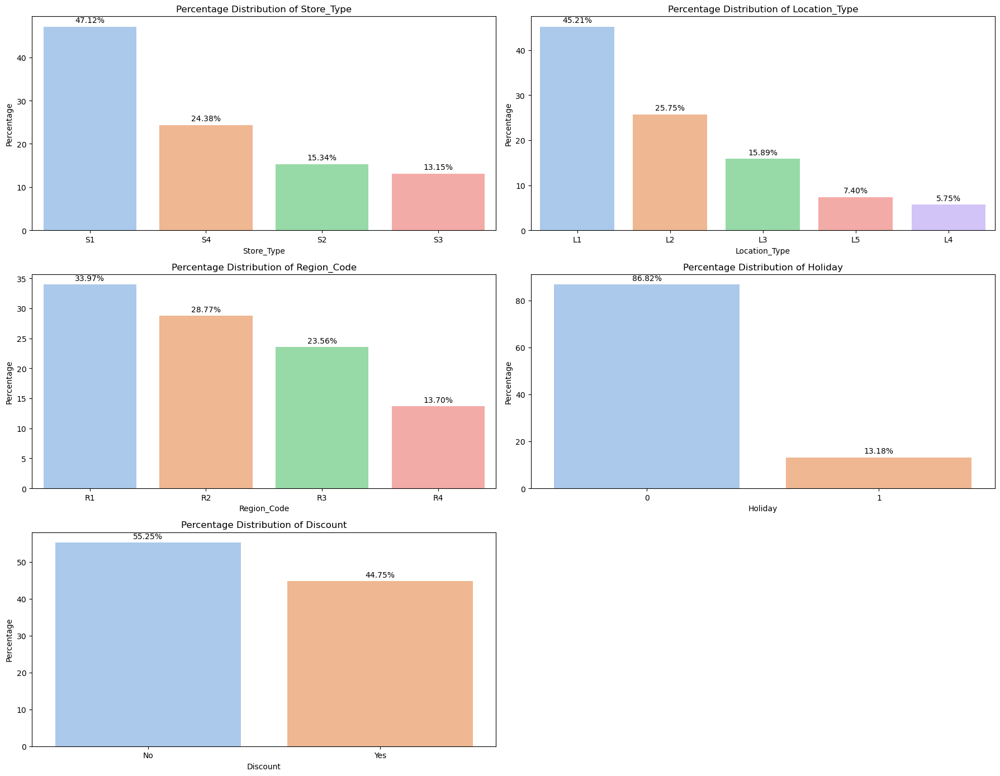

In [15]:
# List of categorical columns
categorical_cols = ['Store_Type', 'Location_Type', 'Region_Code', 'Holiday', 'Discount']

# Create subplots: adjust rows & cols as per number of categories
rows = (len(categorical_cols) + 1) // 2   # 2 columns layout
cols = 2

fig, axes = plt.subplots(rows, cols, figsize=(18, 14))
axes = axes.flatten()  # Flatten in case of multiple rows

# Plot each categorical column in a subplot
for i, col in enumerate(categorical_cols):
    percent_data_x = df[col].value_counts(normalize=True).index
    percent_data_y = round(df[col].value_counts(normalize=True) * 100, 2).values
    
    ax = sns.barplot(x=percent_data_x, y=percent_data_y, palette='pastel', ax=axes[i])
    
    # Add labels using bar_label
    for container in ax.containers:
        ax.bar_label(container, fmt='%.2f%%', label_type='edge', padding=3)
    
    ax.set_title(f'Percentage Distribution of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Percentage')

# Hide unused axes if any
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


<h4><font color="cyan" style="sans-serif">Observations</font></h4>

1. Store_id
  * 365 unique store IDs, each contributing 0.27% of the data.
  * Distribution is uniform — suggests equal data logging across all stores.

2. Store_Type
  * 4 unique values - S1, S2, S3 and S4.
  * S1 stores dominate, nearly half the dataset.

3. Location_Type
  * 5 unique values - L1, L2, L3, L4 and L5.
  * L1 is the most common location type.
  * L4 and L5 are underrepresented.

4.  Region_Code
  * 4 unique values - R1, R2, R3 and R4.
  * Region spread is slightly skewed toward R1, but still fairly balanced.

5.  Holiday
  * Most transactions are on non-holidays.
      
6.  Discount
  * Slightly skew toward no-discount entries.


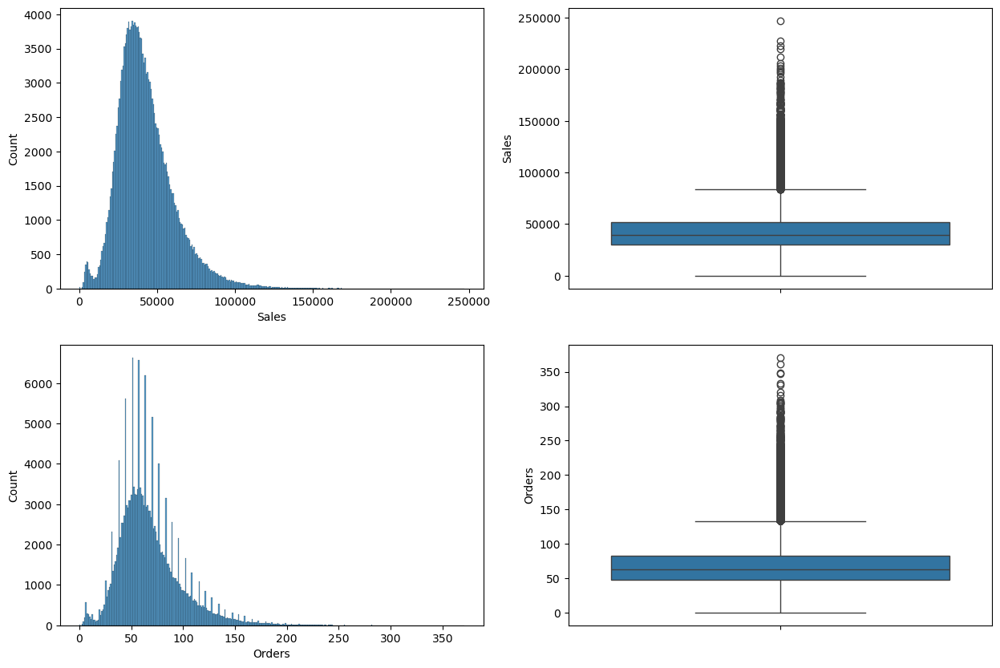

In [16]:
plt.figure(figsize=(15, 10))
plt.subplot(2,2,1)
sns.histplot(df['Sales'])
plt.subplot(2,2,2)
sns.boxplot(y=df["Sales"])
plt.subplot(2,2,3)
sns.histplot(df['Orders'])
plt.subplot(2,2,4)
sns.boxplot(y= df["Orders"])
plt.show()

<h4><font color="cyan" style="sans-serif">Observations</font></h4>
* The histogram indicates that Sales is right-skewed, with a long tail.

* Most sales are clustered between 20,000 to 60,000, but a few values reach beyond 200,000.

<h2><font color="red" style="sans-serif">Bivariate Analysis</font></h2>

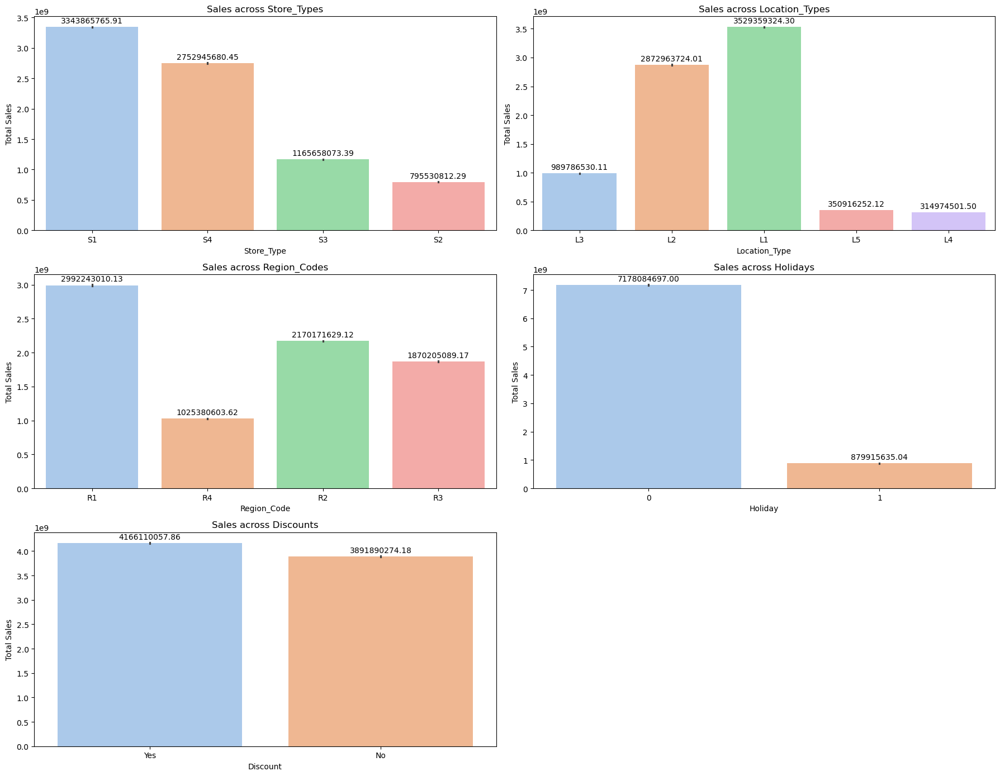

In [17]:
# List of categorical columns
categorical_cols = ['Store_Type', 'Location_Type', 'Region_Code', 'Holiday', 'Discount']

# Create subplot grid
rows = (len(categorical_cols) + 1) // 2   # 2 columns layout
cols = 2

fig, axes = plt.subplots(rows, cols, figsize=(18, 14))
axes = axes.flatten()

# Plot each categorical column
for i, col in enumerate(categorical_cols):
    ax = sns.barplot(
        x=df[col], 
        y=df['Sales'], 
        estimator="sum", 
        palette='pastel', 
        ax=axes[i]
    )
    
    # Add labels on bars
    for container in ax.containers:
        ax.bar_label(container, fmt='%0.2f', label_type='edge', padding=3)

    ax.set_title(f'Sales across {col}s')
    ax.set_xlabel(col)
    ax.set_ylabel('Total Sales')

# Hide unused axes if any
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

<h4><font color="cyan" style="sans-serif">Observations</font></h4>

1. Store_Type
Distribution:

  * S1 dominates (47.12%), followed by S4 (24.38%), S2 (15.34%), and S3 (13.15%).

  * Highest from S1 (₹3.34B), followed by S4 (₹2.75B).

  * Average Sales per Record: Highest for S4 (₹59.9K), then S3 (₹47K), and lowest for S2 (~₹27.5K).


    S4 stores are fewer but highly productive. S1 has volume advantage but lower per-record sales.
  
2. Location_Type
Distribution:

  * Most common: L1 (45.21%), then L2 (25.75%).

  * Total Sales highest in L1 (₹3.53B) and L2 (₹2.87B).

  * Average Sales per Record: Highest in L2 (₹59.2K), lowest in L5 (₹25.2K).

    
    L2 is highly efficient with fewer entries but higher sales per entry.*

3. Region_Code
Distribution:

  * R1 (33.97%) leads, followed by R2, R3, and R4.

  * Total Sales highest from R1 (~₹2.99B).

  * Average Sales is highest for R1 (~₹46.7K), followed closely by R3 and R2.
    
    
    R1 leads both in volume and efficiency.

4. Holiday
Distribution:

  * Non-holiday days: 86.82%, Holiday days: 13.18%.

  * Total Sales: Most sales happen on regular days (~₹7.18B).

  * Average Sales per Record: Sales drop on holidays (~₹35.4K vs. ₹43.9K on regular days).


    Holidays negatively impact sales performance.

5. Discount
Distribution:

  * No Discount (55.25%), Discount (44.75%).

  * Total Sales isHigher sales when discount is applied (~₹4.17B vs. ₹3.89B).

  * Average Sales per record are significantly higher with discounts (~₹49.4K vs. ₹37.4K).


    Discounts strongly boost both total and average sales.

In [18]:
df_copy = df.copy(deep = True)

# **Preparing Datasets for Time Series Analysis**

Using the given data we can forecast sales at the company, regional, location type, store type and store level. Creating and handling multiple datasets and forecasting sales for all cases would be cumbersome.

Since the brief does not mention whether the forecasting is required to be done at the company, regional, location type, or store level, we are assuming that the company and decision makers will be most informed by analysis and sales forecast at the overall company and regional levels.

Using functions for training, and evaluation we will bult a reusable pipeline that can later be adapted and applied to location type, store type or individual store level data if needed, saving significant effort.

**Dataset to be created:**

* Company Level Dataset: ts_co
* Regional Datasets: ts_r1, ts_r2, ts_r3, ts_r4

**Handling Discount while Grouping & Aggregating:**
* Discounts are not applied uninformly across stores i.e. on a certain day not all 365 stores have or don't have discounts.
* Discount is applicable to a single store on a single day, so when grouping and aggregating the dataset for Company level or Regional level time series we will represent Discount as proportion of stores on Discount on that day for Company level data and proportion of stores on Discount on that day in that region for Region Level Data.
* The approach was chosen since Proportion of Sales, which a better indicator of discount impact, would not be available for test and real world data.

<h4><font color="cyan" style="sans-serif">Company Level Data</font></h4>

In [19]:
# Company Level Data
df['Discounted_Flag'] = df['Discount'].apply(lambda x: 1 if x == 'Yes' else 0)
df.head()

,ID,Store_id,Store_Type,Location_Type,Region_Code,Date,Holiday,Discount,Orders,Sales,Discounted_Flag
0,T1000001,1,S1,L3,R1,2018-01-01,1,Yes,9,"7,011.84",1
1,T1000002,253,S4,L2,R1,2018-01-01,1,Yes,60,"51,789.12",1
2,T1000003,252,S3,L2,R1,2018-01-01,1,Yes,42,"36,868.20",1
3,T1000004,251,S2,L3,R1,2018-01-01,1,Yes,23,"19,715.16",1
4,T1000005,250,S2,L3,R4,2018-01-01,1,Yes,62,"45,614.52",1


In [20]:
ts_co = df.groupby('Date').agg({'Holiday':'last', 'Discounted_Flag': lambda x: x.sum() / x.count(),'Orders':'sum', 'Sales':'sum'}).reset_index()
ts_co.set_index('Date', inplace = True)
ts_co.head()

,Holiday,Discounted_Flag,Orders,Sales
Date,,,,
2018-01-01,1,1.00,19666,"15,345,484.50"
2018-01-02,0,1.00,25326,"19,592,415.00"
2018-01-03,0,1.00,24047,"18,652,527.00"
2018-01-04,0,1.00,25584,"19,956,267.00"
2018-01-05,0,1.00,28436,"22,902,651.00"


In [21]:
ts_co.rename(columns = {"Discounted_Flag":"Discounted Stores"}, inplace = True)
ts_co.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 516 entries, 2018-01-01 to 2019-05-31
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Holiday            516 non-null    int64  
 1   Discounted Stores  516 non-null    float64
 2   Orders             516 non-null    int64  
 3   Sales              516 non-null    float64
dtypes: float64(2), int64(2)
memory usage: 20.2 KB


<h4><font color="cyan" style="sans-serif">Regional Datasets</font></h4>

In [22]:
ts_r1 = df[df['Region_Code'] == 'R1']
ts_r2 = df[df['Region_Code'] == 'R2']
ts_r3 = df[df['Region_Code'] == 'R3']
ts_r4 = df[df['Region_Code'] == 'R4']

In [23]:
ts_r1 = ts_r1.groupby('Date').agg({'Holiday': 'last', 'Discount': 'last','Discounted_Flag': lambda x: x.sum() / x.count(), 'Orders': 'sum','Sales': 'sum'})
ts_r2 = ts_r2.groupby('Date').agg({'Holiday': 'last', 'Discount': 'last','Discounted_Flag': lambda x: x.sum() / x.count(), 'Orders': 'sum','Sales': 'sum'})
ts_r3 = ts_r3.groupby('Date').agg({'Holiday': 'last', 'Discount': 'last','Discounted_Flag': lambda x: x.sum() / x.count(), 'Orders': 'sum','Sales': 'sum'})
ts_r4 = ts_r4.groupby('Date').agg({'Holiday': 'last', 'Discount': 'last','Discounted_Flag': lambda x: x.sum() / x.count(), 'Orders': 'sum','Sales': 'sum'})

In [24]:
ts_r1.rename(columns = {'Discounted_Flag':'Discounted Stores'}, inplace = True)
ts_r2.rename(columns = {'Discounted_Flag':'Discounted Stores'}, inplace = True)
ts_r3.rename(columns = {'Discounted_Flag':'Discounted Stores'}, inplace = True)
ts_r4.rename(columns = {'Discounted_Flag':'Discounted Stores'}, inplace = True)

In [25]:
ts_r1.sample(5)

,Holiday,Discount,Discounted Stores,Orders,Sales
Date,,,,,
2018-09-02,0,Yes,1.00,11546,"6,624,891.00"
2018-01-28,0,Yes,0.99,14356,"9,016,356.00"
2019-02-24,0,No,0.02,10299,"5,493,486.00"
2018-07-30,0,No,0.00,8485,"4,548,555.00"
2019-05-11,0,No,0.40,11780,"7,418,088.00"


In [26]:
ts_co.to_csv('ts_co.csv')
ts_r1.to_csv('ts_r1.csv')
ts_r2.to_csv('ts_r2.csv')
ts_r3.to_csv('ts_r3.csv')
ts_r4.to_csv('ts_r4.csv')

<h3><font color="red" style="sans-serif">Outlier/Anamoly Detection</font></h3>

In [27]:
datasets = {'Company': ts_co, 'Region 1': ts_r1, 'Region 2': ts_r2, 'Region 3': ts_r3, 'Region 4':ts_r4}

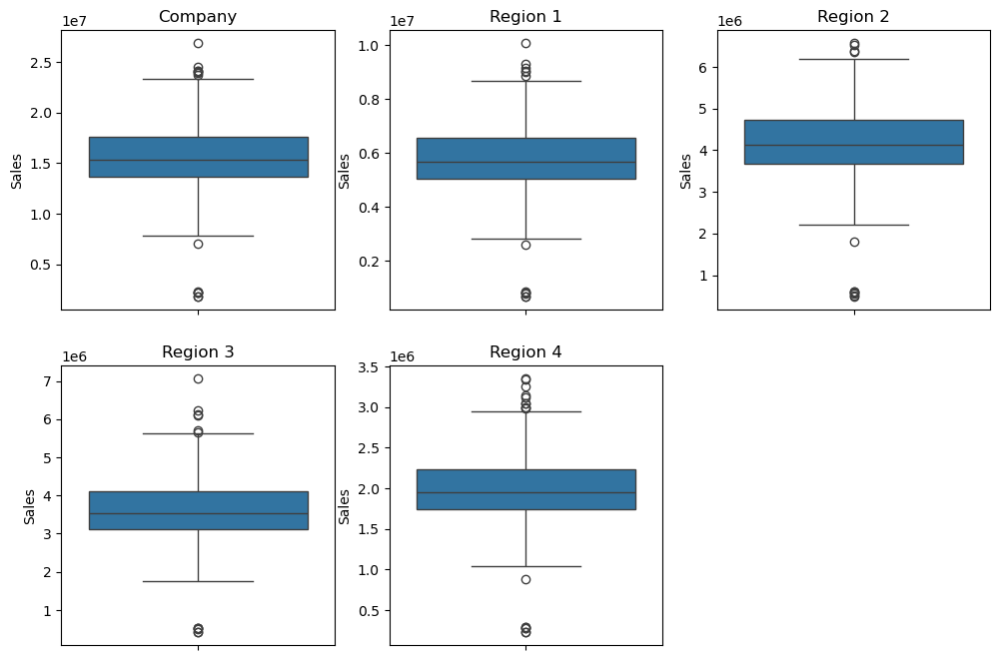

In [28]:
plt.figure(figsize=(12, 8))

for i, (name, data) in enumerate(datasets.items()):
  plt.subplot(2, 3, i+1)
  sns.boxplot(data['Sales'])
  plt.title(f'{name}')

plt.show()

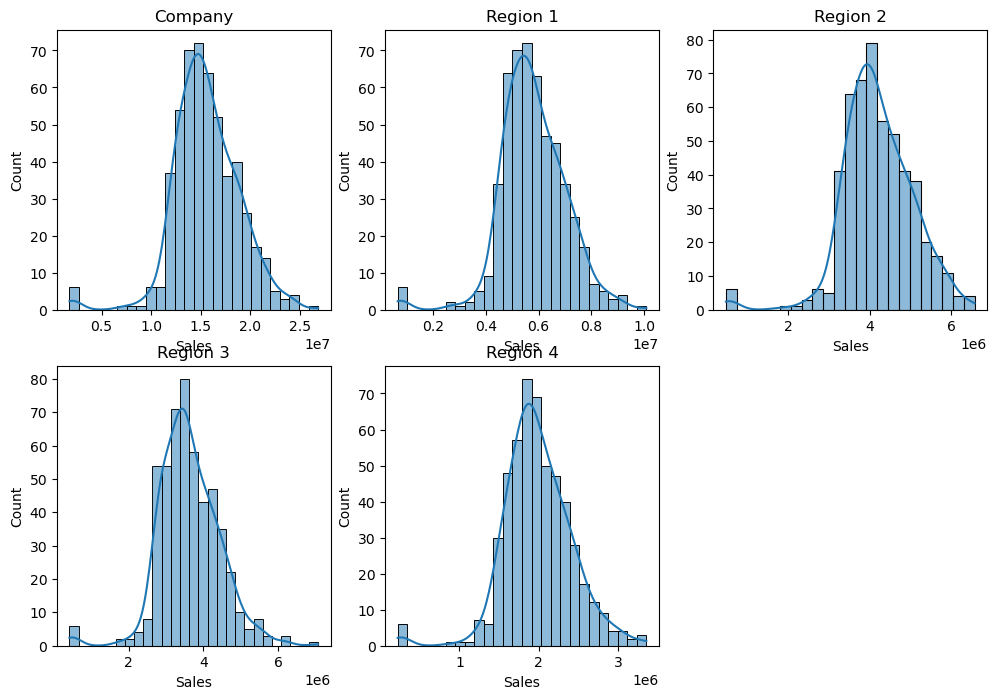

In [29]:
# Checking distribution of datasets

plt.figure(figsize=(12, 8))

for i, (name, data) in enumerate(datasets.items()):
  plt.subplot(2, 3, i+1)
  sns.histplot(data['Sales'], kde = True)
  plt.title(f'{name}')

plt.show()

In [30]:
# Checking Minimum Sales
for name, data in datasets.items():
  print(f'Min Sales in {name}:{data["Sales"].min()}.')

Min Sales in Company:1762137.57.
Min Sales in Region 1:654808.47.
Min Sales in Region 2:474569.37.
Min Sales in Region 3:409091.13.
Min Sales in Region 4:222144.24.


In [31]:
for name, data in datasets.items():
  print(f'No of days in {name} with Sales < 1000000:{data[data["Sales"] < 1000000].shape[0]}.')

No of days in Company with Sales < 1000000:0.
No of days in Region 1 with Sales < 1000000:6.
No of days in Region 2 with Sales < 1000000:6.
No of days in Region 3 with Sales < 1000000:6.
No of days in Region 4 with Sales < 1000000:7.


Residual mean of Company:5749.545895886796

Residual mean of Region 1:1970.4179788700174

Residual mean of Region 2:1185.6895776258227

Residual mean of Region 3:1952.932193528335

Residual mean of Region 4:640.5061458625806



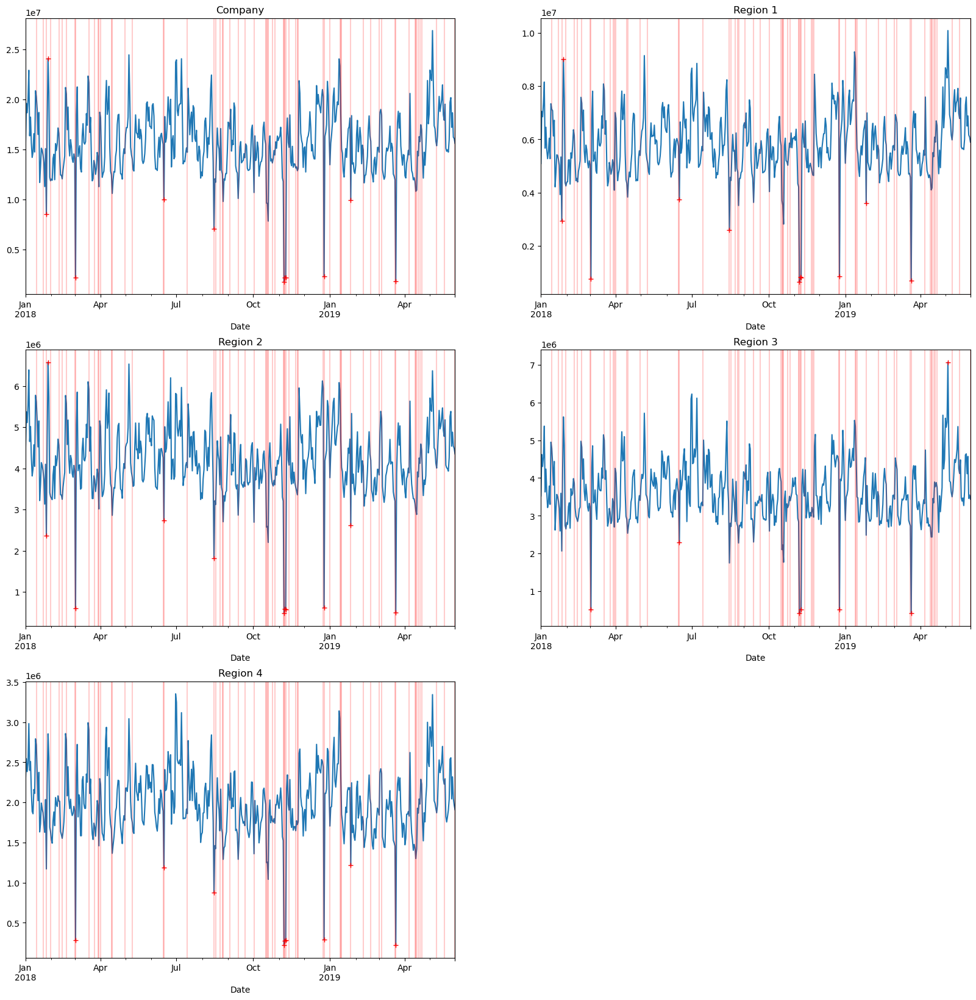

In [32]:
# Checking residuals for Anamolies against Holidays
# Where anamolies are residual values > 3x std deviation

plt.figure(figsize=(20, 20))
for i, (name, data) in enumerate(datasets.items()):
  model = sm.tsa.seasonal_decompose(data['Sales'], model='additive', period = 7)
  anomalies = data['Sales'][model.resid.abs() > 3 * model.resid.std()]
  data['Anomaly'] = model.resid.apply(lambda x: 1 if abs(x) > 3 * model.resid.std() else 0)

  print(f'Residual mean of {name}:{model.resid.mean()}')
  print()
  plt.subplot(3,2,i+1)
  data['Sales'].plot()
  anomalies.plot(style='+', color='red')
  holiday_dates = data[data['Holiday'] == 1].index
  for dates in holiday_dates:
    plt.axvline(x=dates, color='red', alpha=0.2, label='Holiday')
  plt.title(name)
plt.show()

In [33]:
# Hypothesis Test - Chi Square: Is there a significant Association between Holidays and Anomalies in Sales.
# H0: There is no significant association. 
# H1: There is significant association

contingency_table = pd.crosstab(ts_co['Holiday'], ts_co['Anomaly'])

chi2, p, dof, expected = chi2_contingency(contingency_table)

print("Chi-squared statistic:", chi2)
print("p-value:", p)

if p < 0.05:
    print("There is a significant association between 'Holiday' and 'Anomaly'.")
else:
    print("There is no significant association between 'Holiday' and 'Anomaly'.")

Chi-squared statistic: 52.615256998388915
p-value: 4.0572508834972095e-13
There is a significant association between 'Holiday' and 'Anomaly'.


In [34]:
ts_co.Anomaly.value_counts()

Anomaly
0    505
1     11
Name: count, dtype: int64

<h3><font color="red" style="sans-serif">Anomaly/Outlier Handling</font></h3>
* The boxplots show presence of outliers in the data. However, this could be attributed to seasonality and exogenous factors i.e. possible real world scenarios which the model might be able to use to make more accurate forecasts, hence futher check are required before they are treated/ imputed.  
* 'Sales' Distributions for all 5 data sets are bell shaped with few extreme values (6 or 7) on the lower side skewing the distribution left.
* To elimate the outliers occuring due to seasonality we can check if they're also present in the residue. Residual values > 3x std deviation are considered as anomalies.
* The time series plots shows that anomalies, which are mostly in lower values seen as sharp dips, coinciding with holidays. There are 11 points identified as anamolies.
* The Chi-square tests shows a strong relation between holidays and anomalies suggesting that the low sales figures might be a result of certain factors related to holidays. This however is not observed on all holiday.
* The Anomalies will be interpolated to reduce their impact.

In [35]:
# Replacing Anamolies with interpolation

for i, (name, data) in enumerate(datasets.items()):
  data['Sales'] = data.apply(lambda row: row['Sales'] if row['Anomaly'] == 0 else None, axis = 1)
  data['Sales'] = data['Sales'].interpolate(method = 'linear', axis = 0)

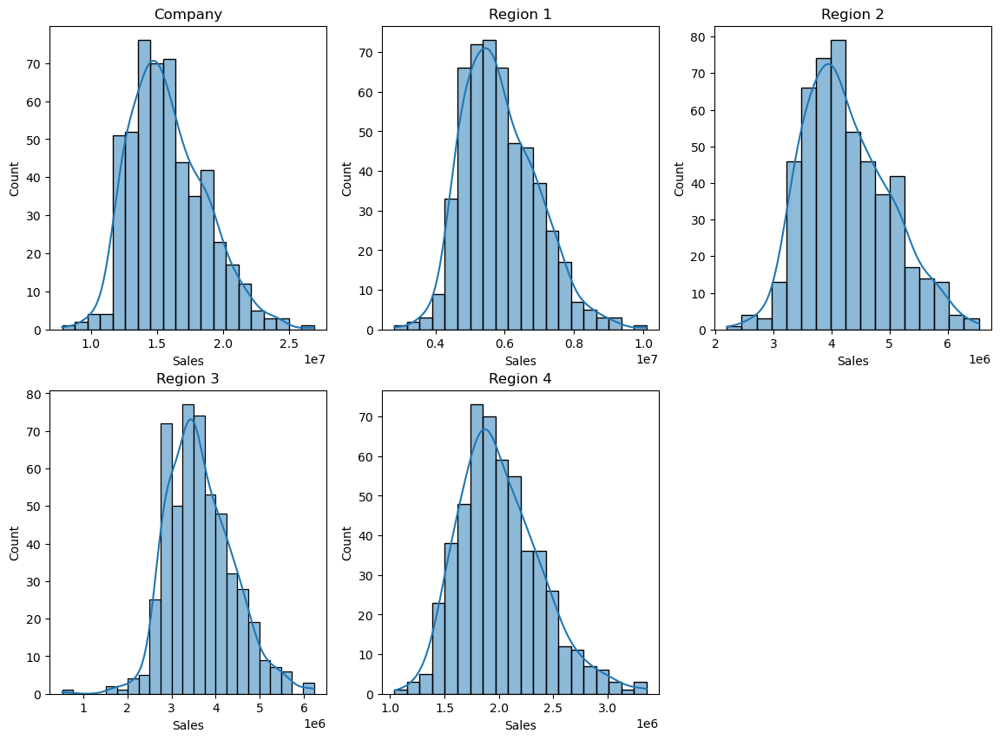

In [36]:
# Checking distribution of datasets

plt.figure(figsize=(14,10))

for i, (name, data) in enumerate(datasets.items()):
  plt.subplot(2, 3, i+1)
  sns.histplot(data['Sales'], kde = True)
  plt.title(f'{name}')

plt.show()

<h2><font color="red" style="sans-serif">Hypothesis Testing</font></h2>

In [37]:
all = { 'All': df,'Company': ts_co, 'Region 1': ts_r1, 'Region 2': ts_r2, 'Region 3': ts_r3, 'Region 4':ts_r4}

<h4><font color="cyan" style="sans-serif">1. Impact of Discount: Do discounts significantly impact Sales?</font></h4>

**H0**: Sales are equal for discounted days and non-discounted days.

**H1**: Sales on discounted days are greater than non discounted days

**Test**: 2 sample independent t-Test

In [38]:
df.head()

,ID,Store_id,Store_Type,Location_Type,Region_Code,Date,Holiday,Discount,Orders,Sales,Discounted_Flag
0,T1000001,1,S1,L3,R1,2018-01-01,1,Yes,9,"7,011.84",1
1,T1000002,253,S4,L2,R1,2018-01-01,1,Yes,60,"51,789.12",1
2,T1000003,252,S3,L2,R1,2018-01-01,1,Yes,42,"36,868.20",1
3,T1000004,251,S2,L3,R1,2018-01-01,1,Yes,23,"19,715.16",1
4,T1000005,250,S2,L3,R4,2018-01-01,1,Yes,62,"45,614.52",1


In [39]:
t_stat, p_value = ttest_ind( df[df["Discount"] == "Yes"]['Sales'] , df[df["Discount"] == "No"]['Sales'], alternative = "greater")

print("P-value:", p_value)

if p_value < 0.05:
  print("Reject the null hypothesis. Sales on discounted days are higher")
else:
  print("Fail to reject the null hypothesis. Sales are equal on discounted and non-discounted days")


P-value: 0.0
Reject the null hypothesis. Sales on discounted days are higher


<h4><font color="cyan" style="sans-serif">2. Effect of Holidays on Sales: Are Sales lesser on holidays?</font></h4>

**H0**: Sales on holidays and non-holidays are the same.

**H1**: Sales on holidays are **lower** compared to non-holidays.

**Test**: 2 sample independent t-Test

In [40]:
t_stat, p_value = ttest_ind( df[df["Holiday"] == 1]['Sales'] , df[df["Holiday"] == 0]['Sales'], alternative = "less")

print("P-value:", p_value)

if p_value < 0.05:
  print("Reject the null hypothesis. Sales on holidays are LOWER compared to non-holidays")
else:
  print("Fail to reject the null hypothesis. Sales on holidays and non-holidays are the same.")

P-value: 0.0
Reject the null hypothesis. Sales on holidays are LOWER compared to non-holidays


<h4><font color="cyan" style="sans-serif">3. Sales Differences Across Store Types: Is there a difference in Sales across Store Types</font></h4>

**H0**: Sales are equal for all store types.

**H1**: There's a significant difference in Sales across Store Types.

**Test**: ANOVA OR Kruskal Wallis Test

In [41]:
s1 = df[df['Store_Type'] == "S1"]['Sales']
s2 = df[df['Store_Type'] == "S2"]['Sales']
s3 = df[df['Store_Type'] == "S3"]['Sales']
s4 = df[df['Store_Type'] == "S4"]['Sales']
store_types = [ s1, s2, s3, s4]

In [42]:
# Checking data for normal distribution and equal variance using Shapiro Wilk Test & Levene Test
# Shapiro - Wilk Test
for st in store_types:

  test_stat, p_shapiro = shapiro(st)
  print("Shapiro Wilk P-value:", p_shapiro)

  if p_shapiro < 0.05:
    print("Data is not normally distributed\n ")
  else:
    print("Data is normally distributed\n ")


# Levene Test for Equal Variance
test_stat, p_levene = levene(s1, s2, s3, s4)

print("Levene P-value:", p_levene)

if p_levene < 0.05:
    print("Store_Type Sales variances are not equal.")
else:
    print("Store_Type Sales variances are equal.")


Shapiro Wilk P-value: 6.244850959544344e-79
Data is not normally distributed
 
Shapiro Wilk P-value: 2.313188234690706e-51
Data is not normally distributed
 
Shapiro Wilk P-value: 2.4892304934955129e-57
Data is not normally distributed
 
Shapiro Wilk P-value: 7.54256999559744e-79
Data is not normally distributed
 
Levene P-value: 0.0
Store_Type Sales variances are not equal.


##### **Note:**

* The data is not normally distributes and the groups do not show equal variance.
* We can check if there's a difference in sales across Store_Types using the Kruskal Wallis Test, which is non-parametric and does not require normal distribution of data of equal variance

In [43]:
f_stat, p_value = kruskal(s1, s2, s3, s4)

print("P-value:", p_value)

if p_value < 0.05:
  print("Reject the null hypothesis. There's a significant difference in Sales across Store Types")
else:
  print("Fail to reject the null hypothesis. Sales are equal across Store Types")



P-value: 0.0
Reject the null hypothesis. There's a significant difference in Sales across Store Types


<h4><font color="cyan" style="sans-serif">4. Sales Differences Across Regions: Is there a difference in Sales across Region Codes</font></h4>

**H0**: Sales are equal for all Regions.

**H1**: There's a significant difference in Sales across Regions.

**Test**: ANOVA OR Kruskal Wallis Test

In [44]:
r1 = df[df['Region_Code']== "R1"]['Sales']
r2 = df[df['Region_Code']== "R2"]['Sales']
r3 = df[df['Region_Code']== "R3"]['Sales']
r4 = df[df['Region_Code']== "R4"]['Sales']
regions = [r1, r2, r3, r4]

In [45]:
# Checking regional data for normal distribution and equal variance using Shapiro Wilk Test & Levene Test
# Shapiro Wilk Test
for r in regions:

  test_stat, p_shapiro = shapiro(r)
  print("Shapiro Wilk P-value:", p_shapiro)
  if p_shapiro < 0.05:
    print("Data is not normally distributed\n ")
  else:
    print("Data is normally distributed\n ")

# Levene Test for Equal Variance
test_stat, p_levene = levene(r1, r2, r3, r4)

print("Levene P-value:", p_levene)

if p_levene < 0.05:
    print("Region Sales variances are not equal.")
else:
    print("Region Sales variances are equal.")


Shapiro Wilk P-value: 5.568579127456188e-90
Data is not normally distributed
 
Shapiro Wilk P-value: 6.326690054699451e-85
Data is not normally distributed
 
Shapiro Wilk P-value: 1.174723480209048e-78
Data is not normally distributed
 
Shapiro Wilk P-value: 2.5918854183877692e-68
Data is not normally distributed
 
Levene P-value: 0.0
Region Sales variances are not equal.


##### **Note:**

* The regiona sales data is not normally distributes and the groups do not show equal variance.
* We can check if there's a difference in sales across Regions using the Kruskal Wallis Test, which is non-parametric and does not require normal distribution of data of equal variance

In [46]:
f_stat, p_value = kruskal(r1, r2, r3, r4)

print("P-value:", p_value)

if p_value < 0.05:
  print("Reject the null hypothesis. There's a significant difference in Sales across Regions")
else:
  print("Fail to reject the null hypothesis. Sales are equal across Regions")

P-value: 0.0
Reject the null hypothesis. There's a significant difference in Sales across Regions


<h4><font color="cyan" style="sans-serif">5. Correlation between # of Orders and Sales</font></h4>

**Test**: Pearson Correlation, Spearman Correlation

In [47]:
print('Pearson Correlation between #Orders & Sales:', pearsonr(df['Orders'] , df['Sales'])[0])

print('Spearman Correlation between #Orders & Sales:', spearmanr(df['Orders'] , df['Sales'])[0])

Pearson Correlation between #Orders & Sales: 0.9416005646125761
Spearman Correlation between #Orders & Sales: 0.9377462542885381


<h4><font color="cyan" style="sans-serif">Results of Hypothesis Tests</font></h4>

* Sales on discounted days are higher than sales on days without discounts
* Sales on holidays are LOWER compared to non-holidays
* There's a significant difference in Sales across Store Types
* There's a significant difference in Sales across Regions
* There's a very high positive correlation (~0.94) between No. of Orders and Sales.

<h3><font color="red" style="sans-serif">Regression Methods</font></h3>
<h4><font color="cyan" style="sans-serif">Feature Engineering & Data Pre-processing</font></h4>

In [48]:
lr_co = ts_co.copy(deep = True)
lr_r1 = ts_r1.copy(deep = True)
lr_r2 = ts_r2.copy(deep = True)
lr_r3 = ts_r3.copy(deep = True)
lr_r4 = ts_r4.copy(deep = True)

In [49]:
lr_co.drop(columns = "Anomaly", inplace = True)
lr_r1.drop(columns = "Anomaly", inplace = True)
lr_r2.drop(columns = "Anomaly", inplace = True)
lr_r3.drop(columns = "Anomaly", inplace = True)
lr_r4.drop(columns = "Anomaly", inplace = True)

In [50]:
lr_data = {'Company': lr_co, 'Region 1': lr_r1, 'Region 2': lr_r2, 'Region 3': lr_r3, 'Region 4':lr_r4}

In [51]:
# Creating Features from Date
for name, data in lr_data.items():
  #data['Day'] = data.index.day
  data['Month'] = data.index.month
  #data['Year'] = data.index.year
  data['Day of Week'] = data.index.day_name()
  #data['Quarter'] = data.index.quarter
  data['Day Count'] = (data.index - data.index[0]).days
  data['Weekend'] = data['Day of Week'].apply(lambda x: 1 if x in ['Saturday', 'Sunday'] else 0)
  data['Day of Week'] = data.index.dayofweek

  if 'Discount' in data.columns:
       data.drop(columns=['Discount'], inplace=True)

In [52]:
# Encoding Month & Day of the Week to maintain cyclic nature of features
for name, data in lr_data.items():
    data['Month_sine'] = np.sin(2 * np.pi * data['Month'] / 12)
    data['Month_cosine'] = np.cos(2 * np.pi * data['Month'] / 12)
    data['Day of Week_sine'] = np.sin(2 * np.pi * data['Day of Week'] / 7)
    data['Day of Week_cosine'] = np.cos(2 * np.pi * data['Day of Week'] / 7)
    data.drop(columns = ['Month', 'Day of Week', 'Orders'], inplace = True)
    lr_data[name] = data

In [53]:
# Creating Sales Lag Features
for name, data in lr_data.items():
  #Lag 1
  data['Sales_Lag1'] = data['Sales'].shift(1)
  #Lag 2
  data['Sales_Lag2'] = data['Sales'].shift(2)
  #Lag 3
  data['Sales_Lag3'] = data['Sales'].shift(3)

  #Sales on the same weekday last week
  data['Sales_Lag7'] = data['Sales'].shift(7)

  #Sales on the same day last month
  data['Sales_Lag31'] = data['Sales'].shift(31)

  #Last week's average Sales
  data['Avg_Sales_Last7'] = data['Sales'].shift(1).rolling(window = 7).mean()

  # Average Sales for last 14 days
  data['Avg_Sales_Last14'] = data['Sales'].shift(1).rolling(window = 14).mean()

  # Average Sales for last 31 days
  data['Avg_Sales_Last31'] = data['Sales'].shift(1).rolling(window = 31).mean()

  # Dropping Nan rows
  data.dropna(inplace = True)

In [54]:
lr_data = {'Company': lr_co, 'Region 1': lr_r1, 'Region 2': lr_r2, 'Region 3': lr_r3, 'Region 4':lr_r4}

In [55]:
# Applying Standard Scaler
scaler = StandardScaler()
for name, data in lr_data.items():
  data_copy = data.copy()
  cols = ['Sales_Lag1','Sales_Lag2', 'Sales_Lag3', 'Sales_Lag7', 'Sales_Lag31','Avg_Sales_Last7', 'Avg_Sales_Last14', 'Avg_Sales_Last31']
  data[cols] = scaler.fit_transform(data[cols])

In [56]:
cols = [col for col in lr_co.columns if col != 'Sales'] + ['Sales']
lr_co = lr_co[cols]
lr_r1 = lr_r1[cols]
lr_r2 = lr_r2[cols]
lr_r3 = lr_r3[cols]
lr_r4 = lr_r4[cols]

In [57]:
lr_r1.head()

,Holiday,Discounted Stores,Day Count,Weekend,Month_sine,Month_cosine,Day of Week_sine,Day of Week_cosine,Sales_Lag1,Sales_Lag2,Sales_Lag3,Sales_Lag7,Sales_Lag31,Avg_Sales_Last7,Avg_Sales_Last14,Avg_Sales_Last31,Sales
Date,,,,,,,,,,,,,,,,,
2018-02-01,0,0.01,31,0,0.87,0.50,0.43,-0.90,-1.51,-1.39,1.58,-0.48,-0.69,0.02,-0.87,0.21,"4,396,632.00"
2018-02-02,0,0.01,32,0,0.87,0.50,-0.43,-0.90,-1.38,-1.50,-1.39,0.09,1.23,-0.17,-0.84,0.16,"4,410,351.00"
2018-02-03,0,0.00,33,1,0.87,0.50,-0.97,-0.22,-1.36,-1.37,-1.50,0.66,1.03,-0.49,-0.89,-0.03,"5,227,101.00"
2018-02-04,0,0.00,34,1,0.87,0.50,-0.78,0.62,-0.60,-1.36,-1.37,1.13,1.53,-0.75,-0.91,-0.14,"5,235,183.00"
2018-02-05,0,0.00,35,0,0.87,0.50,0.00,1.00,-0.59,-0.59,-1.36,1.60,2.31,-1.12,-0.93,-0.29,"4,322,556.00"


<h4><font color="cyan" style="sans-serif">Linear Regression & XGB Model Building & Testing</font></h4>

In [58]:
# Function to evaluate performance
def performance(actual, predicted):
    print('MAE :', round(mae(actual, predicted), 3))
    print('RMSE :', round(mse(actual, predicted)**0.5, 3))
    print('MAPE:', round(mape(actual, predicted), 3))


In [59]:
# Function to...
# Split Data
# Train Linear Regression & XGB Model
# Predict Sales for n days. Plot & Compare.
# Measure MAE, RMSE, MAPE
# Check Model parameters
# Plot and Compare Model parameters
# Plot residuals over time, plot residual histogram and scatter plot

In [60]:
def regression_forecast(df, n):

    # Splitting the data into training and test sets
    x_train = df.iloc[:-n, :-1]
    x_test = df.iloc[-n:, :-1]
    y_train = df.iloc[:-n, -1]
    y_test = df.iloc[-n:, -1]

    # Linear Regression Training
    model = LinearRegression()
    model.fit(x_train, y_train)

    # Ridge Regression Training
    #model_r = Ridge(alpha=0.001)
    #model_r.fit(x_train, y_train)

    # XGBoost Regression Training
    model_xgb = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
    model_xgb.fit(x_train, y_train)

    # Predictions
    y_pred = model.predict(x_test)
    #y_pred_r = model_r.predict(x_test)
    y_pred_xgb = model_xgb.predict(x_test)

    # Performance Evaluation
    print("Linear Regression:")
    performance(y_test, y_pred)
    print()
    #print("Ridge Regression:")
    #performance(y_test, y_pred_r)
    #print()
    print("XGBoost Regression:")
    performance(y_test, y_pred_xgb)
    print()

    # Plotting test & prediction
    plt.figure(figsize=(14, 5))
    plt.plot(x_test.index, y_test, label="Original")
    plt.plot(x_test.index, y_pred, linestyle="dotted", label="Linear Prediction")
    #plt.plot(x_test.index, y_pred_r, linestyle="dashed", label="Ridge Prediction")
    plt.plot(x_test.index, y_pred_xgb, linestyle="dashdot", label="XGB Prediction")
    plt.title("Sales Forecast")
    plt.ylabel("Sales")
    plt.xlabel("Dates")
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    plt.show()

    # Model Parameters
    print("\n Model Parameters:")
    for feature, coef_lr, coef_xgb in zip(x_train.columns, model.coef_, model_xgb.feature_importances_):
      print(f"{feature}:")
      print(f"  Linear Regression co-ef:  {coef_lr:.4f}")
      print(f"  XGBoost Importance: {coef_xgb:.4f}")
      print()


    plt.figure(figsize=(15, 5))

    # Linear Regression Coefficients
    plt.subplot(1, 2, 1)
    plt.bar(x_train.columns, model.coef_)
    plt.xticks(rotation=45, ha='right')
    plt.title("Linear Regression Coefficients")
    plt.ylabel("Coefficient Value")
    plt.tight_layout()

    # XGBoost Regression Coefficients
    plt.subplot(1, 2, 2)
    plt.bar(x_train.columns, model_xgb.feature_importances_)
    plt.xticks(rotation=45, ha='right')
    plt.title("XGBoost Regression Feature Importances")
    plt.ylabel("Coefficient Value")
    plt.tight_layout()

    plt.show()


    residuals = y_test.values.flatten() - y_pred.flatten()
    residuals_xbg = y_test.values.flatten() - y_pred_xgb.flatten()

    # Plot residuals over time
    plt.figure(figsize=(10, 5))
    plt.plot(x_test.index, residuals, marker='.', linestyle='-', color='blue', label='LR Residuals', alpha = 0.6)
    plt.plot(x_test.index, residuals_xbg, marker='.', linestyle='-', color = "green", label='XGB Residuals', alpha = 0.6)
    plt.axhline(y=residuals.mean(), color='green', linestyle='--')
    plt.axhline(y=0, color='red', linestyle='-.')
    plt.text(x=x_test.index[0], y=residuals.mean(), s=f'Res. Mean (LR): {residuals.mean():.2f}', color='blue', va='top')
    plt.text(x=x_test.index[0], y=residuals_xbg.mean(), s=f'Res. Mean (XGB): {residuals_xbg.mean():.2f}', color='green', va='bottom')
    plt.title('Residuals over Time')
    plt.xlabel('Date')
    plt.ylabel('Residual (Actual - Predicted)')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()

    plt.show()


    #Histograms
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    # Histogram of LR residuals
    sns.histplot(residuals, kde=True)
    plt.title('Distribution of Residuals from Linear Regression Model')
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.tight_layout()

    plt.subplot(1, 2, 2)
    # Histogram of XGB residuals
    sns.histplot(residuals_xbg, kde=True)
    plt.title('Distribution of Residuals from XGBoost')
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.tight_layout()

    plt.show()

    #Scatter plots
    plt.figure(figsize=(15, 5))

    # Scatter plot of predictions & residuals
    plt.subplot(1, 2, 1)
    plt.scatter(y_pred, residuals)
    plt.xlabel("Predicted Sales")
    plt.ylabel("Residuals")
    plt.title("Linear Regression Residuals vs Predictions")
    plt.tight_layout()

    # Scatter plot of predictions & residuals
    plt.subplot(1, 2, 2)
    plt.scatter(y_pred_xgb, residuals_xbg)
    plt.xlabel("Predicted Sales")
    plt.ylabel("Residuals")
    plt.title("XGB Residuals vs Predictions")
    plt.tight_layout()

    plt.show()

    print()
    print()

Linear Regression:
MAE : 1172347.682
RMSE : 1673382.784
MAPE: 0.067

XGBoost Regression:
MAE : 1168665.341
RMSE : 1752816.872
MAPE: 0.07



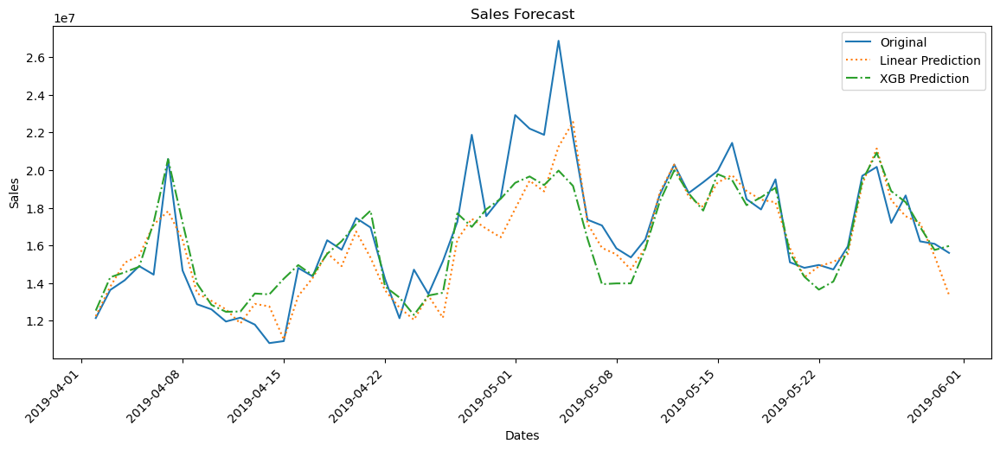


 Model Parameters:
Holiday:
  Linear Regression co-ef:  -1291550.3346
  XGBoost Importance: 0.0351

Discounted Stores:
  Linear Regression co-ef:  3050378.6934
  XGBoost Importance: 0.0748

Day Count:
  Linear Regression co-ef:  -292.8688
  XGBoost Importance: 0.0158

Weekend:
  Linear Regression co-ef:  2829124.5298
  XGBoost Importance: 0.3933

Month_sine:
  Linear Regression co-ef:  69829.2154
  XGBoost Importance: 0.0123

Month_cosine:
  Linear Regression co-ef:  118590.6553
  XGBoost Importance: 0.0286

Day of Week_sine:
  Linear Regression co-ef:  449137.6988
  XGBoost Importance: 0.0412

Day of Week_cosine:
  Linear Regression co-ef:  -396599.8429
  XGBoost Importance: 0.0151

Sales_Lag1:
  Linear Regression co-ef:  1203194.1560
  XGBoost Importance: 0.2859

Sales_Lag2:
  Linear Regression co-ef:  13651.7655
  XGBoost Importance: 0.0148

Sales_Lag3:
  Linear Regression co-ef:  71775.9046
  XGBoost Importance: 0.0121

Sales_Lag7:
  Linear Regression co-ef:  142041.7989
  XGBoost

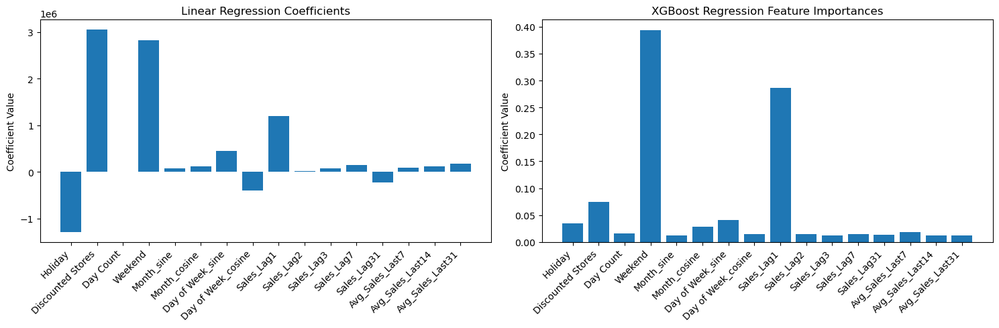

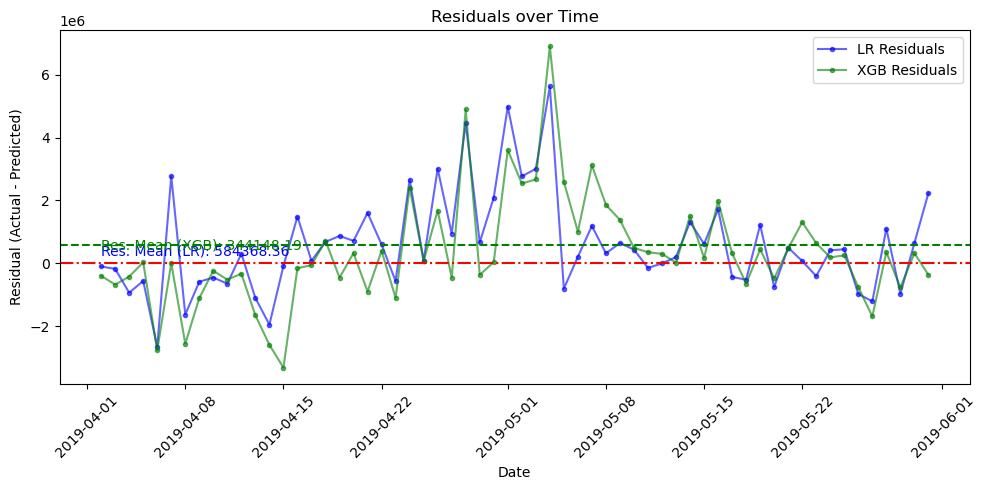

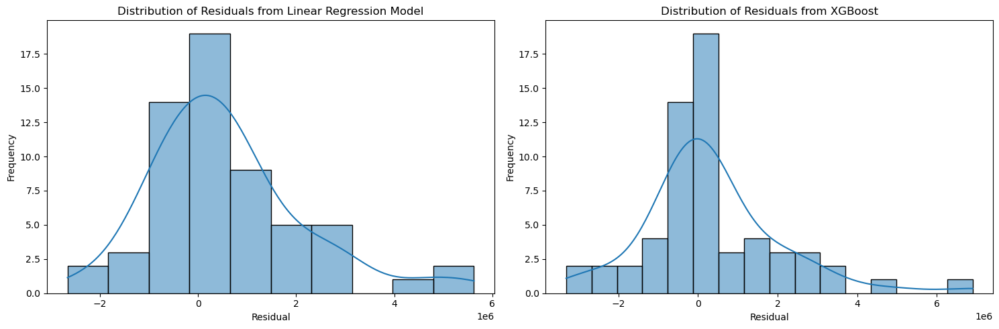

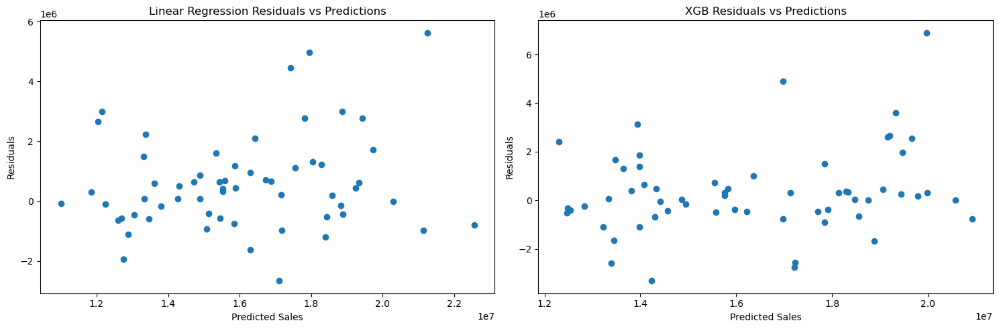

In [61]:
regression_forecast(lr_co, 60)

In [62]:
# A shorter Function to
# Split Data
# Train Linear Regression & XGB Model
# Predict Sales for n days.
# Measure MAE, RMSE, MAPE

In [63]:
def regression_forecast_lite(df, n):

    # Splitting the data into training and test sets
    x_train = df.iloc[:-n, :-1]
    x_test = df.iloc[-n:, :-1]
    y_train = df.iloc[:-n, -1]
    y_test = df.iloc[-n:, -1]

    # Linear Regression Training
    model = LinearRegression()
    model.fit(x_train, y_train)

    # Ridge Regression Training
    #model_r = Ridge(alpha=0.001)
    #model_r.fit(x_train, y_train)

    # XGBoost Regression Training
    model_xgb = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
    model_xgb.fit(x_train, y_train)

    # Predictions
    y_pred = model.predict(x_test)
    #y_pred_r = model_r.predict(x_test)
    y_pred_xgb = model_xgb.predict(x_test)

    # Performance Evaluation
    print("Linear Regression:")
    performance(y_test, y_pred)
    print()
    #print("Ridge Regression:")
    #performance(y_test, y_pred_r)
    #print()
    print("XGBoost Regression:")
    performance(y_test, y_pred_xgb)
    print()


In [64]:
lr_data = {'Company': lr_co, 'Region 1': lr_r1, 'Region 2': lr_r2, 'Region 3': lr_r3, 'Region 4':lr_r4}

In [65]:
for name, data in lr_data.items():
  print(name)
  regression_forecast_lite(data, 60)
  print()

Company
Linear Regression:
MAE : 1172347.682
RMSE : 1673382.784
MAPE: 0.067

XGBoost Regression:
MAE : 1168665.341
RMSE : 1752816.872
MAPE: 0.07


Region 1
Linear Regression:
MAE : 446130.734
RMSE : 634474.432
MAPE: 0.068

XGBoost Regression:
MAE : 522751.219
RMSE : 705403.953
MAPE: 0.079


Region 2
Linear Regression:
MAE : 274037.077
RMSE : 369449.433
MAPE: 0.061

XGBoost Regression:
MAE : 319793.596
RMSE : 409310.123
MAPE: 0.073


Region 3
Linear Regression:
MAE : 310973.314
RMSE : 447682.771
MAPE: 0.077

XGBoost Regression:
MAE : 326764.739
RMSE : 445791.957
MAPE: 0.085


Region 4
Linear Regression:
MAE : 161370.453
RMSE : 226893.031
MAPE: 0.074

XGBoost Regression:
MAE : 179927.004
RMSE : 240643.125
MAPE: 0.084




<h4><font color="cyan" style="sans-serif">Linear & XGBoost Regression Report:</font></h4>

* Linear Regression ourperforms XGB: Linear Regression marginally (0.3 to 1.2%) outperforms XGBoost Regression across all levels (Company and Regions 1-4), showing lower MAE, RMSE, and MAPE in every case.

* MAPE: The Linear Regression models achieved a good MAPE in the range of 6.1% to 7.7% whereas the XGBoost Model achieved a MAPE in the range of 7% to 8.5%

* The Linear Regression model assigns higher weightage (co-efficients) to Proportion of stores with Discounts, Holiday, Weekend and the previous day's Sales (Lag 1)

* The XGBoost model assigns highest importance to Weekends, previous days Sales, Holiday and Proportion of Discounted stores.

* **However, it should be noted that the model uses lag_values as features and the test data contained lag values which would otherwise not be available when forecasting for future dates. This contributed to the model performing better than expected. For future dates, the model prediction can be applied recursively i.e. 1 day at a time such that the predicted values can be used to create lag values for future dates. The performance is expected to decay in such a situation as the predicted values generated will have errors which will add up over time.**

<h2><font color="red" style="sans-serif">Recursive Regression Forecasting</font></h2>

Using ForecasterRecursive from skforecast.recursive

In [66]:
lr_co.columns

Index(['Holiday', 'Discounted Stores', 'Day Count', 'Weekend', 'Month_sine',
       'Month_cosine', 'Day of Week_sine', 'Day of Week_cosine', 'Sales_Lag1',
       'Sales_Lag2', 'Sales_Lag3', 'Sales_Lag7', 'Sales_Lag31',
       'Avg_Sales_Last7', 'Avg_Sales_Last14', 'Avg_Sales_Last31', 'Sales'],
      dtype='object')

In [67]:
#Preparing datsets
# Dropping lag features which will be generated by ForecasterRecursive()

lr_co_rec = lr_co[['Holiday', 'Discounted Stores', 'Day Count', 'Weekend', 'Month_sine','Month_cosine', 'Day of Week_sine', 'Day of Week_cosine', 'Sales']]
lr_r1_rec = lr_r1[['Holiday', 'Discounted Stores', 'Day Count', 'Weekend', 'Month_sine','Month_cosine', 'Day of Week_sine', 'Day of Week_cosine', 'Sales']]
lr_r2_rec = lr_r2[['Holiday', 'Discounted Stores', 'Day Count', 'Weekend', 'Month_sine','Month_cosine', 'Day of Week_sine', 'Day of Week_cosine', 'Sales']]
lr_r3_rec = lr_r3[['Holiday', 'Discounted Stores', 'Day Count', 'Weekend', 'Month_sine','Month_cosine', 'Day of Week_sine', 'Day of Week_cosine', 'Sales']]
lr_r4_rec = lr_r4[['Holiday', 'Discounted Stores', 'Day Count', 'Weekend', 'Month_sine','Month_cosine', 'Day of Week_sine', 'Day of Week_cosine', 'Sales']]


In [68]:
def recursive_forecast_test(name, df, target_col='Sales', forecast_horizon=60):

    df = df.copy()
    df = df.dropna().reset_index(drop=True)
    y = df[target_col]
    X = df.drop(columns=[target_col])
    dates = df.index

    # Split train-test
    y_train = y[:-forecast_horizon]
    y_test = y[-forecast_horizon:]
    X_train = X[:-forecast_horizon]
    X_test = X[-forecast_horizon:]
    test_index = y_test.index

    # Lag and rolling features
    window_features = rolling_features = RollingFeatures(
        stats=['mean','mean','mean'],
        window_sizes=[7, 14, 31])

    # Initialize Forecaster
    forecaster_lr = ForecasterRecursive(
        regressor=LinearRegression(),
        lags=[1, 2, 3, 7, 31],
        window_features=window_features
    )

    forecaster_lr_exog = ForecasterRecursive(
        regressor=LinearRegression(),
        lags=[1, 2, 3, 7, 31],
        window_features=window_features
    )

    forecaster_xgb = ForecasterRecursive(
        regressor=XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
        lags=[1, 2, 3, 7, 31],
        #window_features=window_features
    )


    # Model fit without exogenous variables
    forecaster_lr.fit(y=y_train)

    # Models fit with exogenous variables
    forecaster_lr_exog.fit(y=y_train, exog=X_train)
    forecaster_xgb.fit(y=y_train, exog=X_train)

    # Predict using test set exogenous variables
    y_pred_lr = forecaster_lr.predict(steps=forecast_horizon)
    y_pred_lr_exog = forecaster_lr_exog.predict(steps=forecast_horizon, exog=X_test)
    y_pred_xgb = forecaster_xgb.predict(steps=forecast_horizon, exog=X_test)

    # Evaluation
    print(f"\n{name} Forecast Performance with Linear Regression:")
    performance(y_test, y_pred_lr)

    print(f"\n{name} Forecast Performance with Linear Regression & Exogenous Variables:")
    performance(y_test, y_pred_lr_exog)

    print(f"\n{name} Forecast Performance with XGBoost & Exogenous Variables::")
    performance(y_test, y_pred_xgb)

    # Plot
    plt.figure(figsize=(14, 5))
    plt.plot(test_index, y_test, label="Actual")
    plt.plot(test_index, y_pred_lr, linestyle="dashed", label="LR Forecast", color="blue")
    plt.plot(test_index, y_pred_lr_exog, linestyle="dotted", label="LR Forecast with Exog", color="red")
    plt.plot(test_index, y_pred_xgb, linestyle="dashed", label="XGBoost Forecast", color="green")
    plt.title(f"{name} - Forecast vs Actual")
    plt.xlabel("Time")
    plt.ylabel("Sales")
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()



In [69]:
lr_data_rec = {'Company': lr_co_rec, 'Region 1': lr_r1_rec, 'Region 2': lr_r2_rec, 'Region 3': lr_r3_rec, 'Region 4':lr_r4_rec}

Company

Company Forecast Performance with Linear Regression:
MAE : 2409000.705
RMSE : 3227432.079
MAPE: 0.138

Company Forecast Performance with Linear Regression & Exogenous Variables:
MAE : 2672553.742
RMSE : 3332336.464
MAPE: 0.151

Company Forecast Performance with XGBoost & Exogenous Variables::
MAE : 1911790.634
RMSE : 2598232.178
MAPE: 0.108


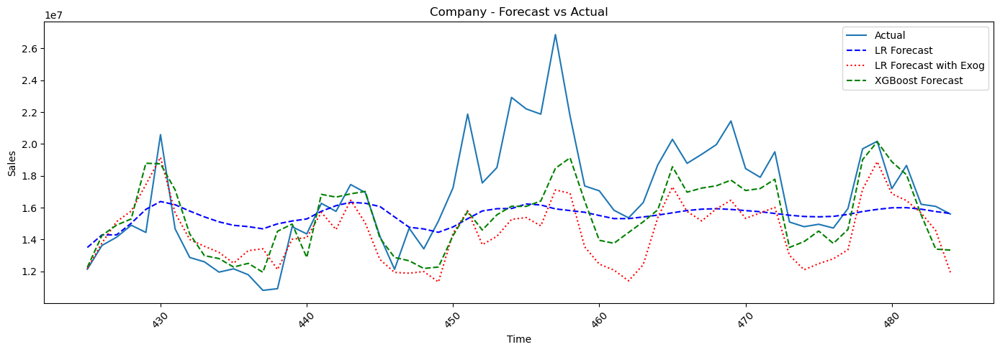

Region 1

Region 1 Forecast Performance with Linear Regression:
MAE : 967057.048
RMSE : 1271464.588
MAPE: 0.144

Region 1 Forecast Performance with Linear Regression & Exogenous Variables:
MAE : 1066596.634
RMSE : 1318389.507
MAPE: 0.158

Region 1 Forecast Performance with XGBoost & Exogenous Variables::
MAE : 841206.737
RMSE : 1076831.276
MAPE: 0.122


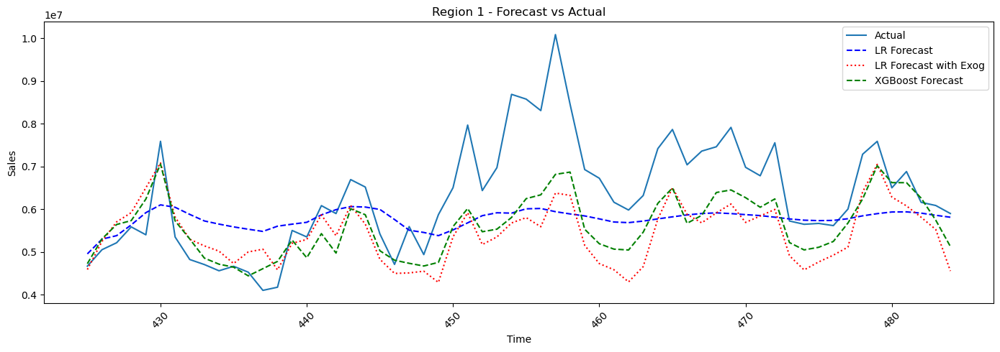

Region 2

Region 2 Forecast Performance with Linear Regression:
MAE : 553250.789
RMSE : 711869.337
MAPE: 0.124

Region 2 Forecast Performance with Linear Regression & Exogenous Variables:
MAE : 598941.601
RMSE : 730205.962
MAPE: 0.131

Region 2 Forecast Performance with XGBoost & Exogenous Variables::
MAE : 464415.254
RMSE : 603738.198
MAPE: 0.101


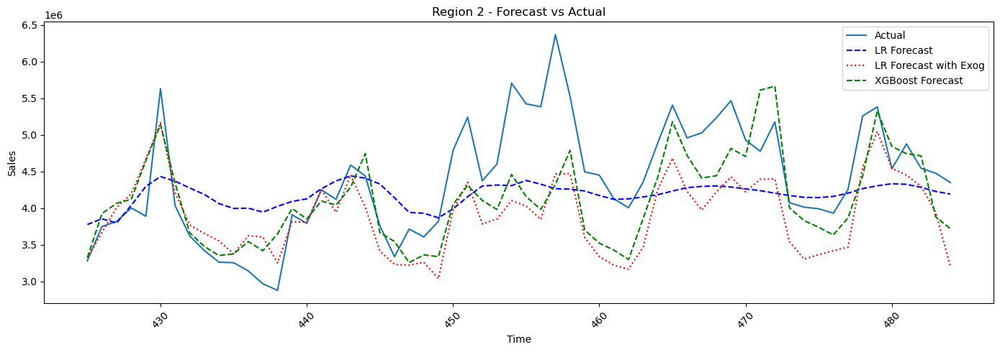

Region 3

Region 3 Forecast Performance with Linear Regression:
MAE : 604830.777
RMSE : 806155.061
MAPE: 0.151

Region 3 Forecast Performance with Linear Regression & Exogenous Variables:
MAE : 644942.079
RMSE : 802230.96
MAPE: 0.158

Region 3 Forecast Performance with XGBoost & Exogenous Variables::
MAE : 462565.927
RMSE : 620177.128
MAPE: 0.115


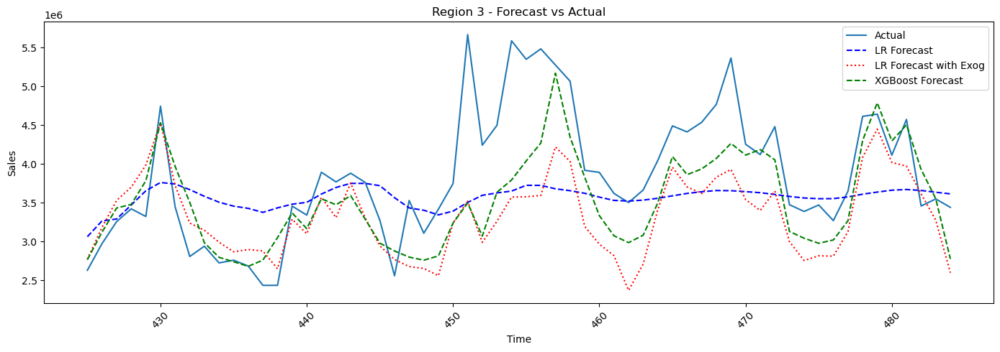

Region 4

Region 4 Forecast Performance with Linear Regression:
MAE : 303121.148
RMSE : 410950.775
MAPE: 0.138

Region 4 Forecast Performance with Linear Regression & Exogenous Variables:
MAE : 352951.477
RMSE : 437785.83
MAPE: 0.158

Region 4 Forecast Performance with XGBoost & Exogenous Variables::
MAE : 258010.147
RMSE : 347000.205
MAPE: 0.117


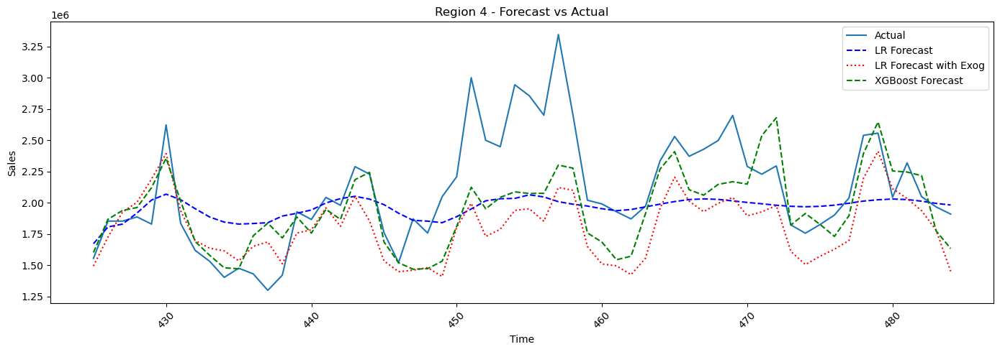

In [70]:
for name, data in lr_data_rec.items():
  print(name)
  recursive_forecast_test(name, data, target_col='Sales', forecast_horizon=60)

<h4><font color="cyan" style="sans-serif">Recursive Forecasting Test Report</font></h4>

* Linear Regression and XGBoost models were build and recursive forecasting was performed on test data using skforecast ForecasterRecursive.

* In this test the test data did not contain lag features from the original data but were created recursively i.e. sales was predicted one record (row) at a time and the predicted data was used as lag values for future dates. The predicted and actual sales values were then compared.  

* Interestingly the Linear Regression model performed better without exogenous variables (Date features like Weekend, Holiday, Day of the week, etc) while the XGBoost model performed much better with the exogenous variables and without the rolling 7,14,31 averages.

* Unlike the earlier scenario, here the XGBoost model outperformed the Linear Regression model in all datasets by a considerable margin.

* When applied recursively the Linear Regression model predicted sales for 60 days with a MAPE of between 12.4% (for Region 2) to 15.1% (for Region 3) with exogenous variable. Without exogenous variables, the Linear Regression Model had a higher MAPE between 13.1% to 15.8%.

* When applied recursively the XGBoost model with exogenous variables predicted sales for 60 days with a MAPE of between 10.1% (for Region 1) to 12.2% (for Region 4).

* The MAPE as expected is much higher but can be considered fairly good.  

* The LR model without exogenous variables resulted in a better MAPE than with exog variables. In visual analysis the LR predictions without exog variables shows a relatively smooth steadily line whereas the plot line for LR predictions with exog variables appears to follow the patterns of the actual predictions more closely like the XGBoost Model. A possible reason could be the presence of outliers in the Sales data being captured

.....

Readings:

* Company
  * Forecast Performance with Linear Regression: MAPE: 10.8%
  * Forecast Performance with Linear Regression & Exogenous Variables: 15.1%
  * Forecast Performance with XGBoost & Exogenous Variables:MAPE: 12.8%

* Region 1
  * Forecast Performance with Linear Regression: MAPE: 14.4%
  * Forecast Performance with Linear Regression & Exogenous Variables: 15.8%
  * Forecast Performance with XGBoost & Exogenous Variables:MAPE: 12.8%

* Region 2
  * Forecast Performance with Linear Regression: MAPE: 12.4%
  * Forecast Performance with Linear Regression & Exogenous Variables: 13.1%
  * Forecast Performance with XGBoost & Exogenous Variables:MAPE: 10.1%

* Region 3
  * Forecast Performance with Linear Regression: MAPE: 15.1%
  * Forecast Performance with Linear Regression & Exogenous Variables: 15.8%
  * Forecast Performance with XGBoost & Exogenous Variables:MAPE: 11.5%

* Region 4
  * Forecast Performance with Linear Regression: MAPE: 13.8.1%
  * Forecast Performance with Linear Regression & Exogenous Variables: 15.8%
  * Forecast Performance with XGBoost & Exogenous Variables:MAPE: 11.7%


<h3><font color="red" style="sans-serif">Regression Forecast : Inference Data</font></h3>
Data given in the file TEST_FINAL.csv was imported as dataframe df_test and will be used to predict sales for the period 2019-06-01 to 2019-07-31

<h4><font color="cyan" style="sans-serif">Preparing Dataset for Inferencing</font></h4>

In [71]:
# Inference (test) data provided as Test
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22265 entries, 0 to 22264
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   ID             22265 non-null  object
 1   Store_id       22265 non-null  int64 
 2   Store_Type     22265 non-null  object
 3   Location_Type  22265 non-null  object
 4   Region_Code    22265 non-null  object
 5   Date           22265 non-null  object
 6   Holiday        22265 non-null  int64 
 7   Discount       22265 non-null  object
dtypes: int64(2), object(6)
memory usage: 1.4+ MB


In [72]:
# Function to tranform and process the inference data given
# The test data provided is ungrouped with records of all stores for each day
# The data needs to be grouped and transformed for the Recursive Forecasting function
# The function will group and aggregate the data for Company and Regions : R1, R2, R3, R4

In [73]:
def inference_data_processor(data):
    import pandas as pd
    import numpy as np

    # Step 1: Convert 'Date' to datetime and add 'Discounted_Flag'
    data['Date'] = pd.to_datetime(data['Date'])
    data['Discounted_Flag'] = data['Discount'].apply(lambda x: 1 if x == 'Yes' else 0)

    # Step 2: function to process each group
    def process_group(group_df):
        group_df = group_df.groupby('Date').agg({
            'Holiday': 'last',
            'Discounted_Flag': lambda x: x.sum() / x.count()
        }).rename(columns={'Discounted_Flag': 'Discounted Stores'})

        # Date features
        group_df['Day Count'] = (group_df.index - group_df.index.min()).days
        group_df['Weekend'] = group_df.index.dayofweek.isin([5, 6]).astype(int)
        day_of_week = group_df.index.dayofweek
        month = group_df.index.month

        # Cyclical features
        group_df['Month_sine'] = np.sin(2 * np.pi * month / 12)
        group_df['Month_cosine'] = np.cos(2 * np.pi * month / 12)
        group_df['Day of Week_sine'] = np.sin(2 * np.pi * day_of_week / 7)
        group_df['Day of Week_cosine'] = np.cos(2 * np.pi * day_of_week / 7)

        return group_df

    # Step 3: Create datasets
    inf_all = process_group(data)
    inf_r1 = process_group(data[data['Region_Code'] == 'R1'])
    inf_r2 = process_group(data[data['Region_Code'] == 'R2'])
    inf_r3 = process_group(data[data['Region_Code'] == 'R3'])
    inf_r4 = process_group(data[data['Region_Code'] == 'R4'])

    return inf_all, inf_r1, inf_r2, inf_r3, inf_r4



In [74]:
# Creating Inference Dataframes
inf_all, inf_r1, inf_r2, inf_r3, inf_r4 = inference_data_processor(df_test)

In [75]:
inf_all.head()

,Holiday,Discounted Stores,Day Count,Weekend,Month_sine,Month_cosine,Day of Week_sine,Day of Week_cosine
Date,,,,,,,,
2019-06-01,0,0.03,0,1,0.00,-1.00,-0.97,-0.22
2019-06-02,0,0.03,1,1,0.00,-1.00,-0.78,0.62
2019-06-03,0,0.12,2,0,0.00,-1.00,0.00,1.00
2019-06-04,0,0.12,3,0,0.00,-1.00,0.78,0.62
2019-06-05,1,0.69,4,0,0.00,-1.00,0.97,-0.22


In [76]:
inf_sets = {'Company': inf_all, 'Region 1': inf_r1, 'Region 2': inf_r2, 'Region 3': inf_r3, 'Region 4':inf_r4}

In [77]:
inf_all.to_csv('inf_all.csv')
inf_r1.to_csv('inf_r1.csv')
inf_r2.to_csv('inf_r2.csv')
inf_r3.to_csv('inf_r3.csv')
inf_r4.to_csv('inf_r4.csv')

In [78]:
# Recursive Prediction Function for Inference Data...
# df_train : Training data
# df_inference: is the inference data for the period to be forecasted
# inf_label : Regional Level of the inference data e.g. Company, Region 1, Region 2, etc

In [79]:
def recursive_forecast(df_train, df_inference, inf_label, target_col='Sales'):
    # Copy input data
    df_train = df_train.copy()
    df_inference = df_inference.copy()

    #set date frequency (error fix)
    df_train.index.freq = 'D'
    df_inference.index.freq = 'D'

    # Extract target and exogenous variables
    y_train = df_train[target_col]
    X_train = df_train.drop(columns=[target_col])
    X_inference = df_inference.drop(columns=[target_col]) if target_col in df_inference.columns else df_inference

    # Forecast horizon
    forecast_horizon = len(df_inference)

    # Lag and rolling
    window_features = rolling_features = RollingFeatures(
        stats=['mean','mean','mean'],
        window_sizes=[7, 14, 31])

    max_lag = 31
    last_window = y_train[-max_lag:]  # or more if rolling windows are large

    # Initialize forecasters
    forecaster_lr = ForecasterRecursive(
        regressor=LinearRegression(),
        lags=[1, 2, 3, 7, 31],
        window_features=window_features)

    forecaster_xgb = ForecasterRecursive(
        regressor=XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
        lags=[1, 2, 3, 7, 31])

    # Fit models with exogenous variables
    forecaster_lr.fit(y=y_train, exog=X_train)
    forecaster_xgb.fit(y=y_train, exog=X_train)

    # Predict with exogenous variables for inference period
    y_pred_lr = forecaster_lr.predict(steps=forecast_horizon, exog=X_inference, last_window=y_train[-max_lag:])
    y_pred_xgb = forecaster_xgb.predict(steps=forecast_horizon, exog=X_inference, last_window=y_train[-max_lag:])

    # Assign predictions to df_inference
    df_inference_lr = df_inference.copy()
    df_inference_lr['Sales'] = y_pred_lr.values

    df_inference_xgb = df_inference.copy()
    df_inference_xgb['Sales'] = y_pred_xgb.values

    # Plot results
    plt.figure(figsize=(14, 5))
    plt.plot(df_train.index[-100:], y_train[-100:], label="Historical Sales", color='black')
    plt.plot(df_inference_lr.index, df_inference_lr['Sales'], linestyle="dashed", label="Predicted Sales (LR)", color="blue")
    plt.plot(df_inference_xgb.index, df_inference_xgb['Sales'], linestyle="dashed", label="Predicted Sales (XGB)", color="green")
    plt.title(f"Forecasted Sales for {inf_label}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return df_inference_lr, df_inference_xgb


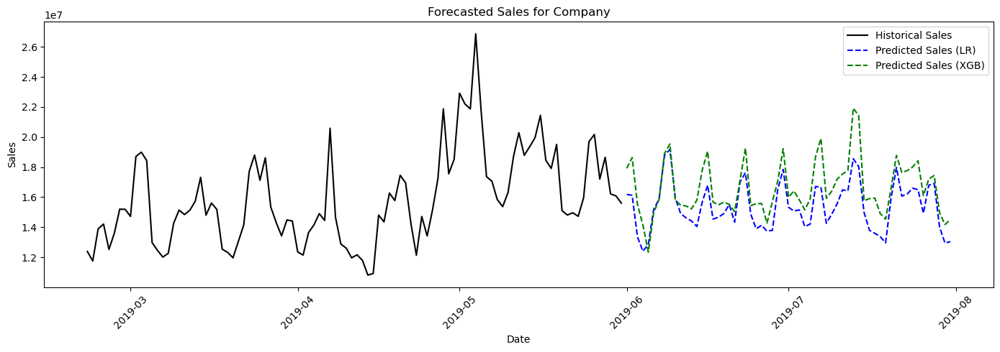

In [80]:
lr_predictions_co, xgb_predictions_co = recursive_forecast(lr_co_rec, inf_all, 'Company','Sales')

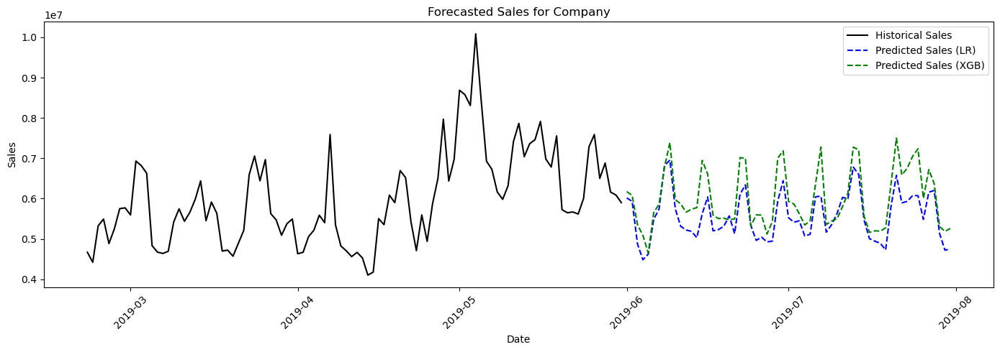

In [81]:
lr_predictions_r1, xgb_predictions_r1 = recursive_forecast(lr_r1_rec, inf_all, 'Company','Sales')

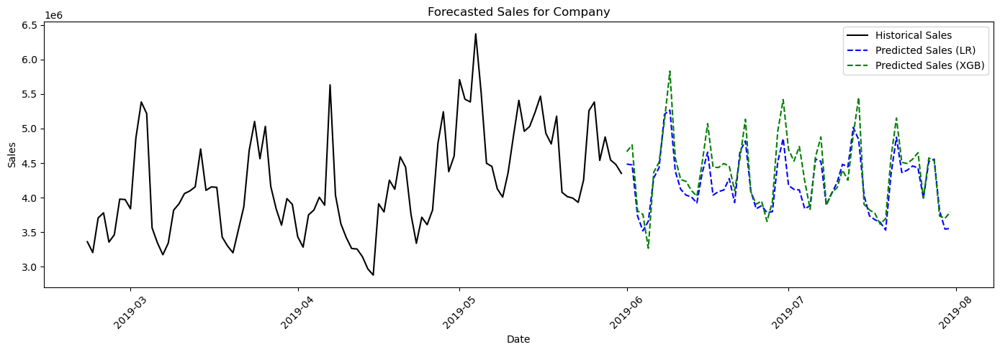

In [82]:
lr_predictions_r2, xgb_predictions_r2 = recursive_forecast(lr_r2_rec, inf_all, 'Company','Sales')

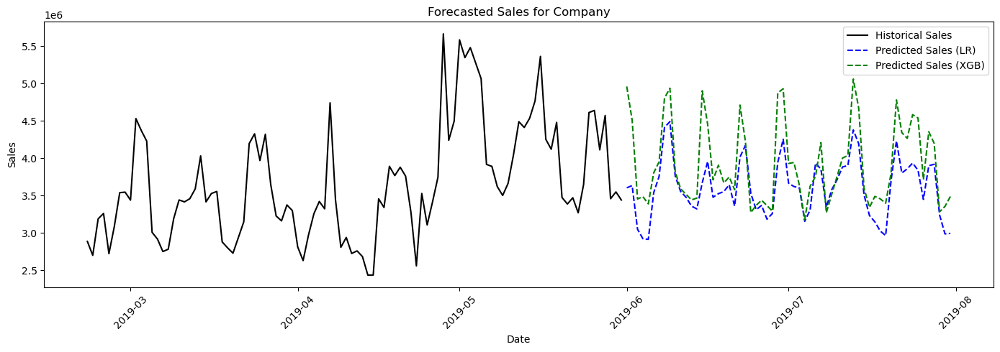

In [83]:
lr_predictions_r3, xgb_predictions_r3 = recursive_forecast(lr_r3_rec, inf_all, 'Company','Sales')

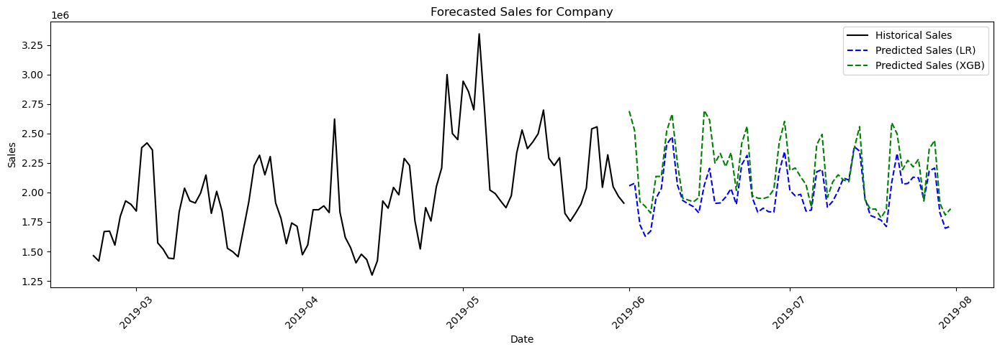

In [84]:
lr_predictions_r4, xgb_predictions_r4 = recursive_forecast(lr_r4_rec, inf_all, 'Company','Sales')

In [85]:
lr_predictions_r4.head()

,Holiday,Discounted Stores,Day Count,Weekend,Month_sine,Month_cosine,Day of Week_sine,Day of Week_cosine,Sales
Date,,,,,,,,,
2019-06-01,0,0.03,0,1,0.00,-1.00,-0.97,-0.22,"2,056,091.50"
2019-06-02,0,0.03,1,1,0.00,-1.00,-0.78,0.62,"2,078,104.71"
2019-06-03,0,0.12,2,0,0.00,-1.00,0.00,1.00,"1,727,110.98"
2019-06-04,0,0.12,3,0,0.00,-1.00,0.78,0.62,"1,628,804.19"
2019-06-05,1,0.69,4,0,0.00,-1.00,0.97,-0.22,"1,672,344.97"


<h1><font color="red" style="sans-serif">Time Series Methods</font></h1>

<h4><font color="cyan" style="sans-serif">Datasets</font></h4>
We have grouped and aggregated time series data sets for the Company ts_co and the Region Codes: ts_r1, ts_r2, ts_r3, ts_r4`m

In [86]:
ts_co.head()

,Holiday,Discounted Stores,Orders,Sales,Anomaly
Date,,,,,
2018-01-01,1,1.00,19666,"15,345,484.50",0
2018-01-02,0,1.00,25326,"19,592,415.00",0
2018-01-03,0,1.00,24047,"18,652,527.00",0
2018-01-04,0,1.00,25584,"19,956,267.00",0
2018-01-05,0,1.00,28436,"22,902,651.00",0


In [87]:
ts_data = {'Company': ts_co, 'Region 1': ts_r1, 'Region 2': ts_r2, 'Region 3': ts_r3, 'Region 4':ts_r4}

In [88]:
# Replacing Anomalies using Linear Interpolation

for i, (name, data) in enumerate(ts_data.items()):
  data['Sales'] = data.apply(lambda row: row['Sales'] if row['Anomaly'] == 0 else None, axis = 1)
  data['Sales'] = data['Sales'].interpolate(method = 'linear', axis = 0)

In [89]:
ts_co.head()

,Holiday,Discounted Stores,Orders,Sales,Anomaly
Date,,,,,
2018-01-01,1,1.00,19666,"15,345,484.50",0
2018-01-02,0,1.00,25326,"19,592,415.00",0
2018-01-03,0,1.00,24047,"18,652,527.00",0
2018-01-04,0,1.00,25584,"19,956,267.00",0
2018-01-05,0,1.00,28436,"22,902,651.00",0


In [90]:
ts_co.drop(columns = ["Anomaly"], inplace = True)
ts_r1.drop(columns = ["Anomaly"], inplace = True)
ts_r2.drop(columns = ["Anomaly"], inplace = True)
ts_r3.drop(columns = ["Anomaly"], inplace = True)
ts_r4.drop(columns = ["Anomaly"], inplace = True)

<h1><font color="red" style="sans-serif">Time Series Analysis</font></h1>

<h4><font color="cyan" style="sans-serif">Decomposition</font></h4>

Company


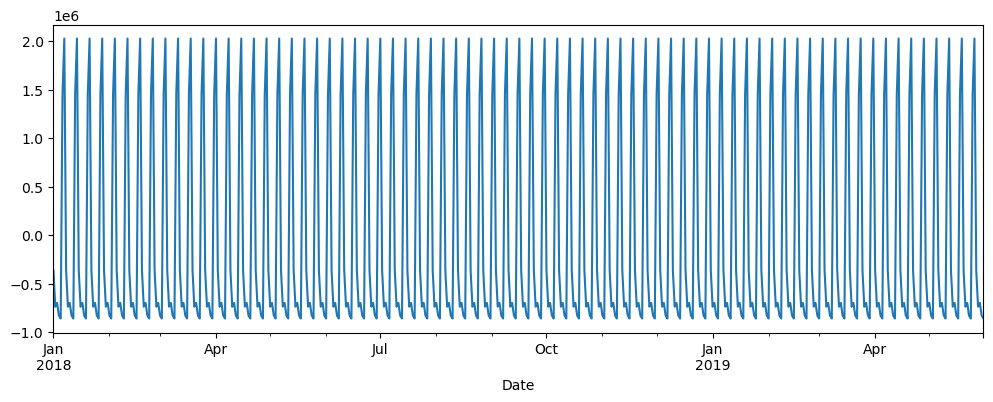


Region 1


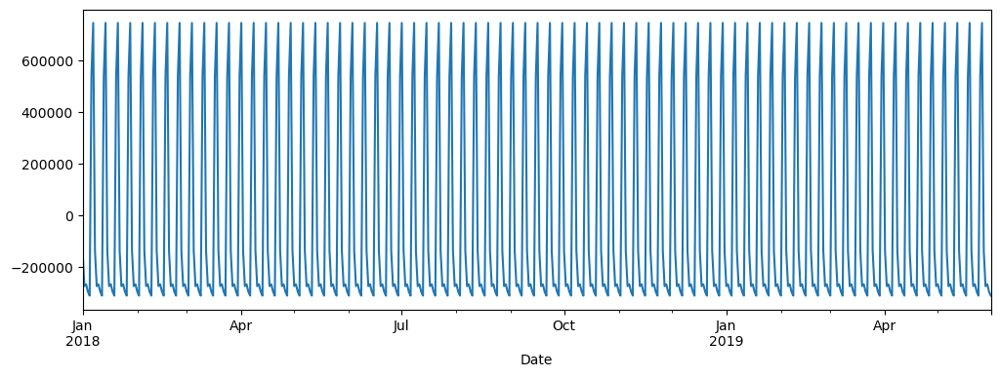


Region 2


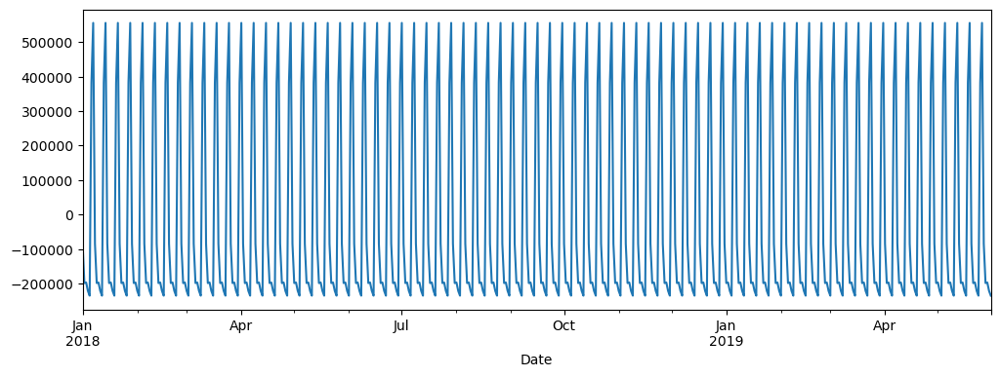


Region 3


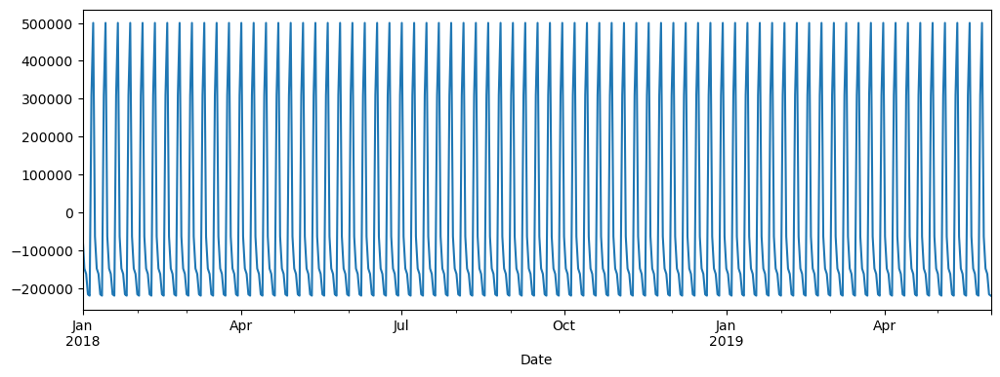


Region 4


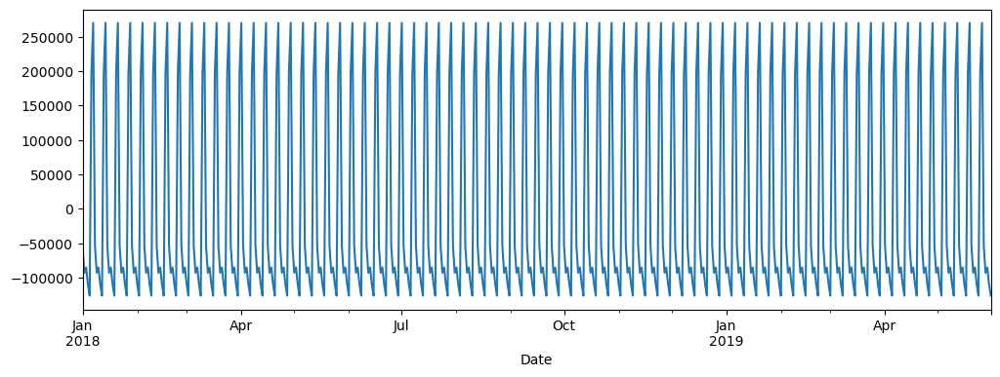

In [91]:
for name, data in ts_data.items():
  decompose = sm.tsa.seasonal_decompose(data['Sales'])
  print(name)
  plt.figure(figsize=(12, 4))

  decompose.seasonal.plot()

  plt.show()
  print()

Company


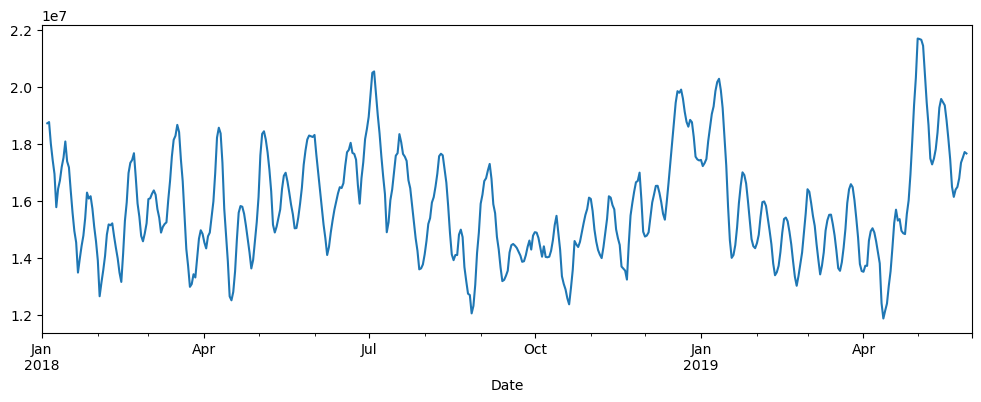


Region 1


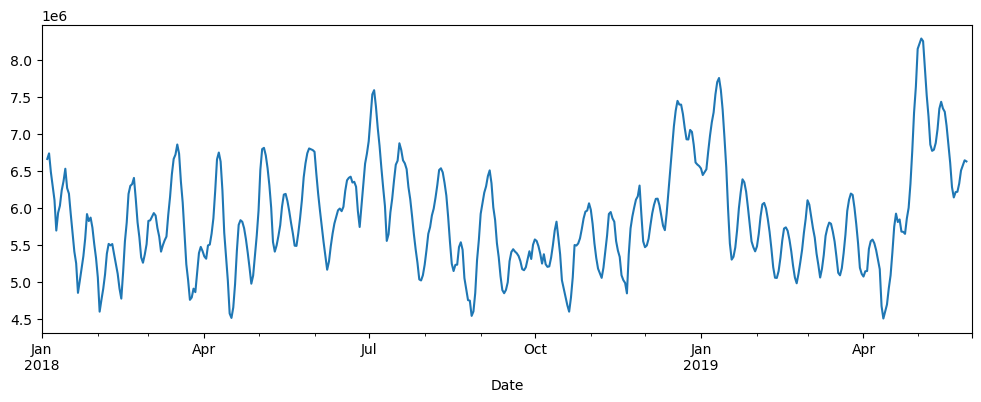


Region 2


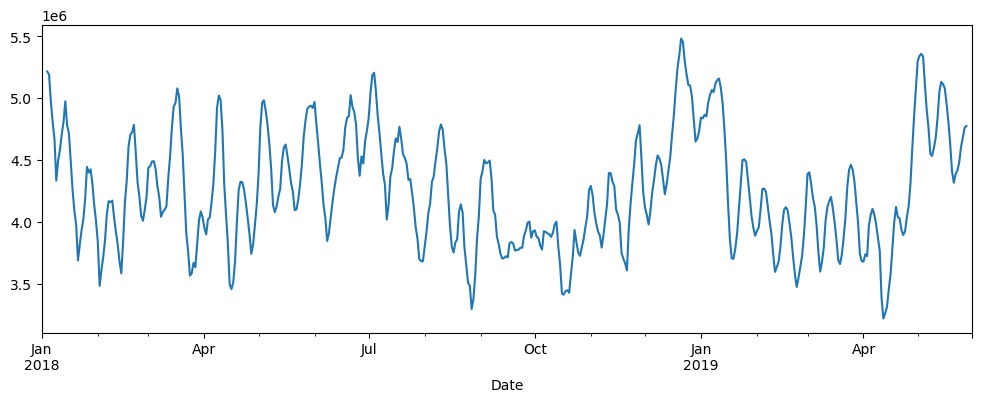


Region 3


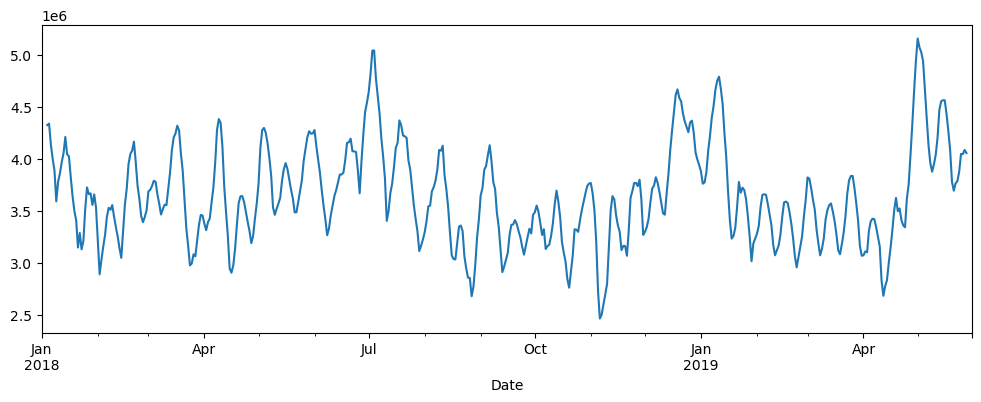


Region 4


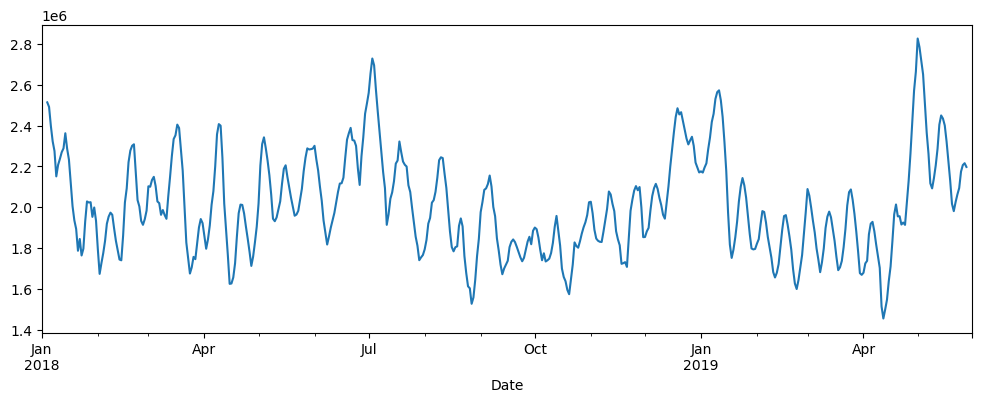

In [92]:
for name, data in ts_data.items():
  decompose = sm.tsa.seasonal_decompose(data['Sales'])
  print(name)
  plt.figure(figsize=(12, 4))

  decompose.trend.plot()

  plt.show()
  print()

Company
Kurtosis: 1.2402517809927995


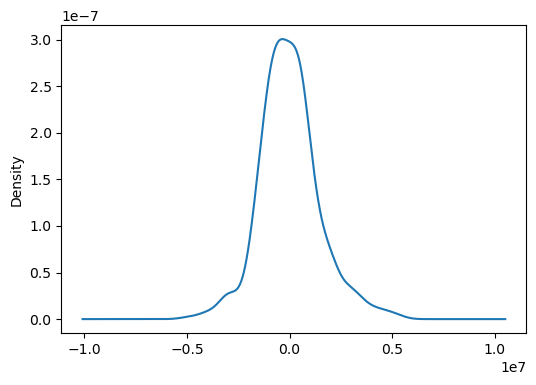


Region 1
Kurtosis: 1.3855173063097364


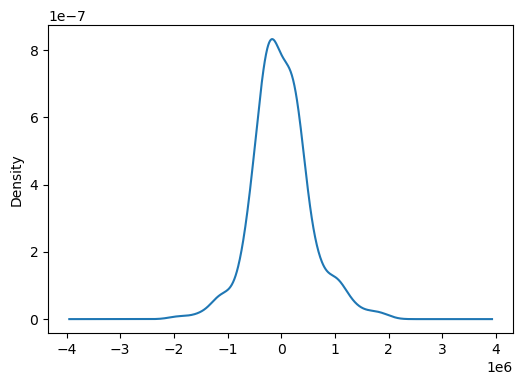


Region 2
Kurtosis: 1.4674534687252154


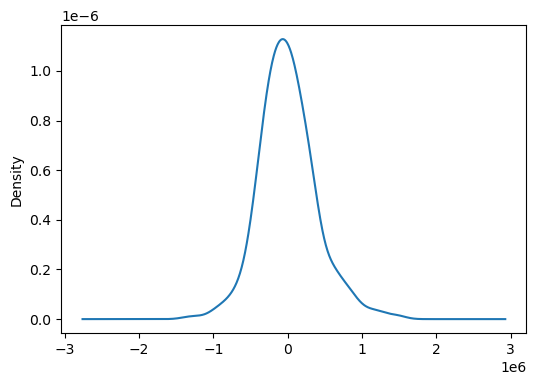


Region 3
Kurtosis: 1.3629391805409345


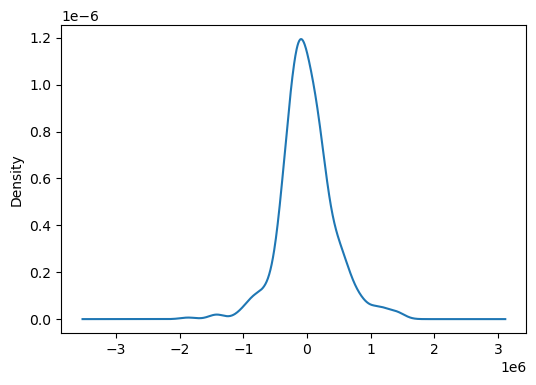


Region 4
Kurtosis: 2.2979928543589456


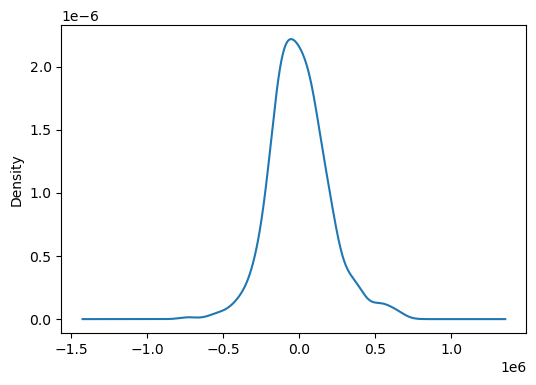

In [93]:
for name, data in ts_data.items():
  print(name)
  print("Kurtosis:",decompose.resid.kurt())

  decompose = sm.tsa.seasonal_decompose(data['Sales'])

  plt.figure(figsize=(6, 4))

  decompose.resid.plot(kind="kde")

  plt.show()
  print()

<h4><font color="cyan" style="sans-serif">Observations</font></h4>
* The seasonal decomposition plot shows weekly seasonality
* There's a sideway trend which changes with no visible upwards or downwards direction. The series most likely stationary.
* Residues show a normal distribution.

<h3><font color="red" style="sans-serif">Checking Stationarity: Dickey-Fuller Test</font></h3>

In [94]:
for name, data in ts_data.items():
   pvalue = sm.tsa.stattools.adfuller(data['Sales'])[1]
   if pvalue <= 0.05:
      print(f'pvalue = {round(pvalue,4)}. Sequence for {name} is stationary')
   else:
      print(f'pvalue = {round(pvalue,4)}. Sequence {name} is not stationary')

pvalue = 0.0172. Sequence for Company is stationary
pvalue = 0.0192. Sequence for Region 1 is stationary
pvalue = 0.0178. Sequence for Region 2 is stationary
pvalue = 0.0208. Sequence for Region 3 is stationary
pvalue = 0.0114. Sequence for Region 4 is stationary


<h4><font color="cyan" style="sans-serif">Observations</font></h4>
According to the Dickey Fuller Test, all 5 time series are stationary. i.e. the mean, variance is constant in the series.

<h3><font color="red" style="sans-serif">ACF, PACF Analysis</font></h3>

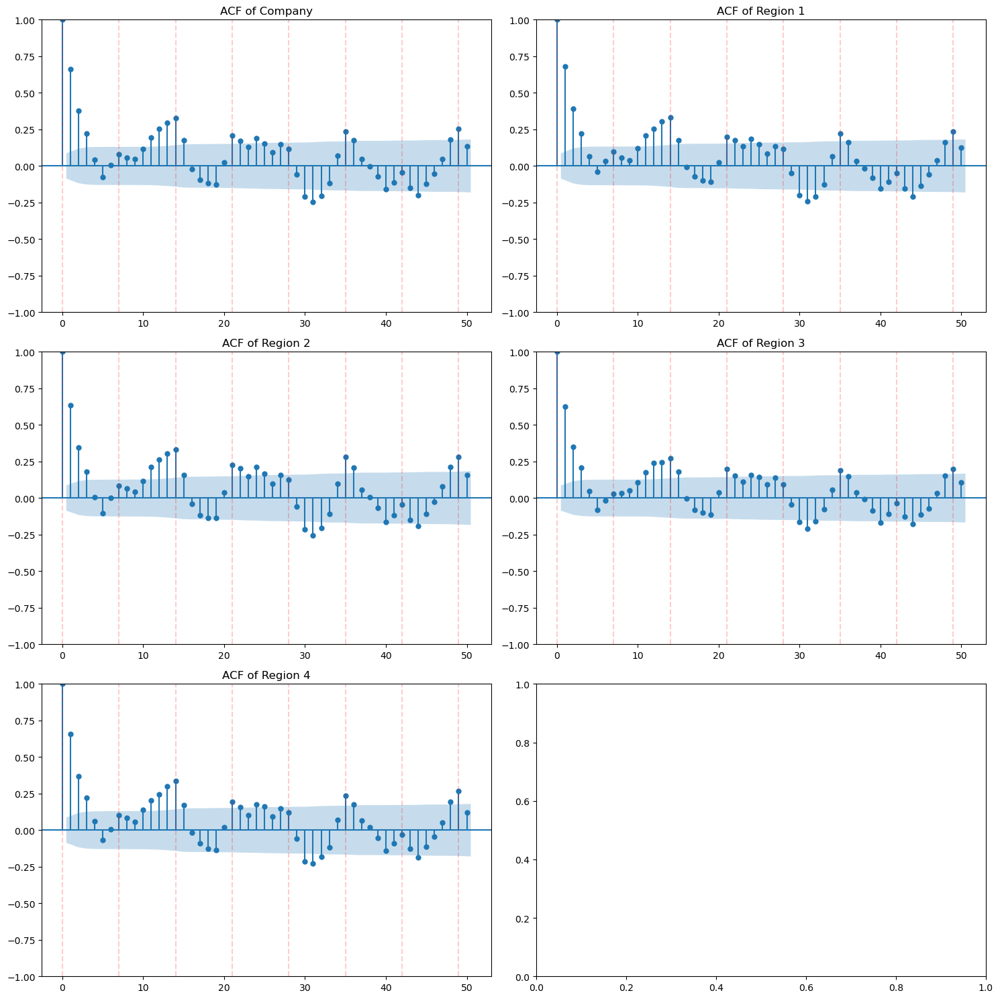

In [95]:
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
axes = axes.flatten()
for i, (name, data) in enumerate(ts_data.items()):
  plot_acf(data['Sales'], ax=axes[i], lags=50)
  axes[i].set_title(f'ACF of {name}')
  for x_val in range(0,50,7):
        axes[i].axvline(x=x_val, color='red', linestyle='--', alpha=0.2)

plt.tight_layout()
plt.show()

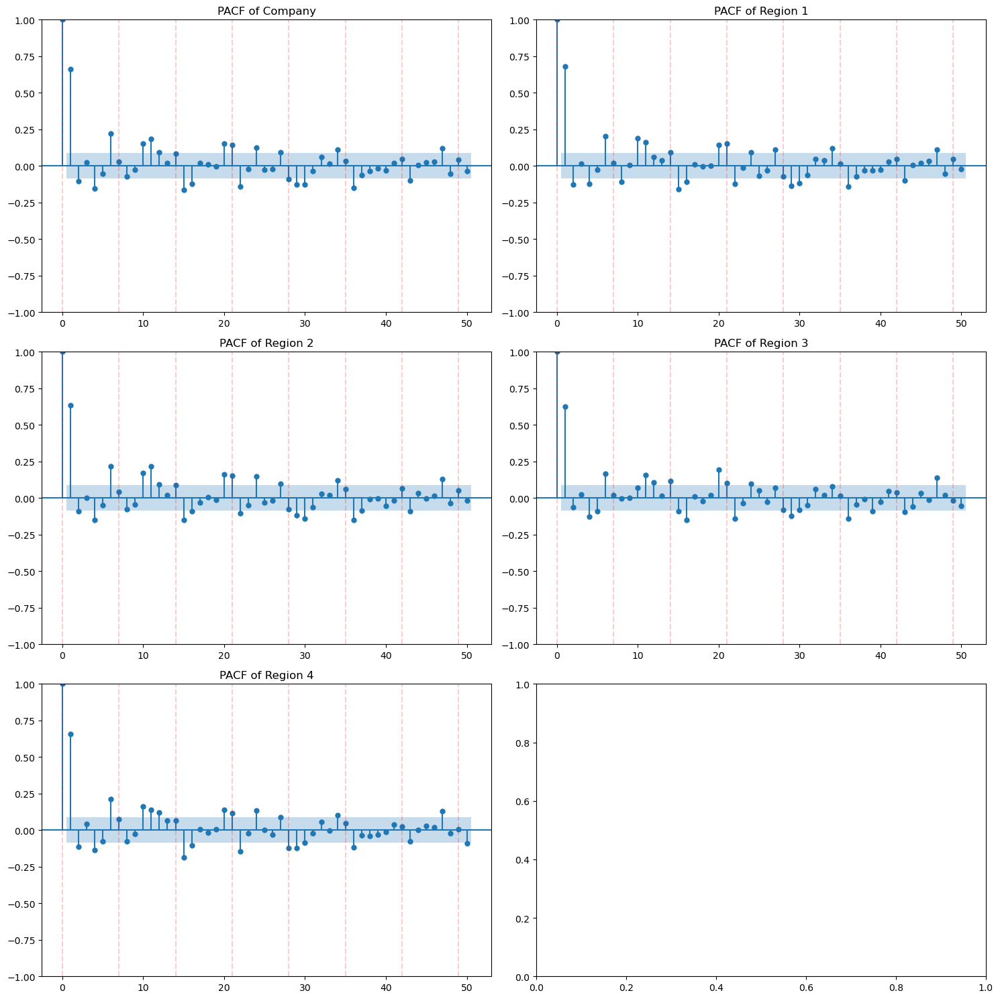

In [96]:
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
axes = axes.flatten()
for i, (name, data) in enumerate(ts_data.items()):
    plot_pacf(data['Sales'], ax=axes[i], lags=50)
    axes[i].set_title(f'PACF of {name}')
    for x_val in range(0,50,7):
        axes[i].axvline(x=x_val, color='red', linestyle='--', alpha=0.2)
plt.tight_layout()
plt.show()

<h4><font color="cyan" style="sans-serif">Observations</font></h4>

* The PACF plots show the corelation is significant at lag 1 after which it drops sharply to below significance level or in some cases just above. We can take Auto Regression (p) = 1 or 2
* The ACF plots shows the corelation drop sharply below significant levels after the first 3 lags. We can take the Moving Average (q) = 3.

In [97]:
ts_co.head()

,Holiday,Discounted Stores,Orders,Sales
Date,,,,
2018-01-01,1,1.00,19666,"15,345,484.50"
2018-01-02,0,1.00,25326,"19,592,415.00"
2018-01-03,0,1.00,24047,"18,652,527.00"
2018-01-04,0,1.00,25584,"19,956,267.00"
2018-01-05,0,1.00,28436,"22,902,651.00"



<h3><font color="red" style="sans-serif">ARIMA Forecasting</font></h3>

In [98]:
# The arima_forecast function will
# Split the data into train & test
# Use grid search to find the best p,d,q combination that will result in best MAPE
# Use ARIMA modeling with best p,d,q params to forecast(predict) the values of the test data
# Plot the comparison between actual test data and forecasted values
# Use ARIMA modeling on the entire series to forecast m steps in the future
# Plot the series and prediction

In [99]:
def arima_forecast(ts_data, test_size, m_steps):
    warnings.filterwarnings("ignore")

    ts_data.index.freq = 'D'

    # Step 1: Train-test split
    train_data = ts_data[:-test_size]
    test_data = ts_data[-test_size:]

    # Step 2: Grid Search for ARIMA
    arima_order_grid = list(product(range(4), range(2), range(4)))
    arima_best_mape = np.inf
    arima_best_order = None
    arima_forecast = None

    for p, d, q in arima_order_grid:
        try:
            #print(f"Trying ARIMA({p}, {d}, {q})") # for debugging
            test_model = ARIMA(train_data, order=(p, d, q))
            model_fit = test_model.fit()
            forecast = model_fit.forecast(steps=m_steps)

            mape_score = mape(test_data[:m_steps], forecast)

            if mape_score < arima_best_mape:
                arima_best_mape = mape_score
                arima_best_order = (p, d, q)
                arima_forecast = forecast
                test_forecast = forecast  #for test vs pred plot

        except Exception:
            continue

    if arima_forecast is None:
        print("ARIMA returned None.")
        return

    print(f"\n Best ARIMA parameters: {arima_best_order}")
    print(f"Best MAPE on test split: {arima_best_mape:.4f}\n")

    # Step 3: Train on full dataset
    model = ARIMA(ts_data, order=arima_best_order)
    pred_model = model.fit()
    final_forecast = pred_model.forecast(steps=m_steps)

    # Step 4: Plot Test Prediction vs Actual
    plt.figure(figsize=(10, 4))
    plt.plot(test_data.index[:m_steps], test_data[:m_steps], label='Actual Test Data')
    plt.plot(test_data.index[:m_steps], test_forecast, label='Test Prediction', linestyle='--')
    plt.title('ARIMA Forecast vs Actual on Test Set')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Step 5: Plot Full Forecast from Entire Dataset
    plt.figure(figsize=(10, 4))
    plt.plot(ts_data.index[-100:], ts_data[-100:], label='Last 100 Data Points')
    future_index = pd.date_range(ts_data.index[-1], periods=m_steps + 1, freq='D')[1:]
    plt.plot(future_index, final_forecast, label='Forecast from Full Data', linestyle='--')
    plt.title('ARIMA Forecast for the Next m Steps')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return final_forecast


<h3><font color="red" style="sans-serif">Sales Forecasts Using ARIMA</font></h3>


 Best ARIMA parameters: (3, 0, 2)
Best MAPE on test split: 0.1436



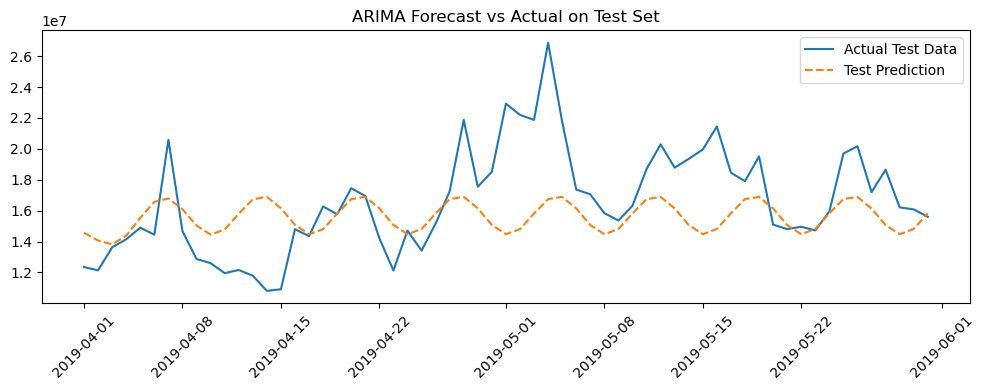

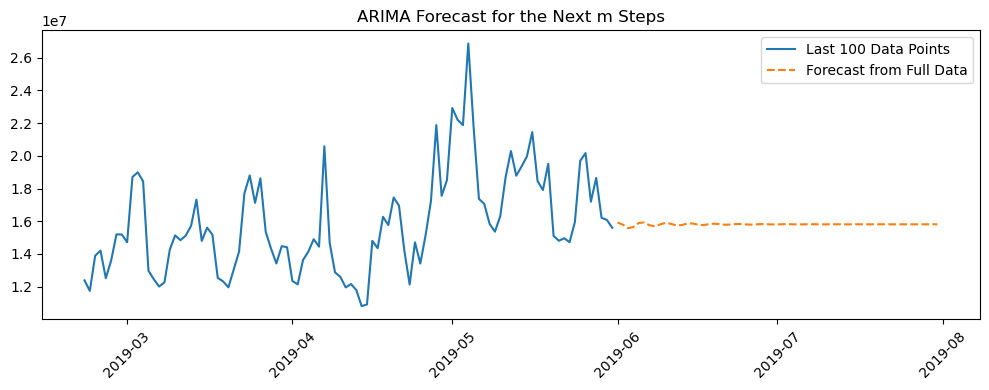

2019-06-01   15,919,691.76
2019-06-02   15,792,431.59
2019-06-03   15,572,259.60
2019-06-04   15,655,455.23
2019-06-05   15,894,352.82
                  ...     
2019-07-27   15,812,590.22
2019-07-28   15,812,512.79
2019-07-29   15,813,261.79
2019-07-30   15,813,567.10
2019-07-31   15,813,058.84
Freq: D, Name: predicted_mean, Length: 61, dtype: float64

In [100]:
arima_forecast(ts_co['Sales'], 61, 61)


 Best ARIMA parameters: (3, 1, 3)
Best MAPE on test split: 0.1590



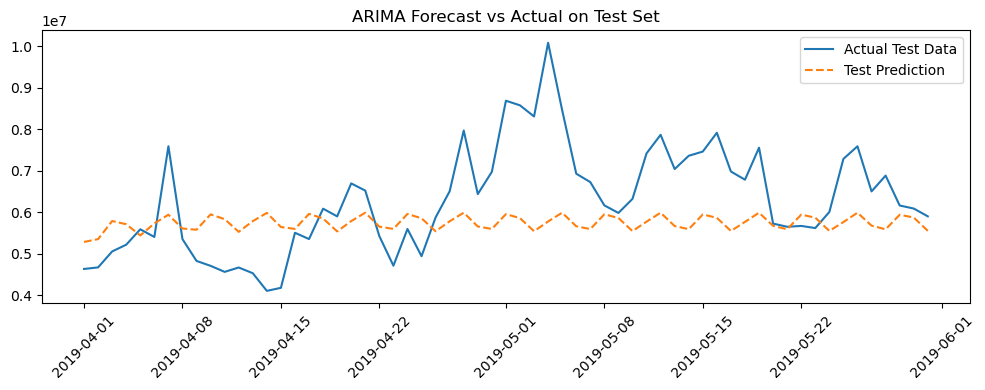

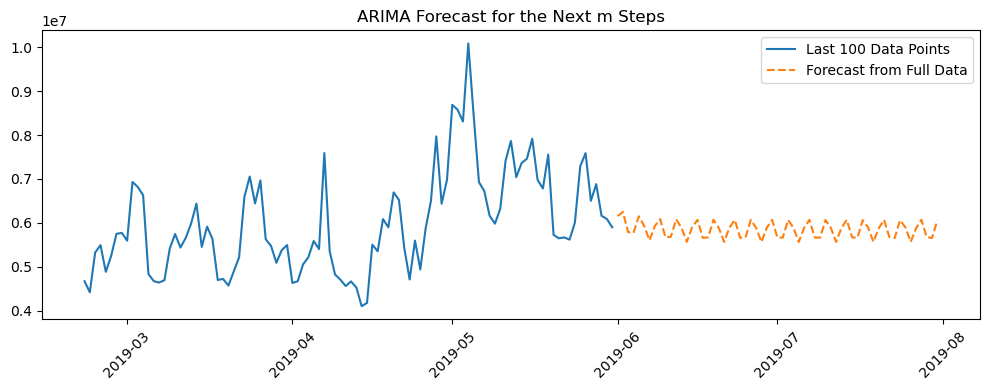

2019-06-01   6,153,428.04
2019-06-02   6,248,108.56
2019-06-03   5,788,008.65
2019-06-04   5,773,977.15
2019-06-05   6,149,608.13
                 ...     
2019-07-27   5,874,809.47
2019-07-28   6,070,940.36
2019-07-29   5,677,846.34
2019-07-30   5,655,279.57
2019-07-31   6,058,019.69
Freq: D, Name: predicted_mean, Length: 61, dtype: float64

In [101]:
arima_forecast(ts_r1['Sales'], 61, 61)


 Best ARIMA parameters: (3, 1, 3)
Best MAPE on test split: 0.1426



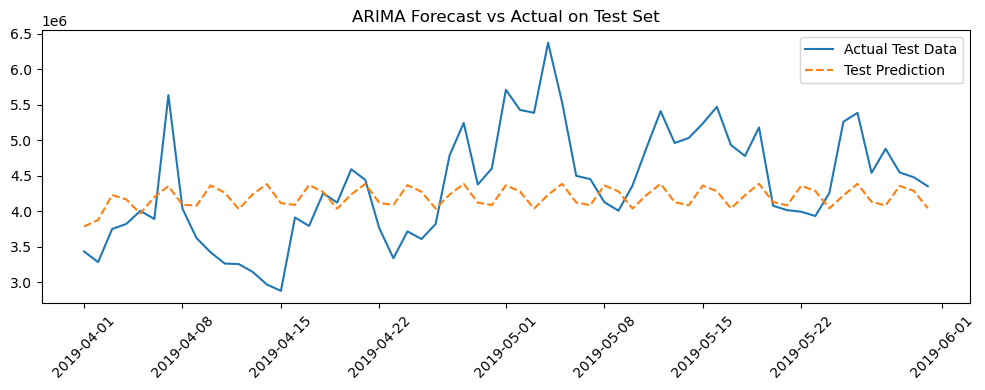

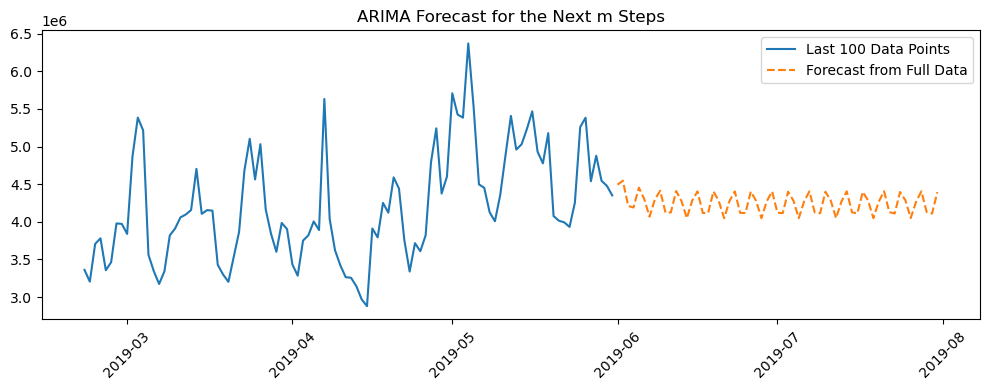

2019-06-01   4,493,436.89
2019-06-02   4,546,440.11
2019-06-03   4,211,551.48
2019-06-04   4,189,845.45
2019-06-05   4,453,897.98
                 ...     
2019-07-27   4,264,010.07
2019-07-28   4,406,134.04
2019-07-29   4,129,439.83
2019-07-30   4,109,548.63
2019-07-31   4,394,811.56
Freq: D, Name: predicted_mean, Length: 61, dtype: float64

In [102]:
arima_forecast(ts_r2['Sales'], 61, 61)


 Best ARIMA parameters: (3, 0, 2)
Best MAPE on test split: 0.1578



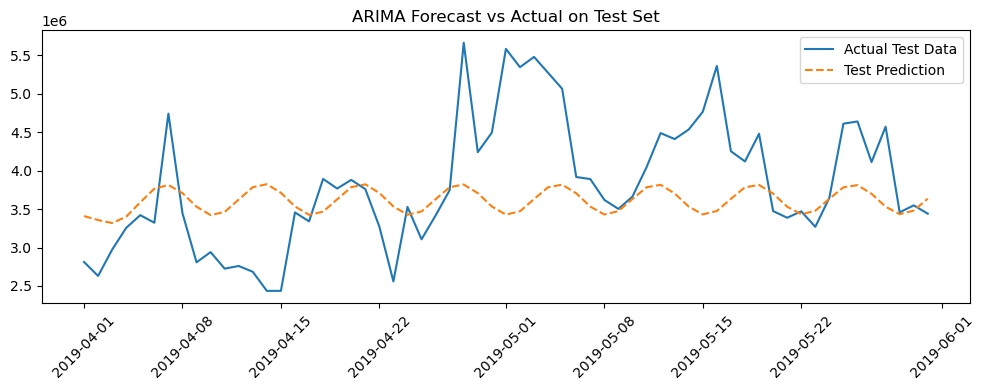

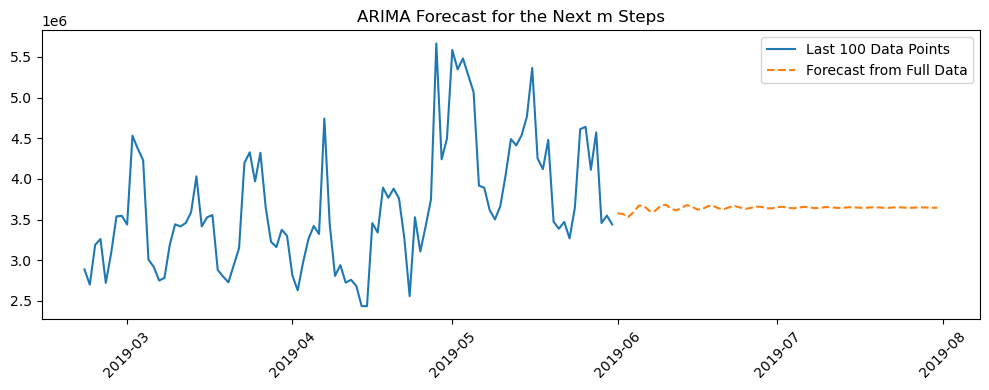

2019-06-01   3,578,617.38
2019-06-02   3,567,895.48
2019-06-03   3,532,776.18
2019-06-04   3,590,250.89
2019-06-05   3,672,523.05
                 ...     
2019-07-27   3,648,322.00
2019-07-28   3,650,277.91
2019-07-29   3,648,432.38
2019-07-30   3,646,219.25
2019-07-31   3,647,278.29
Freq: D, Name: predicted_mean, Length: 61, dtype: float64

In [103]:
arima_forecast(ts_r3['Sales'], 61, 61)


 Best ARIMA parameters: (1, 1, 1)
Best MAPE on test split: 0.1585



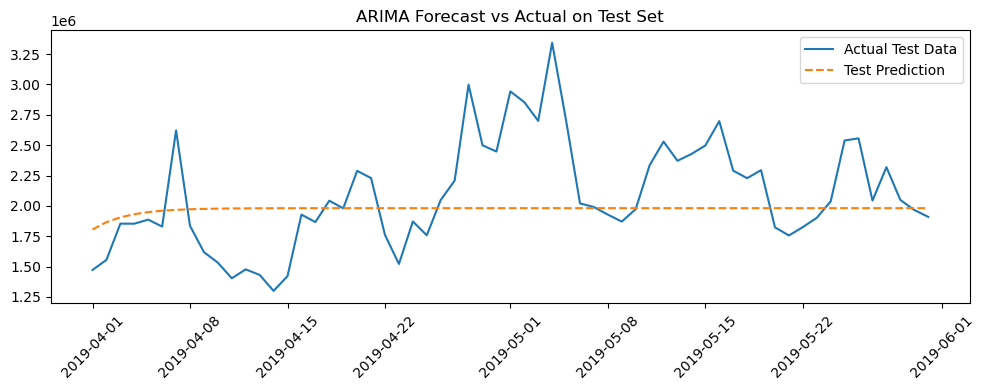

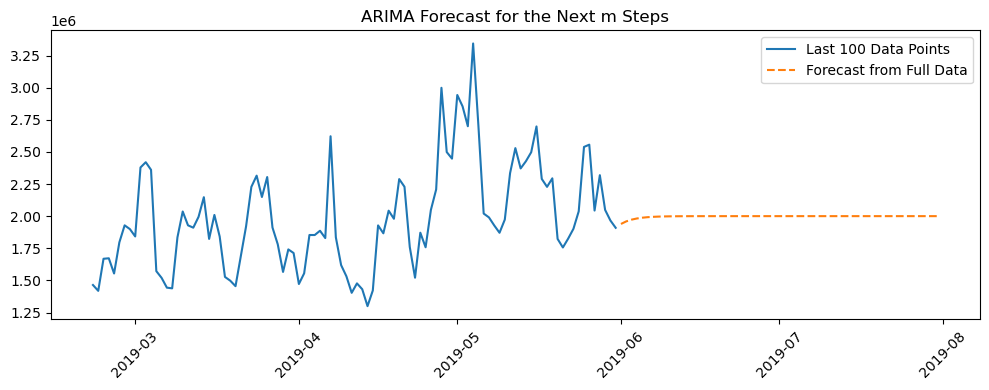

2019-06-01   1,939,226.94
2019-06-02   1,959,284.12
2019-06-03   1,972,735.11
2019-06-04   1,981,755.77
2019-06-05   1,987,805.31
                 ...     
2019-07-27   2,000,122.88
2019-07-28   2,000,122.88
2019-07-29   2,000,122.88
2019-07-30   2,000,122.88
2019-07-31   2,000,122.88
Freq: D, Name: predicted_mean, Length: 61, dtype: float64

In [104]:
arima_forecast(ts_r4['Sales'], 61, 61)

<h4><font color="cyan" style="sans-serif">ARIMA Prediction Results</font></h4>

 * The ARIMA model was used to predict 61 datapoints from the test set to identify the best AR(p), Diffencing (d) and MA(q) values using which the model forecasted 61 datapoints to match the duration of the inference period defined in the test dataset given i.e. from 2019-06-01 to 2019-07-31.

 * The model identified different best p,d,q order for the Company dataset (ts_co) and Regional datasets (ts_r1, ts_r2, ts_r3, ts_r4) for regions R1, R2, R3, R4.

 * The ARIMA forecasts achieved good MAPE for the various datasets in the range of 14.26% (For Regions R2) to 15.90% (For Region R1).

 * Company:
  * Best order: (3, 0, 2)
  * Best Test MAPE: 14.36%

*  Region 1 (R1):
  * Best order: (3, 1, 3)
  * Best Test MAPE: 15.90%

*  Region 2 (R2):
  * Best order: (3, 1, 3)
  * Best Test MAPE: 14.26%

*  Region 3 (R3):
  * Best order: (3, 0, 2)
  * Best Test MAPE: 15.78%

*  Region 4 (R4):
  * Best order: (1, 1, 1)
  * Best Test MAPE: 15.85%

<h3><font color="red" style="sans-serif">SARIMAX Forecasting</font></h3>

In [105]:
# The sarimax_forecast function will..
  # Split the data into train & test
  # Use grid search to find the best p,d,q and P,D,Q combination that will result in best MAPE
  # Use SARIMAX modeling with best p,d,q and P,D,Q params to forecast(predict) the values of the test data
  # Plot the comparison between actual test data and forecasted values
  # Use SARIMAX modeling on the entire series to forecast m steps in the future
  # Plot the series and forecast
# Arguments:
  # ts_dat : Dataset for Training and Test
  # test_size : Size of test data
  # m_steps : No. of future dates/ datapoints to forecast
  # exog : exog variables for Training & Test dataset
  # exog_pred : exog variables for prediction period
# Max prediction period limit: 61 days

In [106]:

def sarimax_forecast(ts_data, test_size, m_steps, exog, exog_pred):
    warnings.filterwarnings("ignore")

    ts_data.index.freq = 'D'
    exog.index.freq = 'D'
    exog_pred.index.freq = 'D'

    # Step 1: Train-test split
    train_data = ts_data[:-test_size]
    test_data = ts_data[-test_size:]
    exog_train = exog[:-test_size]
    exog_test = exog[-test_size:]

    exog_pred = exog_pred[:m_steps]

    # Step 2: Grid Search for SARIMAX
    sarimax_order = list(product(range(3), range(2), range(3)))
    sarimax_seasonal_order = list(product(range(3), range(2), range(3)))
    sarimax_best_mape = np.inf
    sarimax_best_pdq = None
    sarimax_best_PDQ = None
    sarimax_test_forecast = None
    seasons = [7]

    for p,d,q in sarimax_order:
      for P,D, Q in sarimax_seasonal_order:
        for s in seasons:
          try:
            model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s), exog=exog_train)
            model_fit = model.fit(disp=False, maxiter=200)
            test_forecast = model_fit.forecast(steps=m_steps, exog=exog_test)

            mape_score = mape(test_data[:m_steps], test_forecast)

            if mape_score < sarimax_best_mape:
              sarimax_best_mape = mape_score
              sarimax_best_pdq = (p, d, q)
              sarimax_best_PDQ = (P, D, Q)
              sarimax_test_forecast = test_forecast
              print(f"Best MAPE on test split updated to: {sarimax_best_mape:.4f}\n")


          except Exception as e:
            print(f"SARIMAX model failed with parameters: order=({p}, {d}, {q}), seasonal_order=({P}, {D}, {Q}, {s})")
            print(f"Error: {e}")
          continue

    if sarimax_test_forecast is None:
        print("SARIMAX returned None.")
        return

    print(f"\nBest p,d,q parameters: {sarimax_best_pdq}")
    print(f"Best P,D,Q parameters: {sarimax_best_PDQ}")
    print(f"Best MAPE on test split: {sarimax_best_mape:.4f}\n")

    # Step 3: Train on full dataset
    model = SARIMAX(ts_data, order=sarimax_best_pdq, seasonal_order=(*sarimax_best_PDQ, s), exog=exog)
    pred_model = model.fit()
    sarimax_forecast = pred_model.forecast(steps=m_steps, exog=exog_pred)

    # Step 4: Plot Test Prediction vs Actual
    plt.figure(figsize=(10, 4))
    plt.plot(test_data.index[:m_steps], test_data[:m_steps], label='Actual Test Data')
    plt.plot(test_data.index[:m_steps], sarimax_test_forecast, label='Test Prediction', linestyle='--')
    plt.title('SARIMAX Forecast vs Actual on Test Set')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Step 5: Plot Full Forecast from Entire Dataset
    plt.figure(figsize=(10, 4))
    plt.plot(ts_data.index[-100:], ts_data[-100:], label='Last 100 Data Points')
    future_index = pd.date_range(ts_data.index[-1], periods=m_steps + 1, freq='D')[1:]
    plt.plot(future_index, sarimax_forecast, label='Forecast from Full Data', linestyle='--')
    plt.title('SARIMAX Forecast for the Next m Steps')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return sarimax_forecast

In [107]:
# Function inference_exog_processor will be used to tranform and process the inference dataset...
#...and return datframes with exog variable for Company and Regions : R1, R2, R3, R4, for the inference period

def inference_exog_processor(data):

    # Step 1: Convert 'Date' to datetime and add 'Discounted_Flag'
    data['Date'] = pd.to_datetime(data['Date'])
    data['Discounted_Flag'] = data['Discount'].apply(lambda x: 1 if x == 'Yes' else 0)

    # Step 2: function to process each group
    def process_group(group_df):
        group_df = group_df.groupby('Date').agg({
            'Holiday': 'last',
            'Discounted_Flag': lambda x: x.sum() / x.count()
        }).rename(columns={'Discounted_Flag': 'Discounted Stores'})

        return group_df

    # Step 3: Creating datasets
    exog_all = process_group(data)
    exog_r1 = process_group(data[data['Region_Code'] == 'R1'])
    exog_r2 = process_group(data[data['Region_Code'] == 'R2'])
    exog_r3 = process_group(data[data['Region_Code'] == 'R3'])
    exog_r4 = process_group(data[data['Region_Code'] == 'R4'])

    return exog_all, exog_r1, exog_r2, exog_r3, exog_r4

In [108]:
# Extracting exogenous datasets from inference dataset
exog_all, exog_r1, exog_r2, exog_r3, exog_r4 = inference_exog_processor(df_test)

Best MAPE on test split updated to: 0.5273

Best MAPE on test split updated to: 0.4921

Best MAPE on test split updated to: 0.1409

Best MAPE on test split updated to: 0.1393

Best MAPE on test split updated to: 0.1384

Best MAPE on test split updated to: 0.1361

Best MAPE on test split updated to: 0.1356

Best MAPE on test split updated to: 0.1348

Best MAPE on test split updated to: 0.1169

Best MAPE on test split updated to: 0.1156

Best MAPE on test split updated to: 0.1147


Best p,d,q parameters: (2, 1, 1)
Best P,D,Q parameters: (2, 1, 0)
Best MAPE on test split: 0.1147



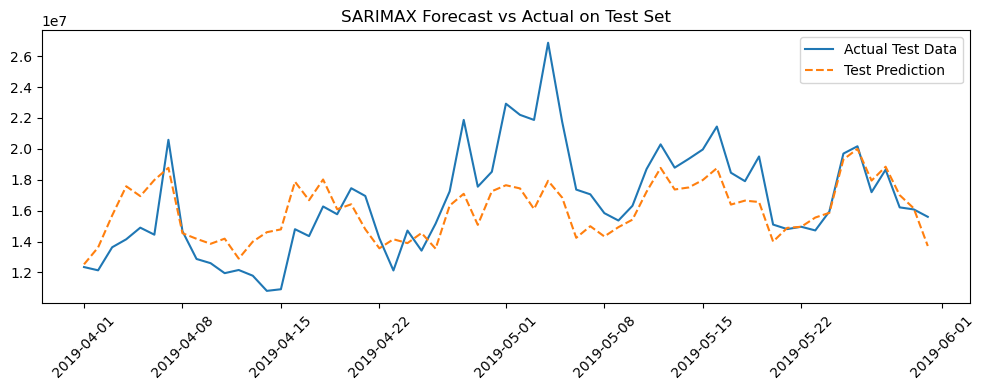

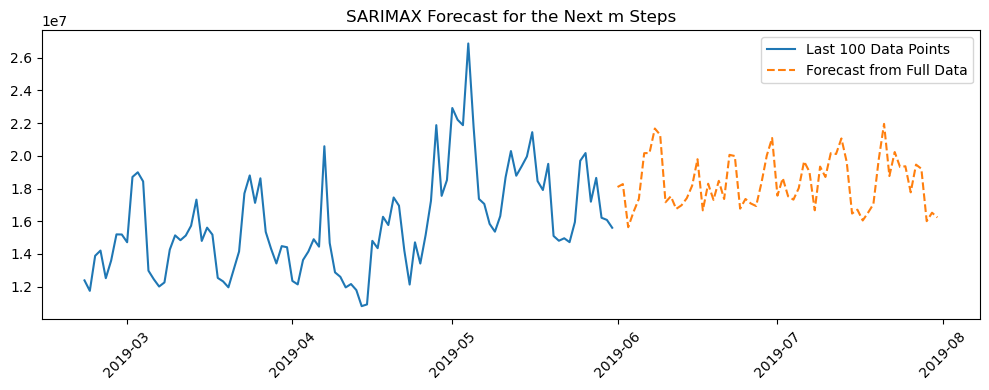

2019-06-01   18,093,252.67
2019-06-02   18,270,593.38
2019-06-03   15,635,518.95
2019-06-04   16,567,963.16
2019-06-05   17,367,053.89
                  ...     
2019-07-27   19,461,775.48
2019-07-28   19,209,469.54
2019-07-29   16,004,476.20
2019-07-30   16,521,796.26
2019-07-31   16,232,326.01
Freq: D, Name: predicted_mean, Length: 61, dtype: float64

In [109]:
sarimax_forecast(ts_co['Sales'], 61, 61,ts_co[['Holiday', 'Discounted Stores']], exog_all[['Holiday', 'Discounted Stores']])

Best MAPE on test split updated to: 0.5323

Best MAPE on test split updated to: 0.4962

Best MAPE on test split updated to: 0.1468

Best MAPE on test split updated to: 0.1458

Best MAPE on test split updated to: 0.1449

Best MAPE on test split updated to: 0.1433

Best MAPE on test split updated to: 0.1425

Best MAPE on test split updated to: 0.1420

Best MAPE on test split updated to: 0.1385

Best MAPE on test split updated to: 0.1226

Best MAPE on test split updated to: 0.1197


Best p,d,q parameters: (2, 1, 1)
Best P,D,Q parameters: (2, 1, 0)
Best MAPE on test split: 0.1197



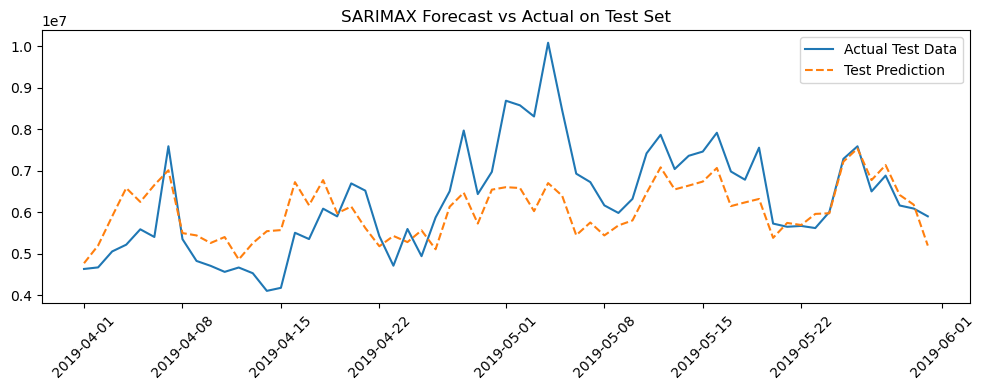

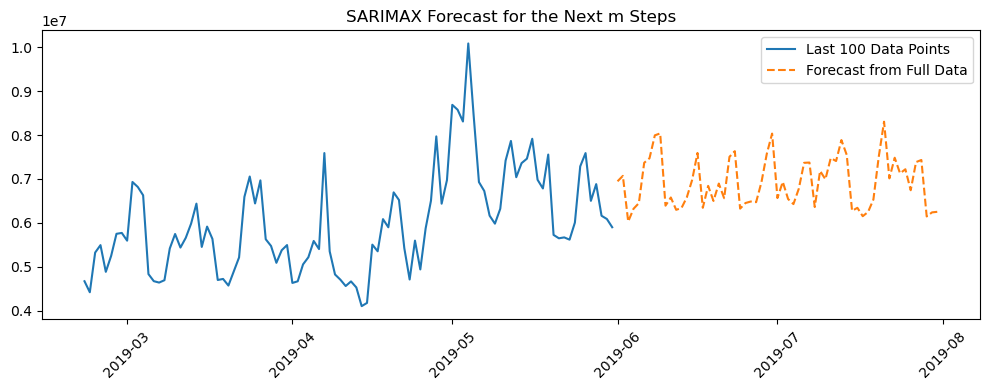

2019-06-01   6,946,683.31
2019-06-02   7,070,248.34
2019-06-03   6,030,233.72
2019-06-04   6,321,229.02
2019-06-05   6,449,083.33
                 ...     
2019-07-27   7,384,220.32
2019-07-28   7,432,108.85
2019-07-29   6,146,323.98
2019-07-30   6,239,095.38
2019-07-31   6,252,180.63
Freq: D, Name: predicted_mean, Length: 61, dtype: float64

In [110]:
sarimax_forecast(ts_r1['Sales'], 61, 61,ts_co[['Holiday', 'Discounted Stores']], exog_r1[['Holiday', 'Discounted Stores']])

Best MAPE on test split updated to: 0.5218

Best MAPE on test split updated to: 0.4872

Best MAPE on test split updated to: 0.1269

Best MAPE on test split updated to: 0.1248

Best MAPE on test split updated to: 0.1245

Best MAPE on test split updated to: 0.1190

Best MAPE on test split updated to: 0.1163

Best MAPE on test split updated to: 0.1163

Best MAPE on test split updated to: 0.1162

Best MAPE on test split updated to: 0.1154

Best MAPE on test split updated to: 0.1153

Best MAPE on test split updated to: 0.1147

Best MAPE on test split updated to: 0.1036

Best MAPE on test split updated to: 0.0988


Best p,d,q parameters: (0, 1, 2)
Best P,D,Q parameters: (2, 1, 0)
Best MAPE on test split: 0.0988



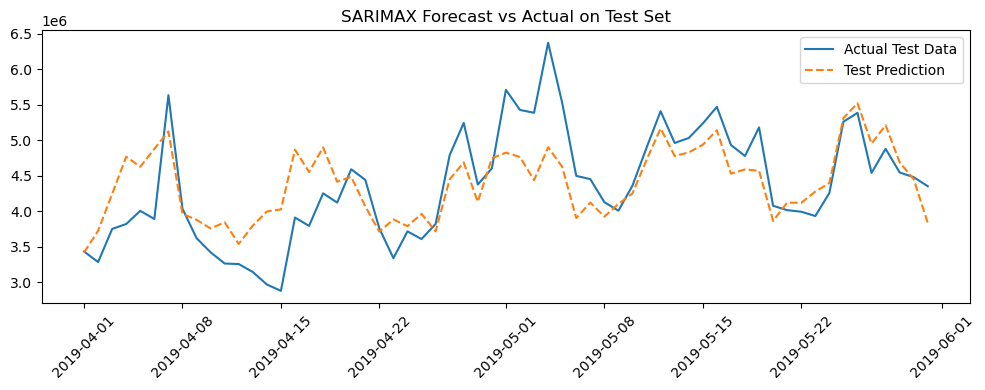

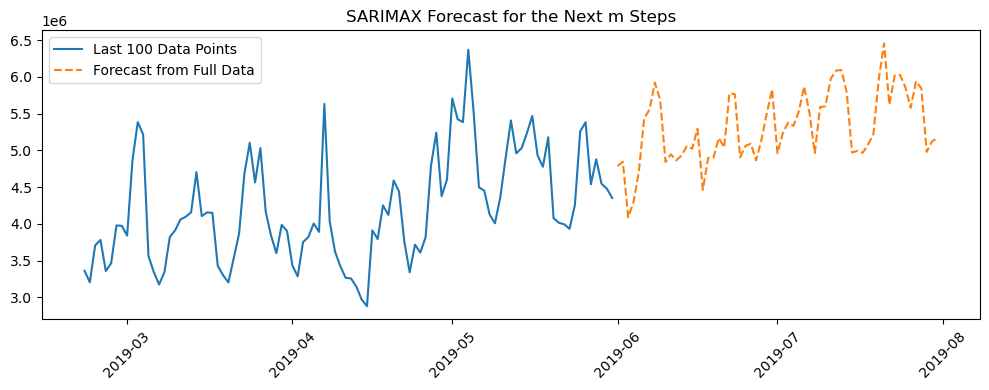

2019-06-01   4,787,346.01
2019-06-02   4,845,028.96
2019-06-03   4,087,761.67
2019-06-04   4,296,346.21
2019-06-05   4,710,589.97
                 ...     
2019-07-27   5,940,020.75
2019-07-28   5,845,808.11
2019-07-29   4,979,602.36
2019-07-30   5,121,882.44
2019-07-31   5,166,479.63
Freq: D, Name: predicted_mean, Length: 61, dtype: float64

In [111]:
sarimax_forecast(ts_r2['Sales'], 61, 61,ts_co[['Holiday', 'Discounted Stores']], exog_r2[['Holiday', 'Discounted Stores']])

Best MAPE on test split updated to: 0.5246

Best MAPE on test split updated to: 0.4898

Best MAPE on test split updated to: 0.1448

Best MAPE on test split updated to: 0.1433

Best MAPE on test split updated to: 0.1409

Best MAPE on test split updated to: 0.1392

Best MAPE on test split updated to: 0.1389

Best MAPE on test split updated to: 0.1389

Best MAPE on test split updated to: 0.1388

Best MAPE on test split updated to: 0.1383

Best MAPE on test split updated to: 0.1382

Best MAPE on test split updated to: 0.1382

Best MAPE on test split updated to: 0.1348

Best MAPE on test split updated to: 0.1338

Best MAPE on test split updated to: 0.1279

Best MAPE on test split updated to: 0.1190


Best p,d,q parameters: (0, 1, 1)
Best P,D,Q parameters: (2, 1, 0)
Best MAPE on test split: 0.1190



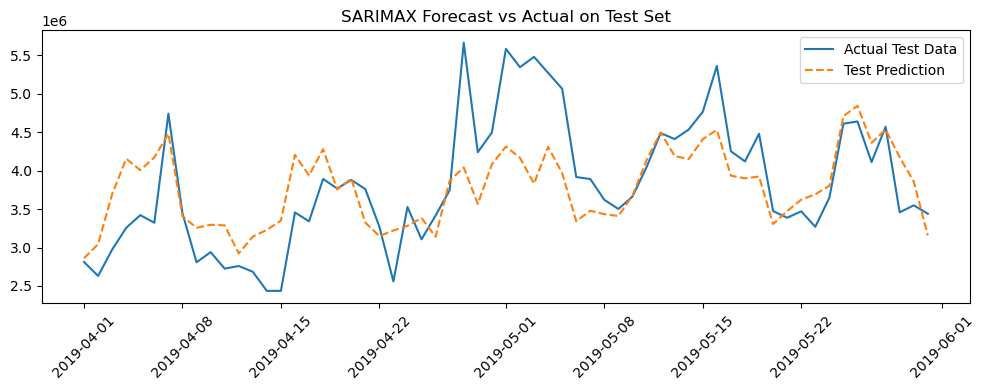

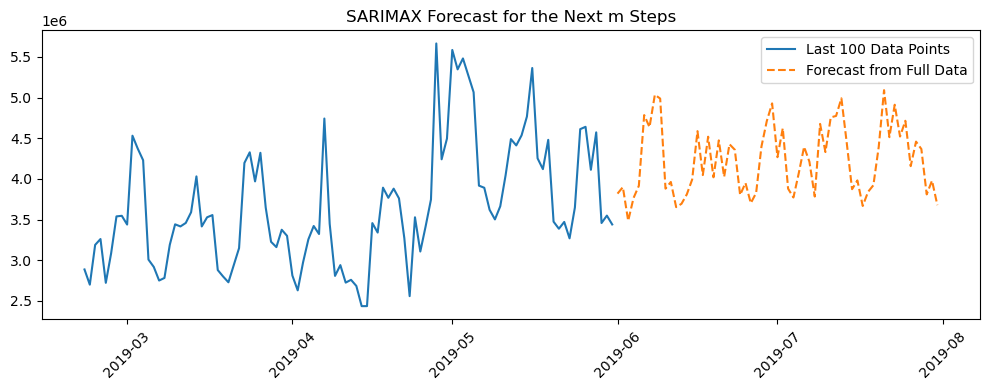

2019-06-01   3,819,240.92
2019-06-02   3,899,342.59
2019-06-03   3,485,151.82
2019-06-04   3,765,200.04
2019-06-05   3,916,036.95
                 ...     
2019-07-27   4,458,784.18
2019-07-28   4,367,319.03
2019-07-29   3,809,993.46
2019-07-30   3,979,117.96
2019-07-31   3,677,868.36
Freq: D, Name: predicted_mean, Length: 61, dtype: float64

In [112]:
sarimax_forecast(ts_r3['Sales'], 61, 61,ts_co[['Holiday', 'Discounted Stores']], exog_r3[['Holiday', 'Discounted Stores']])

Best MAPE on test split updated to: 0.5251

Best MAPE on test split updated to: 0.4933

Best MAPE on test split updated to: 0.1516

Best MAPE on test split updated to: 0.1466

Best MAPE on test split updated to: 0.1445

Best MAPE on test split updated to: 0.1348

Best MAPE on test split updated to: 0.1346

Best MAPE on test split updated to: 0.1346

Best MAPE on test split updated to: 0.1331

Best MAPE on test split updated to: 0.1326

Best MAPE on test split updated to: 0.1324

Best MAPE on test split updated to: 0.1321

Best MAPE on test split updated to: 0.1318

Best MAPE on test split updated to: 0.1317

Best MAPE on test split updated to: 0.1298

Best MAPE on test split updated to: 0.1296

Best MAPE on test split updated to: 0.1294

Best MAPE on test split updated to: 0.1277


Best p,d,q parameters: (2, 1, 2)
Best P,D,Q parameters: (1, 0, 2)
Best MAPE on test split: 0.1277



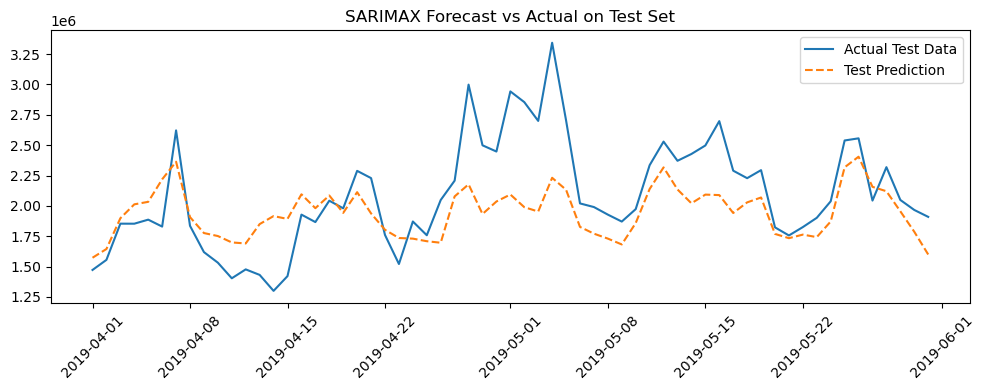

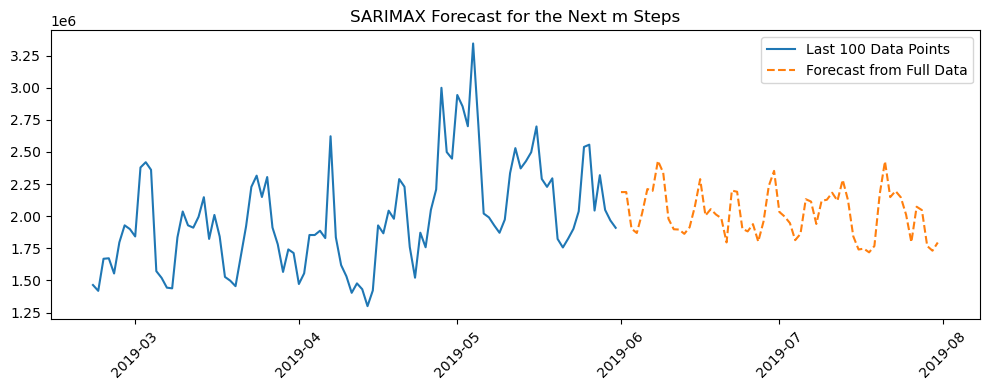

2019-06-01   2,187,132.24
2019-06-02   2,187,522.13
2019-06-03   1,902,540.49
2019-06-04   1,869,004.46
2019-06-05   2,021,483.55
                 ...     
2019-07-27   2,073,192.97
2019-07-28   2,047,125.78
2019-07-29   1,767,625.65
2019-07-30   1,731,158.98
2019-07-31   1,794,801.84
Freq: D, Name: predicted_mean, Length: 61, dtype: float64

In [113]:
sarimax_forecast(ts_r4['Sales'], 61, 61,ts_co[['Holiday', 'Discounted Stores']], exog_r4[['Holiday', 'Discounted Stores']])

<h4><font color="cyan" style="sans-serif">SARIMAX Prediction Report</font></h4>

 * The SARIMAX model was used to predict 61 datapoints from the test set to identify the best AR(p), diffencing (d) and MA(q) and Seasonal AR(P), Seasonal differencing (D) and Seasonal MA(Q) values using which the model forecasted 61 datapoints to match the duration of the inference period defined in the test dataset given i.e. from 2019-06-01 to 2019-07-31. The Seasonality was set to 7.

 * The model used the exogenous variables 'Holiday' and 'Discounted Stores'.

 *  * The model identified different best p,d,q, P,D, Q order for the Company dataset (ts_co) and Regional datasets (ts_r1, ts_r2, ts_r3, ts_r4) for regions R1, R2, R3, R4.

 * SARIMAX achieved good test MAPE for the various datasets in the range of 9.88% (For Regions R2) to 12.78% (For Region R4).

 * Company:
  * Best Test MAPE: 11.47%

*  Region 1 (R1):
  * Best Test MAPE: 11.97%

*  Region 2 (R2):
  * Best Test MAPE: 9.88%

*  Region 3 (R3):
  * Best Test MAPE: 11.90%

*  Region 4 (R4):
  * Best Test MAPE: 12.78%

<h3><font color="red" style="sans-serif">Forecasting with Facebook Prophet</font></h3>

In [114]:
logging.getLogger('prophet').setLevel(logging.WARNING)
logging.getLogger('cmdstanpy').disabled = True

def prophet_forecast(ts_data, test_size, m_steps, exog, exog_pred):
    warnings.filterwarnings("ignore")

    # Creating dataframe for Prophet
    df = ts_data.reset_index()
    df.columns = ['ds', 'y']
    df = pd.concat([df, exog.reset_index(drop=True)], axis=1)

    # Train test split
    train_df = df[:-test_size]
    test_df = df[-test_size:]

    # Fitting Prophet Model
    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, changepoint_prior_scale=1.25, seasonality_mode='additive')
    model.add_regressor('Holiday')
    model.add_regressor('Discounted Stores')
    model.add_seasonality(name='monthly', period=30.5, fourier_order=10)
    #model.add_seasonality(name='14day', period=14, fourier_order=5)
    model.fit(train_df)

    # Create dataframe for test
    future_test = test_df[['ds', 'Holiday', 'Discounted Stores']]
    forecast_test = model.predict(future_test)

    # Compute MAPE
    test_mape = mape(test_df['y'], forecast_test['yhat'])
    print(f"\nProphet MAPE on test split: {test_mape:.4f}")

    # Plot Test Prediction vs Actual
    plt.figure(figsize=(10, 4))
    plt.plot(test_df['ds'], test_df['y'], label='Actual Test Data')
    plt.plot(test_df['ds'], forecast_test['yhat'], label='Test Prediction', linestyle='--')
    plt.title('Prophet Forecast vs Actual on Test Set')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Forecast Future m Steps using full data
    full_df = df.copy()
    model_full = Prophet(yearly_seasonality=True, weekly_seasonality=True, changepoint_prior_scale=1.25, seasonality_mode='additive')
    model_full.add_regressor('Holiday')
    model_full.add_regressor('Discounted Stores')
    model_full.add_seasonality(name='monthly', period=30.5, fourier_order=5)
    #model_full.add_seasonality(name='14day', period=14, fourier_order=5)
    model_full.fit(full_df)

    # Prepare future df (including exog_pred)
    future_forecast = pd.concat([
        full_df[['ds', 'Holiday', 'Discounted Stores']],
        exog_pred.reset_index(drop=True)
    ], axis=0).tail(m_steps)

    future_dates = pd.date_range(start=ts_data.index[-1] + pd.Timedelta(days=1), periods=m_steps, freq='D')
    future_forecast['ds'] = future_dates
    forecast_future = model_full.predict(future_forecast)

    # Step 6: Plot Full Forecast
    plt.figure(figsize=(10, 4))
    plt.plot(ts_data.index[-100:], ts_data[-100:], label='Last 100 Data Points')
    plt.plot(future_dates, forecast_future['yhat'], label='Forecast from Full Data', linestyle='--')
    plt.title('Prophet Forecast for the Next m Steps')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return forecast_future[['ds', 'yhat']], round(test_mape,4)



Prophet MAPE on test split: 0.1017


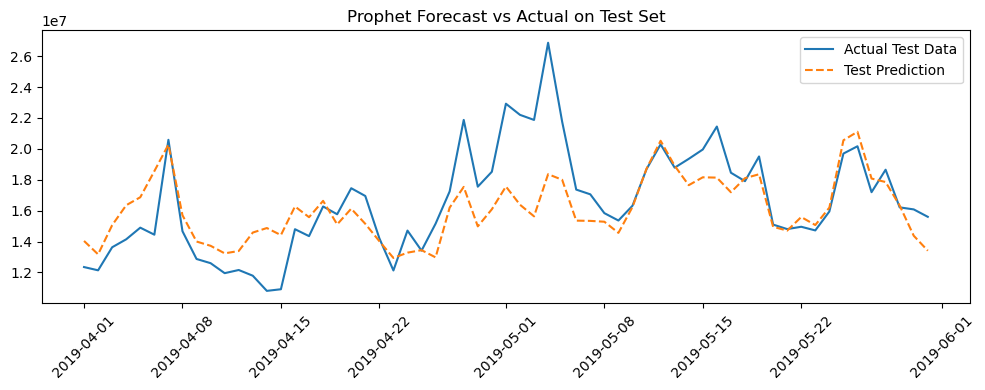

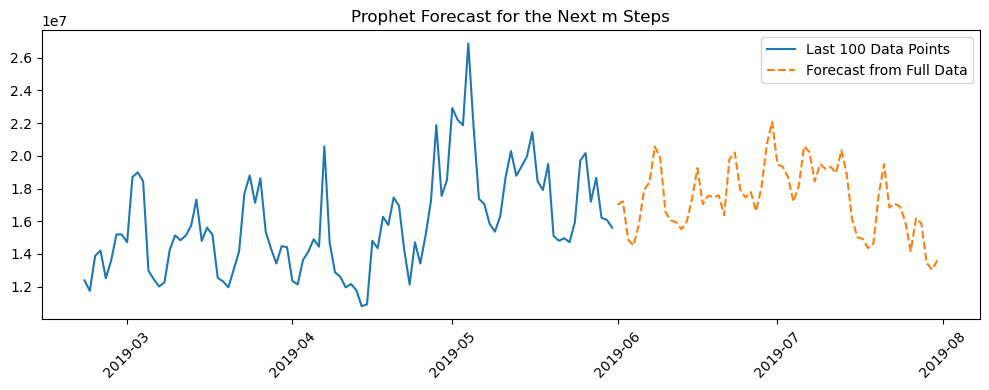

(           ds          yhat
 0  2019-06-01 16,999,971.94
 1  2019-06-02 17,215,135.57
 2  2019-06-03 14,873,605.18
 3  2019-06-04 14,512,159.40
 4  2019-06-05 15,797,299.18
 ..        ...           ...
 56 2019-07-27 16,168,375.41
 57 2019-07-28 15,864,956.63
 58 2019-07-29 13,445,487.76
 59 2019-07-30 13,046,597.34
 60 2019-07-31 13,607,182.18
 
 [61 rows x 2 columns],
 0.1017)

In [115]:
prophet_forecast(ts_co['Sales'], 61, 61,ts_co[['Holiday', 'Discounted Stores']], exog_all[['Holiday', 'Discounted Stores']])


Prophet MAPE on test split: 0.1102


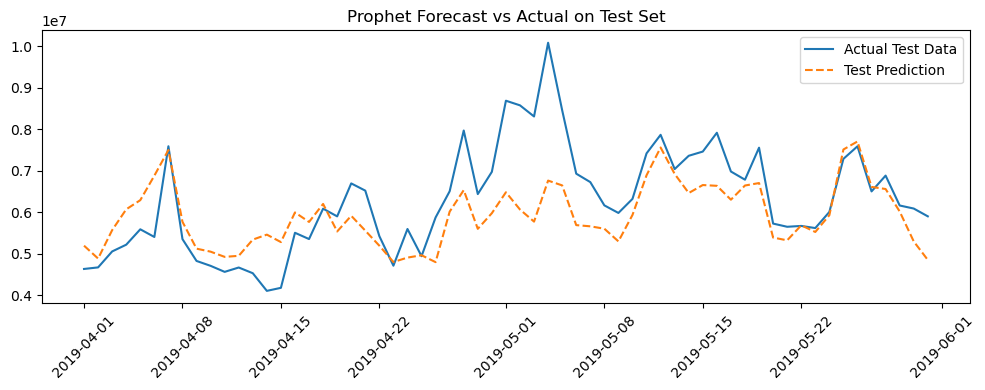

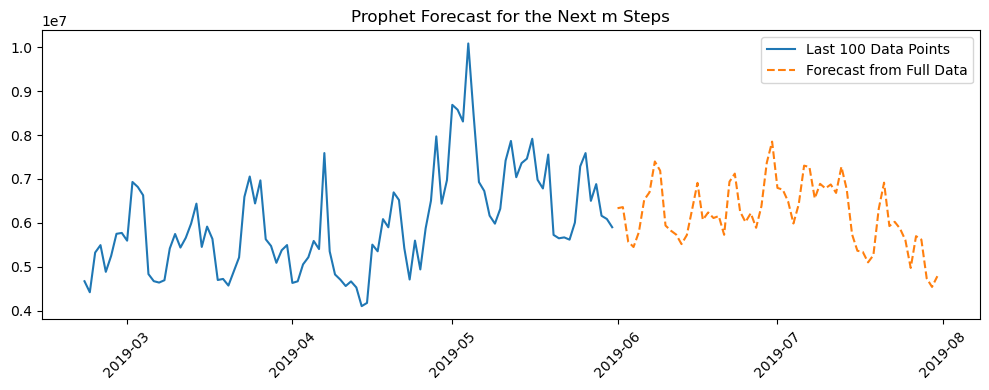

(           ds         yhat
 0  2019-06-01 6,333,643.37
 1  2019-06-02 6,359,050.77
 2  2019-06-03 5,572,688.01
 3  2019-06-04 5,450,777.68
 4  2019-06-05 5,787,600.12
 ..        ...          ...
 56 2019-07-27 5,697,171.40
 57 2019-07-28 5,619,236.19
 58 2019-07-29 4,736,290.78
 59 2019-07-30 4,541,939.32
 60 2019-07-31 4,785,992.45
 
 [61 rows x 2 columns],
 0.1102)

In [116]:
prophet_forecast(ts_r1['Sales'], 61, 61,ts_co[['Holiday', 'Discounted Stores']], exog_r1[['Holiday', 'Discounted Stores']])


Prophet MAPE on test split: 0.0890


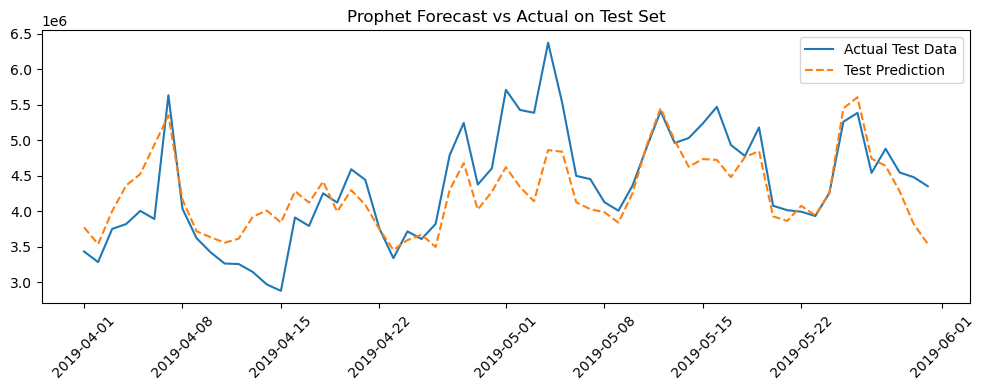

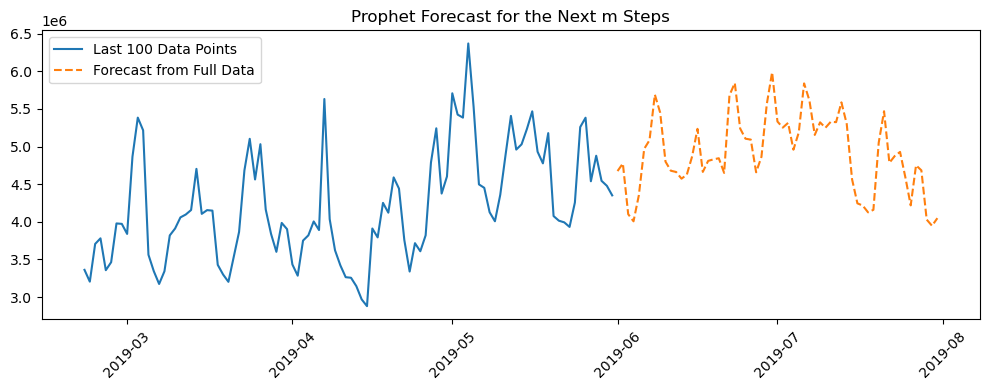

(           ds         yhat
 0  2019-06-01 4,674,261.92
 1  2019-06-02 4,775,158.18
 2  2019-06-03 4,101,830.92
 3  2019-06-04 4,006,425.00
 4  2019-06-05 4,353,047.36
 ..        ...          ...
 56 2019-07-27 4,751,216.92
 57 2019-07-28 4,684,275.46
 58 2019-07-29 4,029,220.20
 59 2019-07-30 3,946,934.08
 60 2019-07-31 4,048,438.84
 
 [61 rows x 2 columns],
 0.089)

In [117]:
prophet_forecast(ts_r2['Sales'], 61, 61,ts_co[['Holiday', 'Discounted Stores']], exog_r2[['Holiday', 'Discounted Stores']])


Prophet MAPE on test split: 0.1142


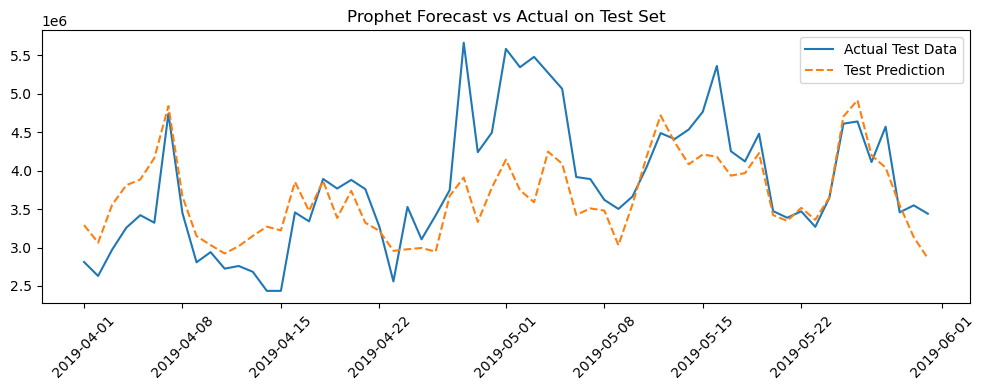

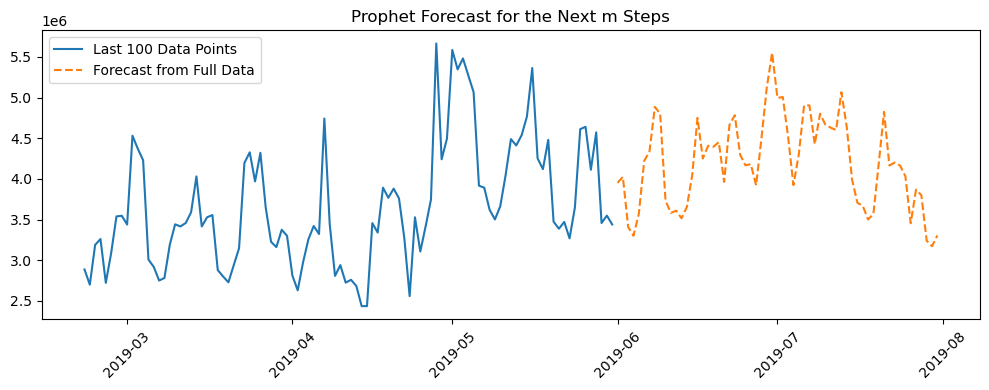

(           ds         yhat
 0  2019-06-01 3,951,686.04
 1  2019-06-02 4,025,397.60
 2  2019-06-03 3,407,926.62
 3  2019-06-04 3,301,333.90
 4  2019-06-05 3,573,585.95
 ..        ...          ...
 56 2019-07-27 3,868,249.68
 57 2019-07-28 3,800,162.45
 58 2019-07-29 3,239,558.24
 59 2019-07-30 3,173,323.20
 60 2019-07-31 3,304,954.24
 
 [61 rows x 2 columns],
 0.1142)

In [118]:
prophet_forecast(ts_r3['Sales'], 61, 61,ts_co[['Holiday', 'Discounted Stores']], exog_r3[['Holiday', 'Discounted Stores']])


Prophet MAPE on test split: 0.1265


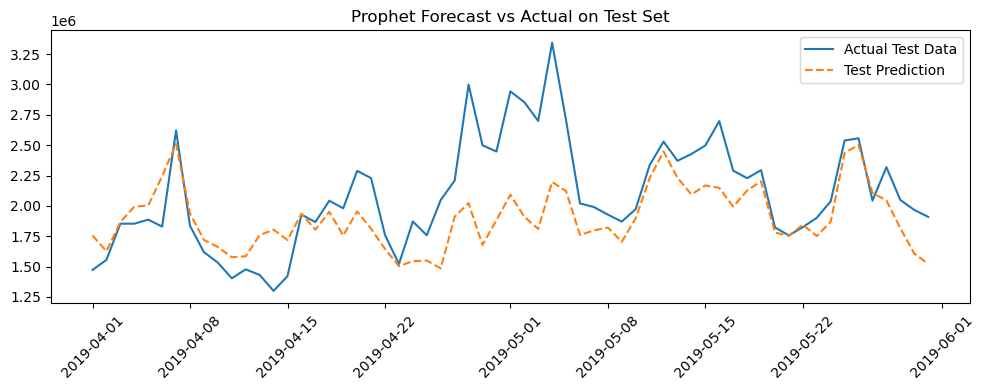

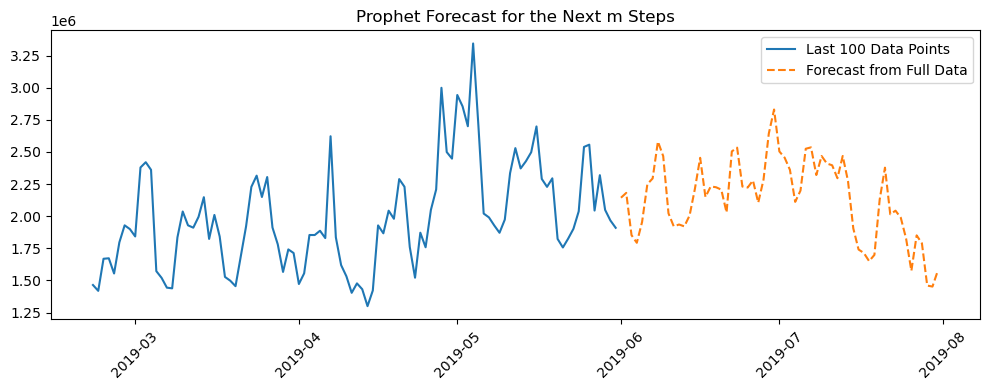

(           ds         yhat
 0  2019-06-01 2,143,463.07
 1  2019-06-02 2,181,118.22
 2  2019-06-03 1,852,244.26
 3  2019-06-04 1,792,696.18
 4  2019-06-05 1,954,651.37
 ..        ...          ...
 56 2019-07-27 1,850,337.28
 57 2019-07-28 1,788,502.81
 58 2019-07-29 1,459,790.70
 59 2019-07-30 1,452,006.51
 60 2019-07-31 1,574,087.44
 
 [61 rows x 2 columns],
 0.1265)

In [119]:
prophet_forecast(ts_r4['Sales'], 61, 61,ts_co[['Holiday', 'Discounted Stores']], exog_r4[['Holiday', 'Discounted Stores']])

<h3><font color="red" style="sans-serif">Storing Prophet Forecasts and MAPEs for App</font></h3>

In [120]:
ts_data.keys()

dict_keys(['Company', 'Region 1', 'Region 2', 'Region 3', 'Region 4'])

In [121]:
exog_data = {'Company': exog_all, 'Region 1': exog_r1, 'Region 2': exog_r2, 'Region 3': exog_r3, 'Region 4': exog_r4}

In [122]:
data_list = ['Company', 'Region 1', 'Region 2', 'Region 3', 'Region 4']


Prophet MAPE on test split: 0.1017


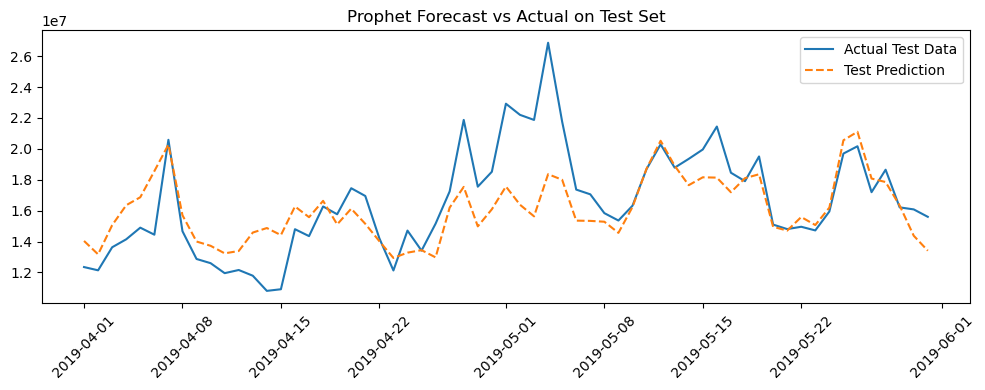

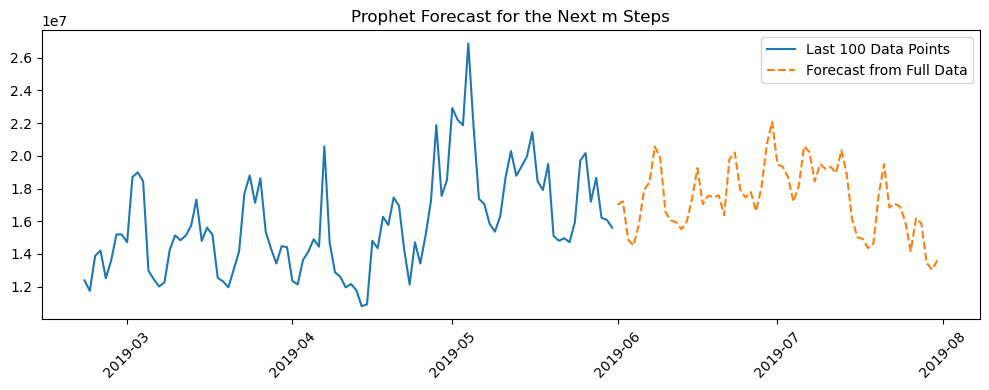


Prophet MAPE on test split: 0.1620


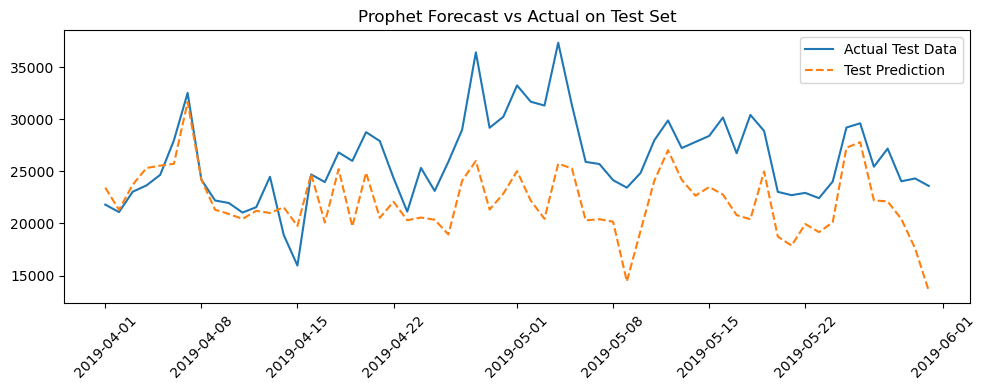

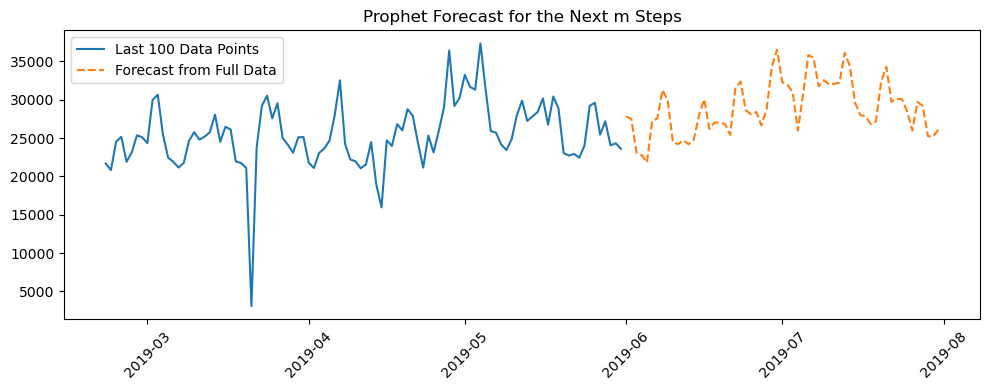


Prophet MAPE on test split: 0.1067


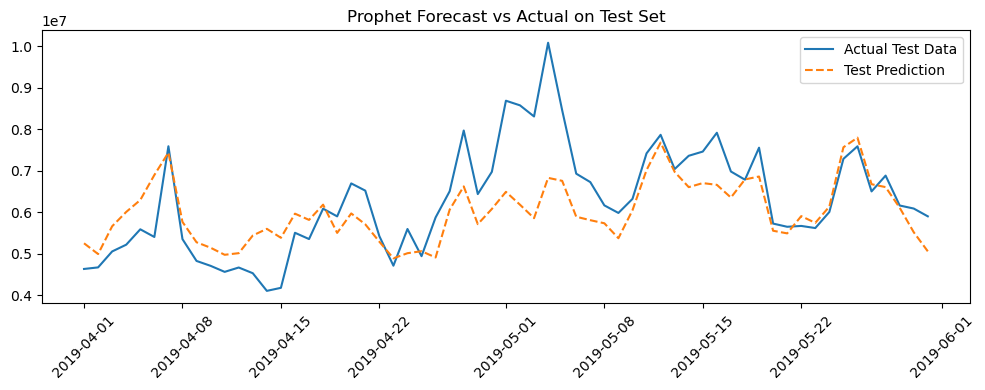

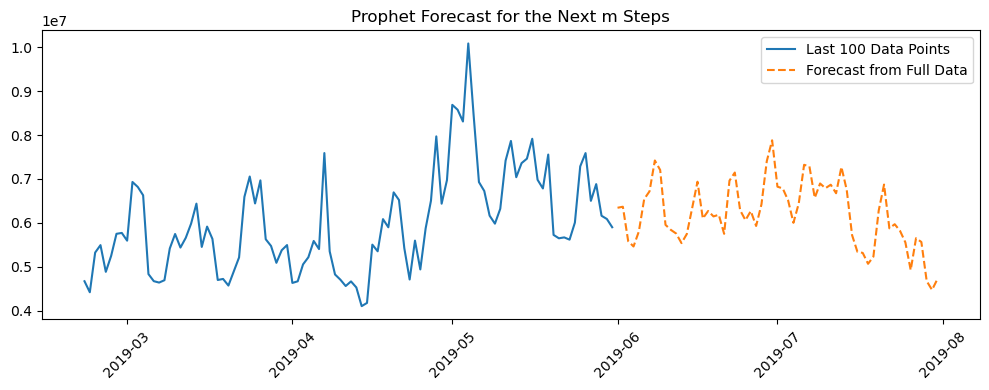


Prophet MAPE on test split: 0.1739


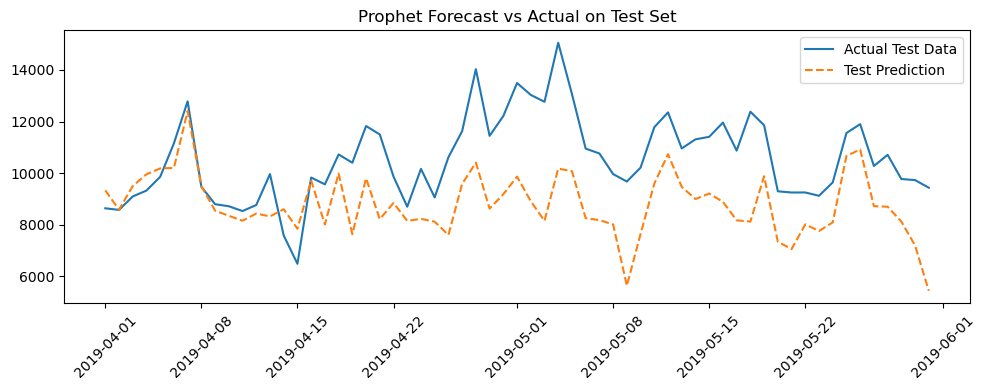

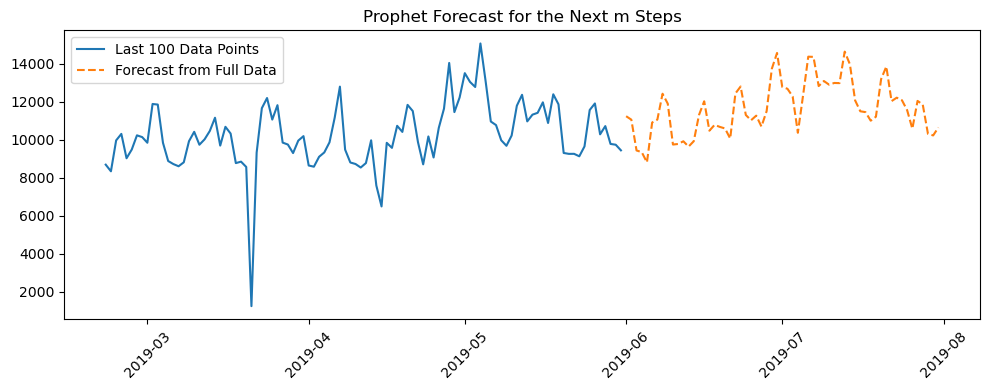


Prophet MAPE on test split: 0.0851


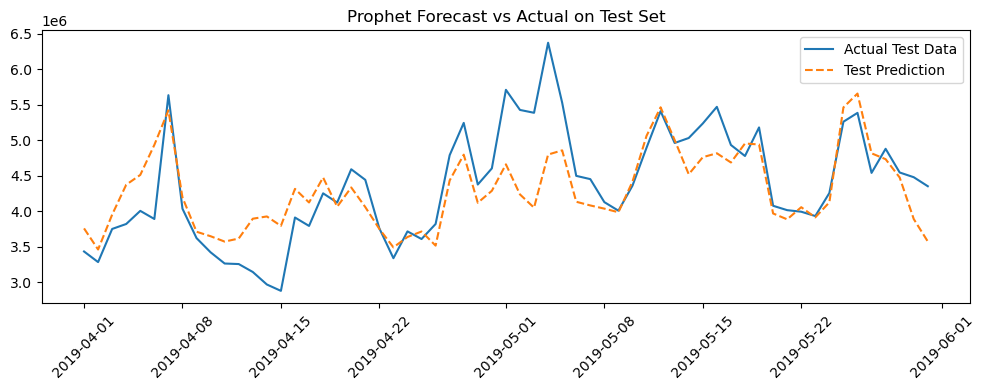

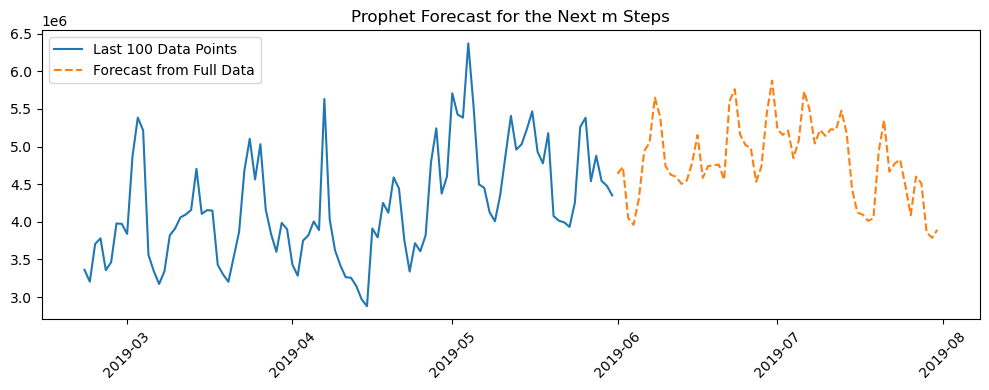


Prophet MAPE on test split: 0.1366


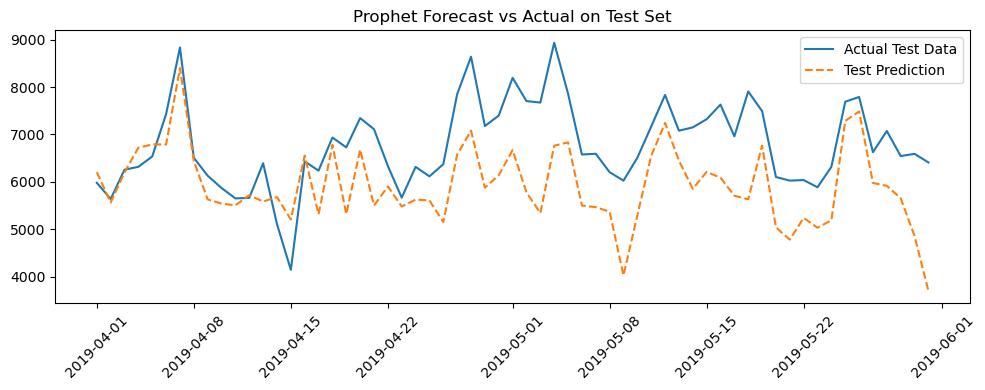

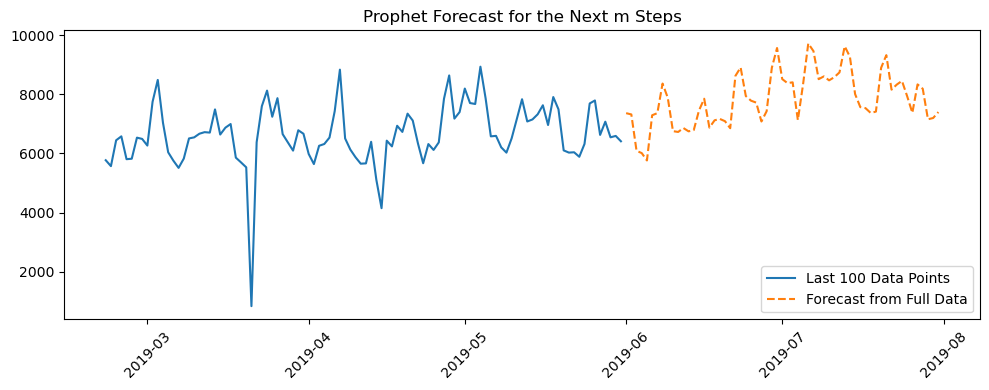


Prophet MAPE on test split: 0.1183


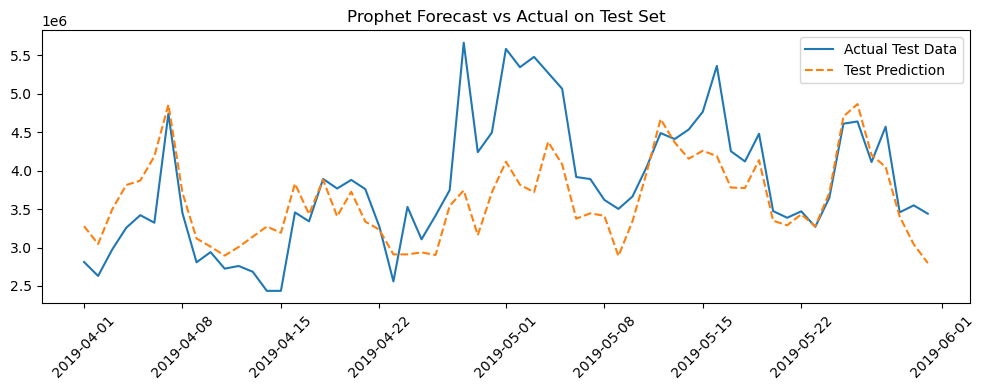

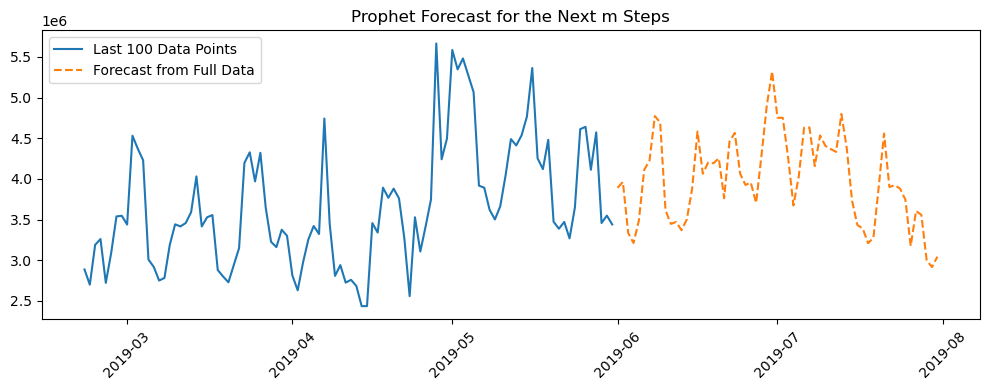


Prophet MAPE on test split: 0.1589


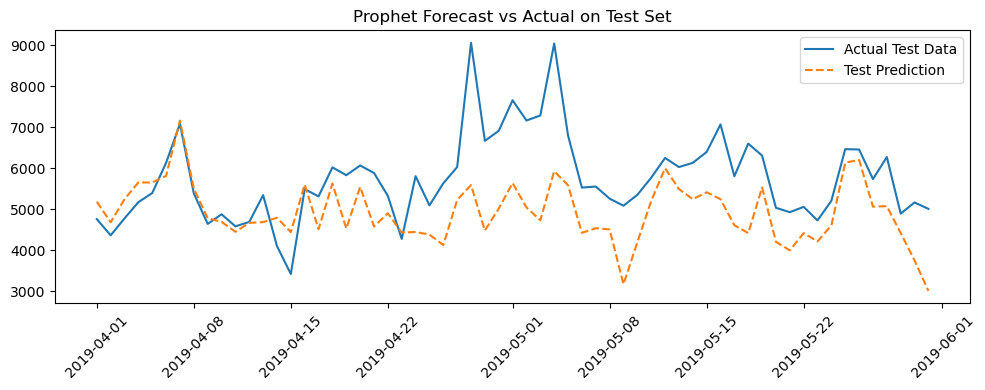

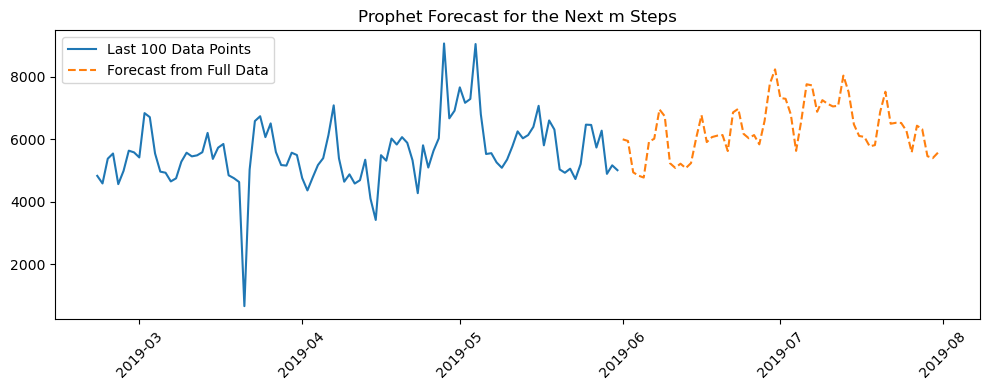


Prophet MAPE on test split: 0.1302


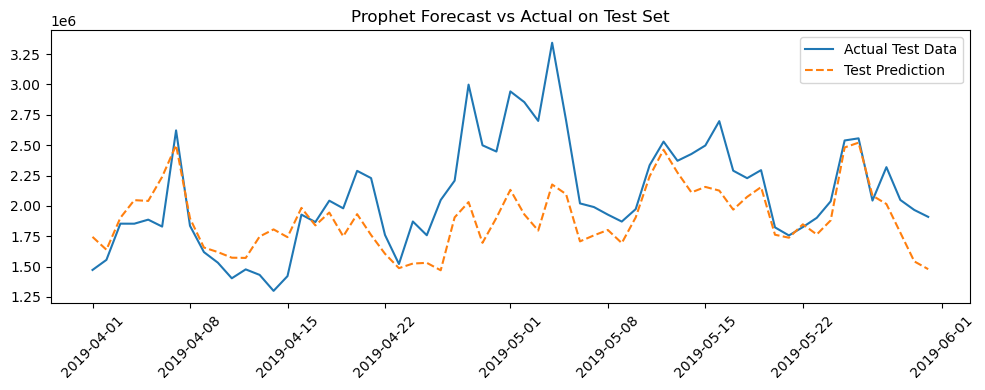

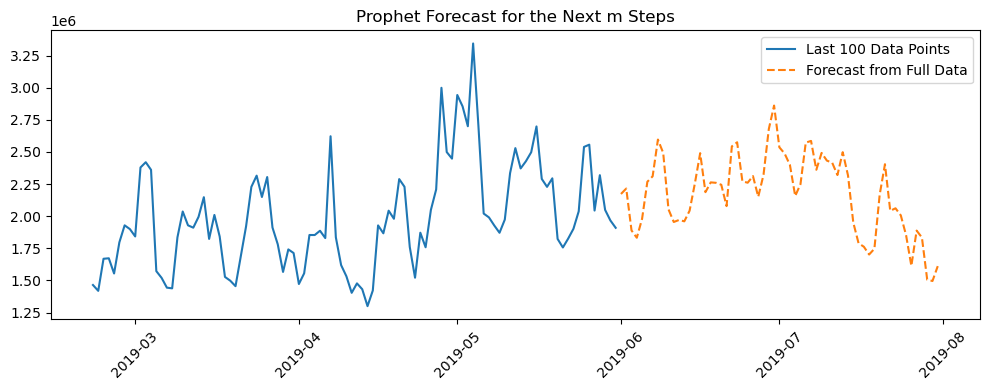


Prophet MAPE on test split: 0.1876


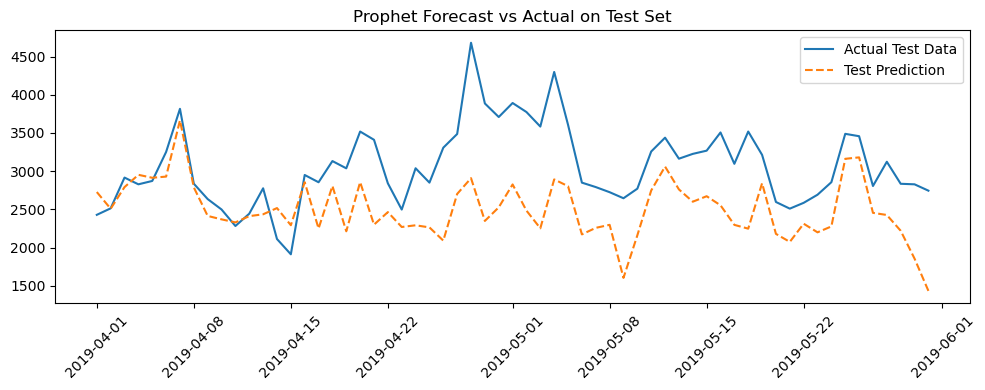

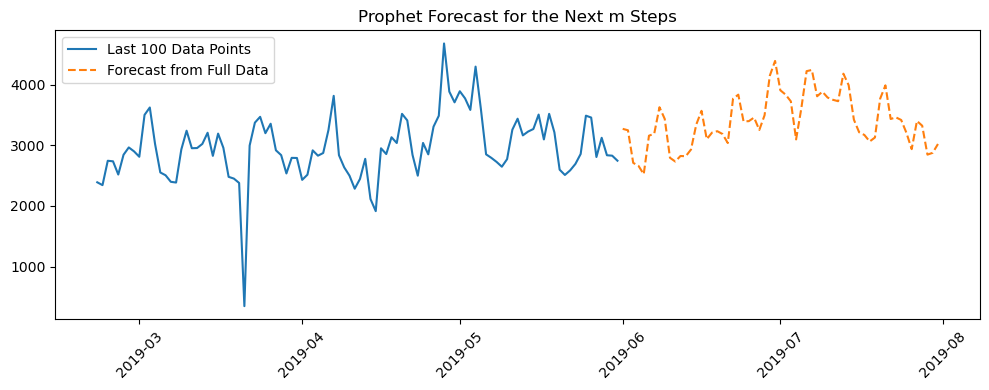

In [123]:
# Storing Prophet Predictions and MAPEs

prophet_forecasts_sales = pd.DataFrame({'Date': exog_all.index})
prophet_forecasts_orders = pd.DataFrame({'Date': exog_all.index})

prophet_mapes = {}

for data_name in data_list:
    prophet_mapes[data_name] = {}

    # Forecast Sales
    forecast_sales, mape_sales = prophet_forecast(
        ts_data[data_name]['Sales'], 61, 61,
        ts_data[data_name][['Holiday', 'Discounted Stores']],
        exog_data[data_name][['Holiday', 'Discounted Stores']]
    )
    prophet_forecasts_sales[f'{data_name}_Sales'] = forecast_sales['yhat'].values
    prophet_mapes[data_name]['sales_mape'] = mape_sales

    # Forecast Orders
    forecast_orders, mape_orders = prophet_forecast(
        ts_data[data_name]['Orders'], 61, 61,
        ts_data[data_name][['Holiday', 'Discounted Stores']],
        exog_data[data_name][['Holiday', 'Discounted Stores']]
    )
    prophet_forecasts_orders[f'{data_name}_Orders'] = forecast_orders['yhat'].values
    prophet_mapes[data_name]['orders_mape'] = mape_orders

In [124]:
prophet_forecasts_sales

,Date,Company_Sales,Region 1_Sales,Region 2_Sales,Region 3_Sales,Region 4_Sales
0,2019-06-01,"16,999,971.94","6,344,165.50","4,638,549.53","3,890,828.83","2,172,581.25"
1,2019-06-02,"17,215,135.57","6,367,785.09","4,730,248.62","3,963,066.85","2,214,829.25"
2,2019-06-03,"14,873,605.18","5,583,489.03","4,051,517.65","3,336,290.94","1,888,901.31"
3,2019-06-04,"14,512,159.40","5,462,480.51","3,959,466.55","3,212,132.74","1,831,968.74"
4,2019-06-05,"15,797,299.18","5,804,183.00","4,305,216.46","3,486,814.70","1,979,626.04"
...,...,...,...,...,...,...
56,2019-07-27,"16,168,375.41","5,651,152.80","4,599,818.42","3,606,603.05","1,887,565.31"
57,2019-07-28,"15,864,956.63","5,564,724.84","4,512,236.77","3,557,932.96","1,833,549.57"
58,2019-07-29,"13,445,487.76","4,675,109.71","3,856,626.71","2,997,310.64","1,505,704.18"
59,2019-07-30,"13,046,597.34","4,473,812.96","3,788,180.61","2,916,577.47","1,495,371.71"


In [125]:
prophet_forecasts_orders

,Date,Company_Orders,Region 1_Orders,Region 2_Orders,Region 3_Orders,Region 4_Orders
0,2019-06-01,"27,807.14","11,228.91","7,362.80","5,999.56","3,271.45"
1,2019-06-02,"27,510.20","11,047.51","7,319.75","5,947.78","3,248.08"
2,2019-06-03,"23,087.83","9,427.14","6,090.37","4,943.14","2,710.18"
3,2019-06-04,"22,765.31","9,338.54","6,010.57","4,838.46","2,661.61"
4,2019-06-05,"21,803.53","8,800.34","5,762.37","4,776.34","2,523.94"
...,...,...,...,...,...,...
56,2019-07-27,"29,719.28","12,033.71","8,335.79","6,434.92","3,401.71"
57,2019-07-28,"29,173.20","11,842.11","8,187.84","6,326.58","3,323.36"
58,2019-07-29,"25,245.94","10,301.07","7,155.91","5,460.05","2,846.21"
59,2019-07-30,"25,190.73","10,218.32","7,198.90","5,398.10","2,876.35"


In [126]:
prophet_mapes = pd.DataFrame(prophet_mapes)
prophet_mapes

,Company,Region 1,Region 2,Region 3,Region 4
sales_mape,0.10,0.11,0.09,0.12,0.13
orders_mape,0.16,0.17,0.14,0.16,0.19


In [127]:
prophet_forecasts_sales.to_csv('prophet_forecasts_sales.csv', index=False)
prophet_forecasts_orders.to_csv('prophet_forecasts_orders.csv', index=False)

<h3><font color="red" style="sans-serif">Prophet Forecasts have higher MAPE for shorter horizon</font></h3>

In [128]:
exog_all.index[:30]

DatetimeIndex(['2019-06-01', '2019-06-02', '2019-06-03', '2019-06-04',
               '2019-06-05', '2019-06-06', '2019-06-07', '2019-06-08',
               '2019-06-09', '2019-06-10', '2019-06-11', '2019-06-12',
               '2019-06-13', '2019-06-14', '2019-06-15', '2019-06-16',
               '2019-06-17', '2019-06-18', '2019-06-19', '2019-06-20',
               '2019-06-21', '2019-06-22', '2019-06-23', '2019-06-24',
               '2019-06-25', '2019-06-26', '2019-06-27', '2019-06-28',
               '2019-06-29', '2019-06-30'],
              dtype='datetime64[ns]', name='Date', freq='D')


Prophet MAPE on test split: 0.2181


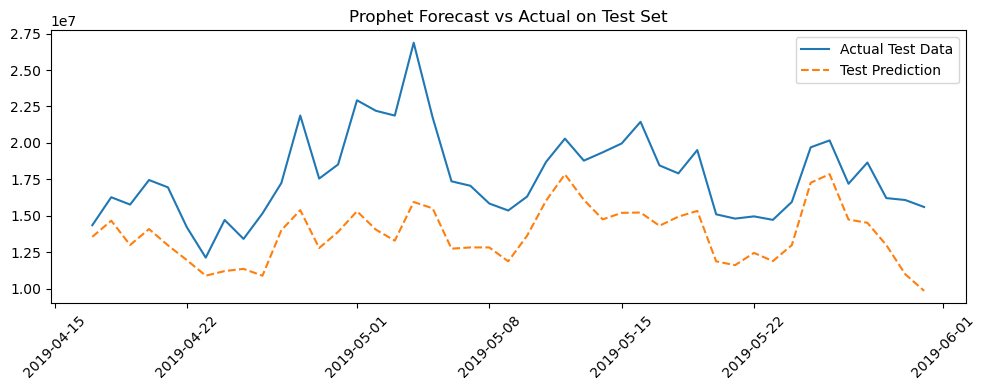

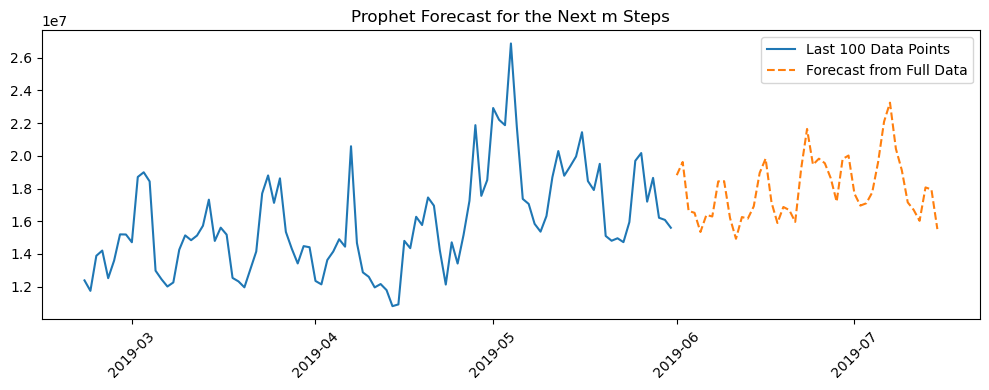


Prophet MAPE on test split: 0.1992


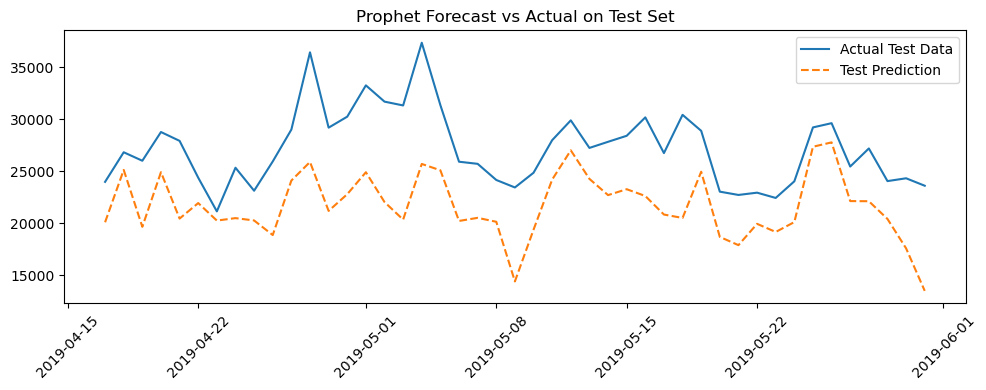

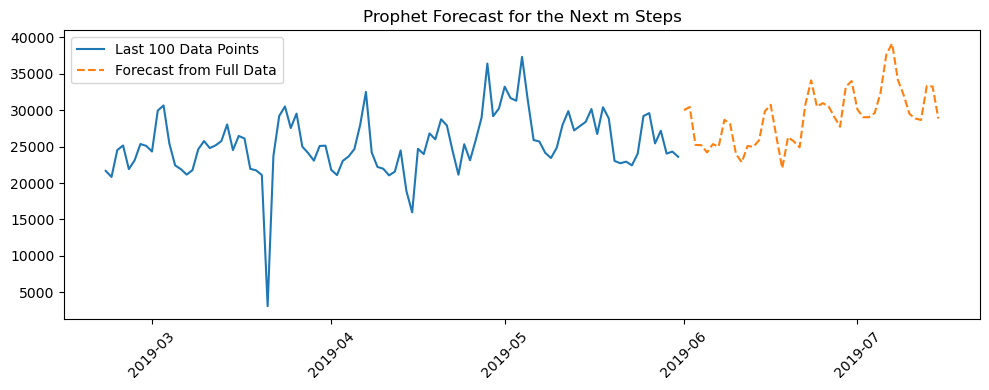


Prophet MAPE on test split: 0.2225


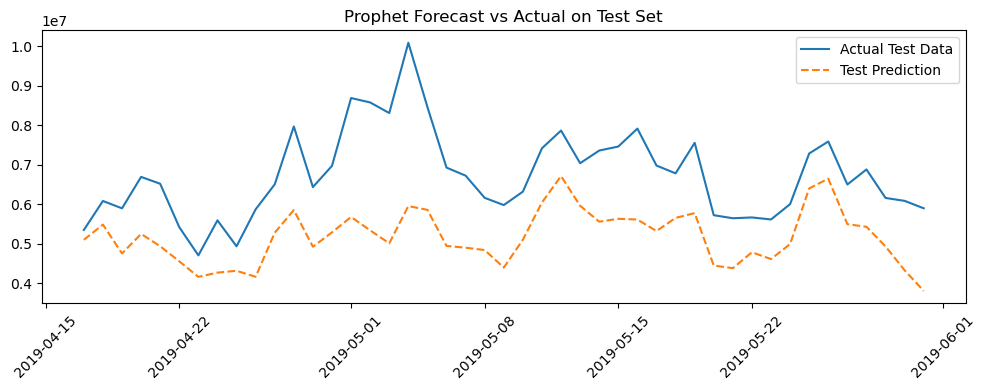

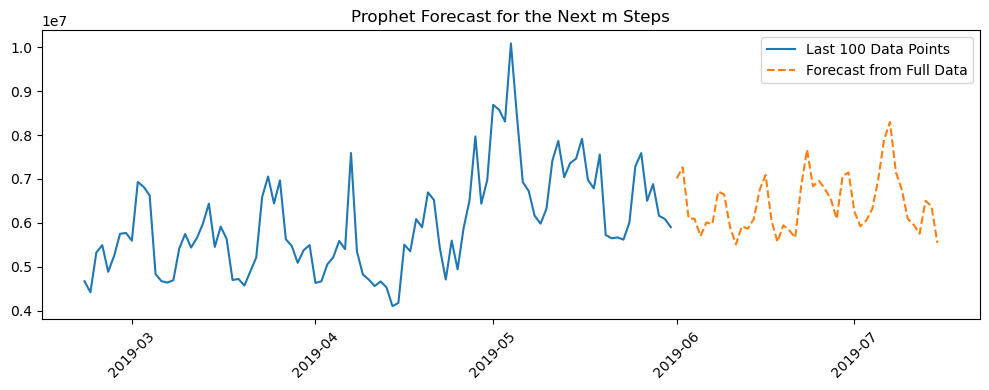


Prophet MAPE on test split: 0.2110


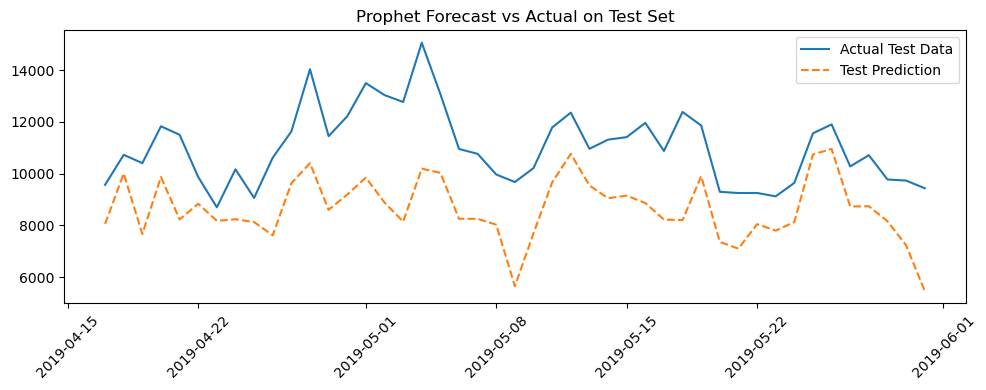

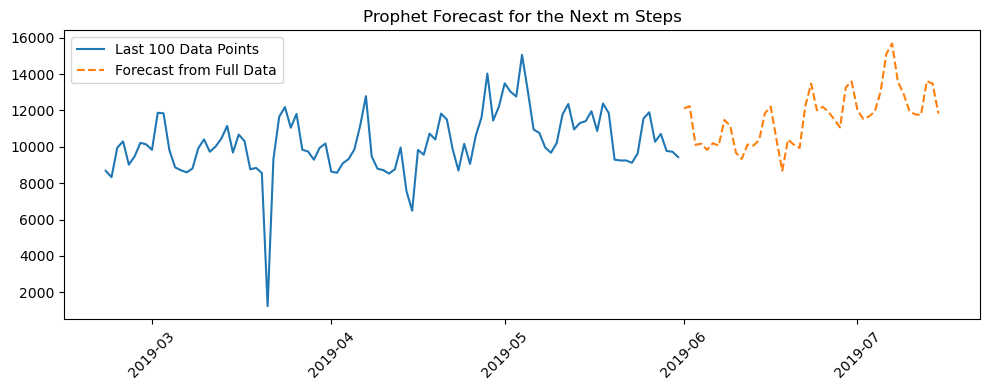


Prophet MAPE on test split: 0.1775


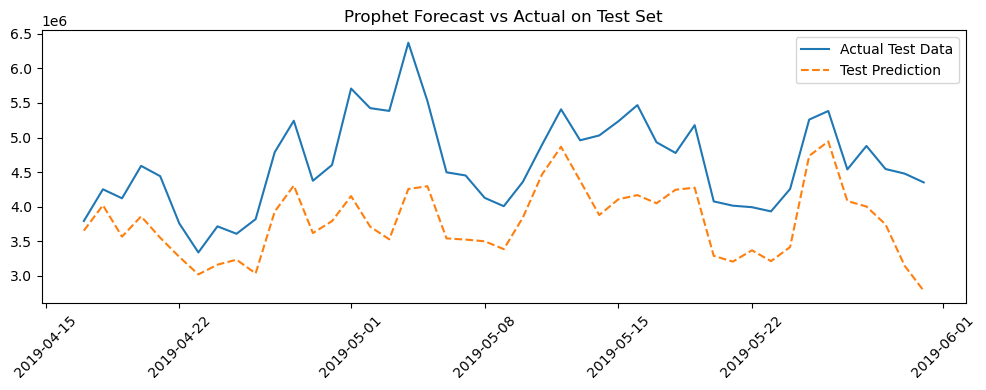

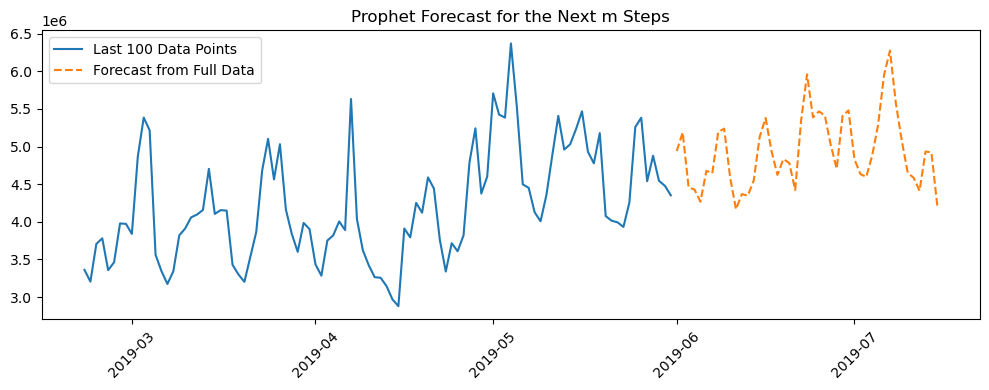


Prophet MAPE on test split: 0.1660


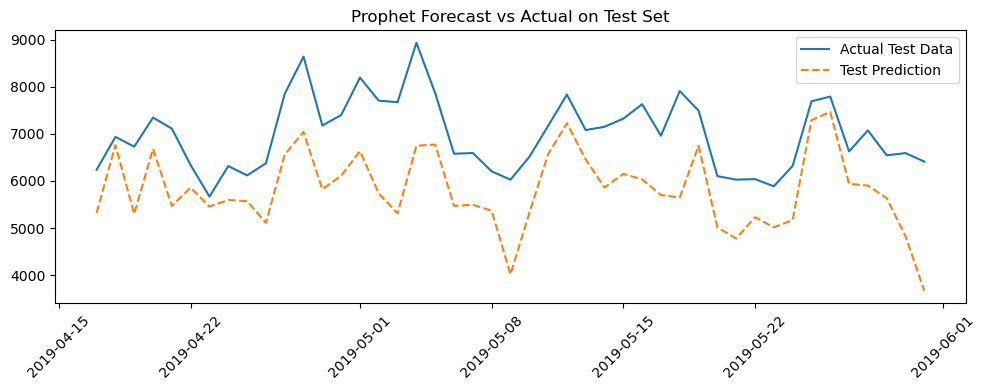

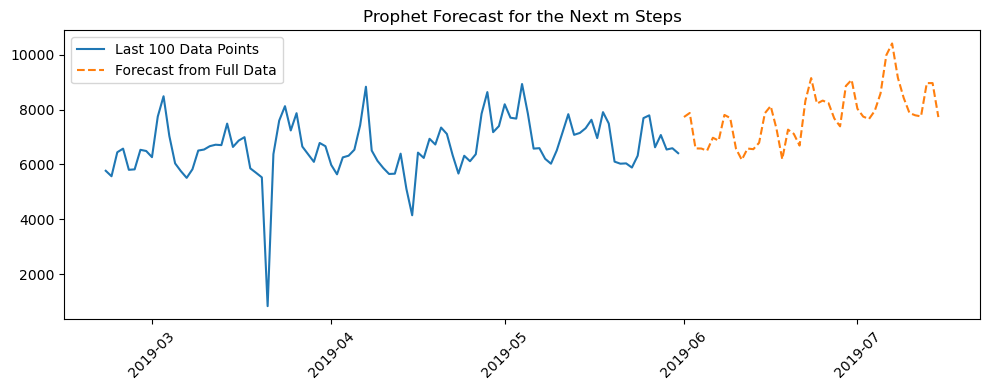


Prophet MAPE on test split: 0.2120


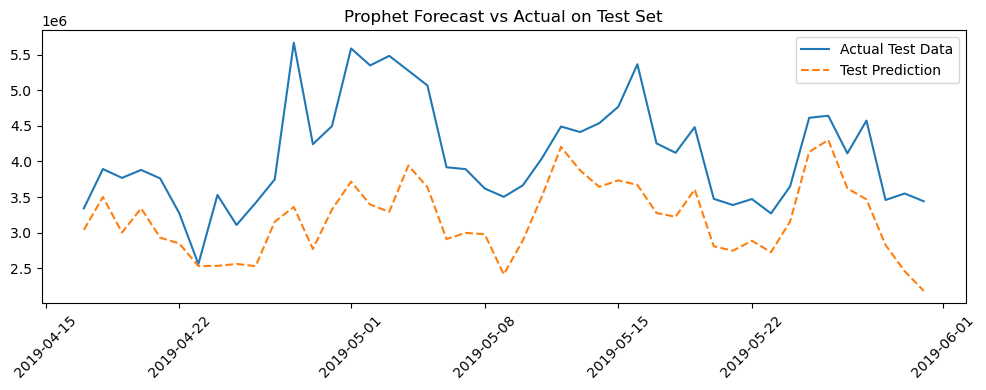

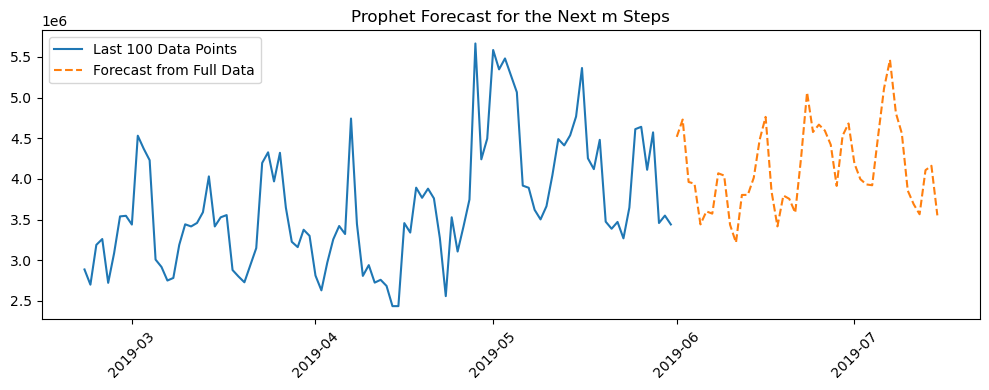


Prophet MAPE on test split: 0.2181


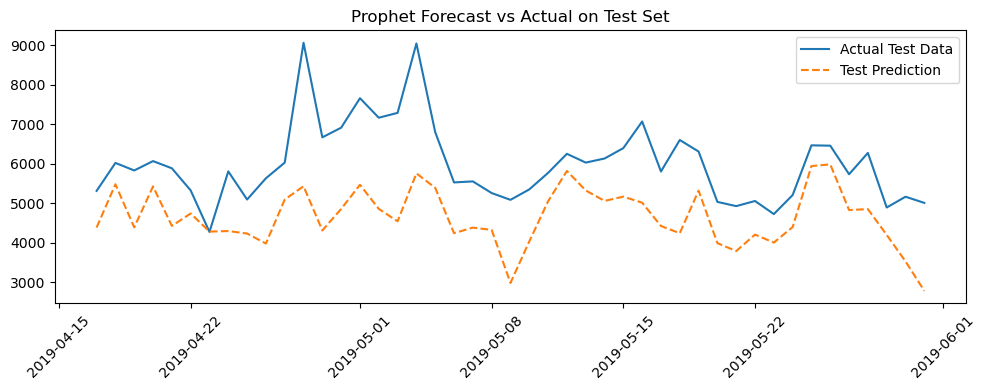

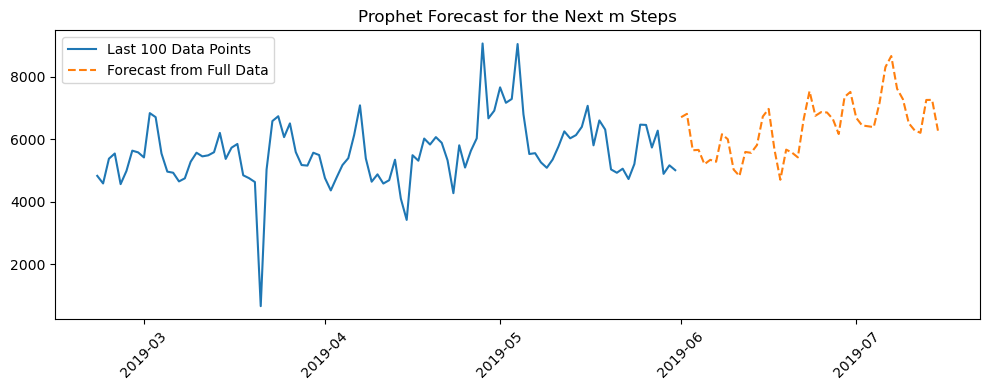


Prophet MAPE on test split: 0.2305


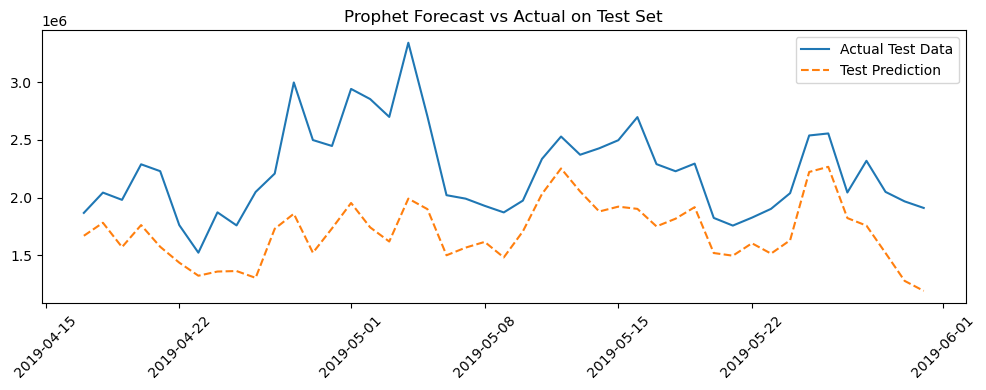

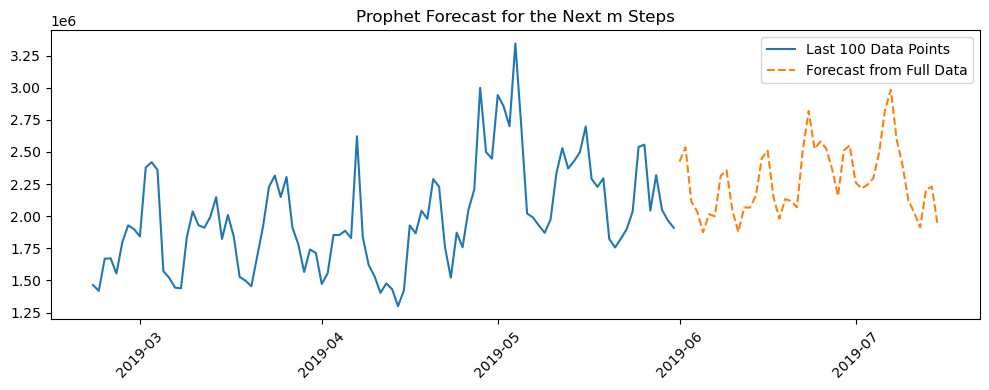


Prophet MAPE on test split: 0.2289


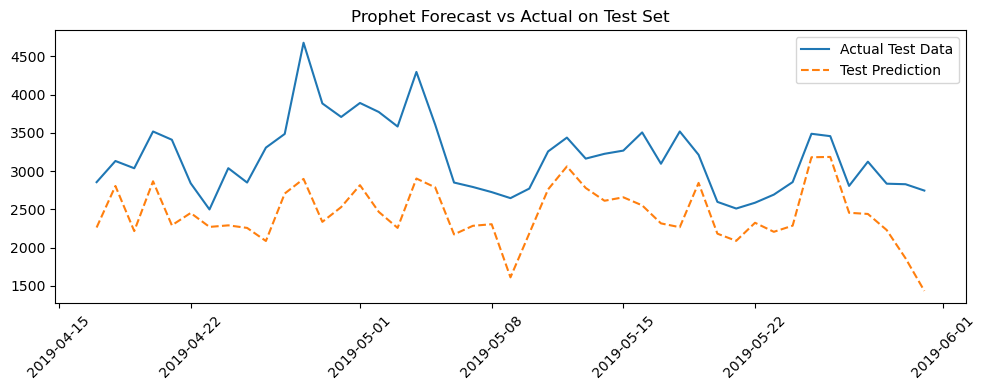

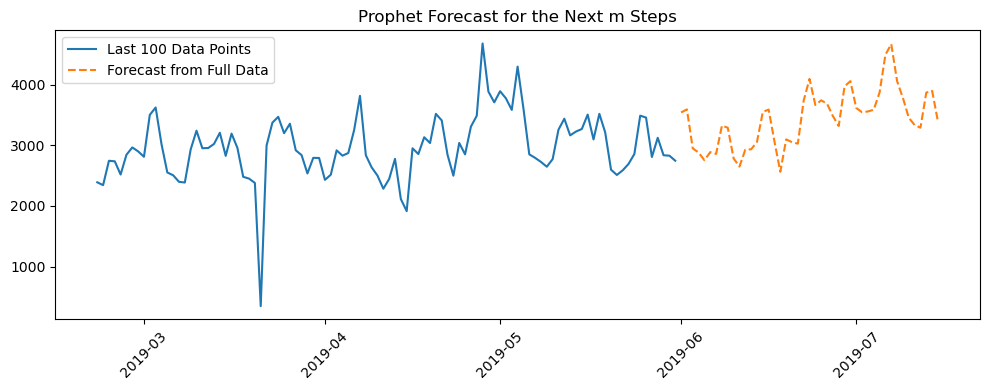

In [129]:
# Prophet Forecast and MAPEs for 45 days/steps

prophet_forecasts_sales_test = pd.DataFrame({'Date': exog_all.index[:45]})
prophet_forecasts_orders_test = pd.DataFrame({'Date': exog_all.index[:45]})

prophet_mapes_test = {}

for data_name in data_list:
    prophet_mapes_test[data_name] = {}

    # Forecast Sales
    forecast_sales, mape_sales = prophet_forecast(
        ts_data[data_name]['Sales'], 45, 45,    #Forecast horizon (m_steps) reduced to 30 days
        ts_data[data_name][['Holiday', 'Discounted Stores']],
        exog_data[data_name][['Holiday', 'Discounted Stores']]
    )
    prophet_forecasts_sales_test[f'{data_name}_Sales'] = forecast_sales['yhat'].values
    prophet_mapes_test[data_name]['sales_mape'] = mape_sales

    # Forecast Orders
    forecast_orders, mape_orders = prophet_forecast(
        ts_data[data_name]['Orders'], 45, 45,   #Forecast horizon (m_steps) reduced to 30 days
        ts_data[data_name][['Holiday', 'Discounted Stores']],
        exog_data[data_name][['Holiday', 'Discounted Stores']]
    )
    prophet_forecasts_orders_test[f'{data_name}_Orders'] = forecast_orders['yhat'].values
    prophet_mapes_test[data_name]['orders_mape'] = mape_orders


In [130]:
#Prophet MAPEs for 61 day forecast
prophet_mapes

,Company,Region 1,Region 2,Region 3,Region 4
sales_mape,0.10,0.11,0.09,0.12,0.13
orders_mape,0.16,0.17,0.14,0.16,0.19


In [131]:
#Prophet MAPEs for 45 day forecast
prophet_mapes_test = pd.DataFrame(prophet_mapes_test)
prophet_mapes_test

,Company,Region 1,Region 2,Region 3,Region 4
sales_mape,0.22,0.22,0.18,0.21,0.23
orders_mape,0.20,0.21,0.17,0.22,0.23


<h4><font color="cyan" style="sans-serif">Prophet Prediction Report</font></h4>

 * Facebook Prophet was used to predict 61 datapoints from the test set to record the MAPE after which the model forecasted 61 future datapoints to match the duration of the inference period defined in the test dataset given i.e. from 2019-06-01 to 2019-07-31.

 * The model used the exogenous variables 'Holiday' and 'Discounted Stores' and with parameter set as: yearly_seasonality=True, weekly_seasonality=True, changepoint_prior_scale=1.25, seasonality_mode='additive'

 * The Prophet model achieved good test MAPE for the various datasets in the range of 8.83% (For Regions R2) to 12.78% (For Region R1).

 * Company:
  * Best Test MAPE: 10.12%

*  Region 1 (R1):
  * Best Test MAPE: 11.16%

*  Region 2 (R2):
  * Best Test MAPE: 8.83%

*  Region 3 (R3):
  * Best Test MAPE: 11.87%

*  Region 4 (R4):
  * Best Test MAPE: 12.78%

*  The model achieved its best accuracy (MAPE ≈ 10.12%) on test data specifically at 61 steps. Forecasting with fewer or more steps results in noticeably drop in performance. For a more reliable forecast we will provide a precomputed 61-day Prophet forecast instead of generating dynamic predictions based on the user-selected horizon.